This notebook is intended to demonstrate the hyperparameter optimization process for the given FUID framework and the selected sample problem. The problem, as outlined, is: \\

$y(x_i)=\kappa_1*e^{-0.3*x}+\kappa_2*sin(\frac{2\pi x}{10})+2x+\delta_\eta(x)+\varepsilon$

With 2 distinct trials outlined in the table below:

| Trial ID | $\kappa_1(x)$ | $\kappa_2(x)$ | $\delta_{\eta}(x)$ |
|----------|--------------|--------------|-------------------|
| 1        | 1.5          | 1.75         | $0.5\sqrt{x}$     |
| 2        | $\sin(x)$    | $\cos(x)$    | $0.5\sqrt{x}$     |

In [18]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read in data for processing
with open('../config.json', 'r') as f:
        config = json.load(f)

mcmc_settings = config.get("mcmc_settings", {})

# output_settings = config.get("output_settings", {})
# output_directory = output_settings.get("output_directory", "results/")
# # create output directories if they do not exist
# if not os.path.exists(output_directory):
#     os.makedirs(output_directory)
# figures_directory = output_settings.get("figures_directory", os.path.join(output_directory, "figures/"))
# if not os.path.exists(figures_directory):
#     os.makedirs(figures_directory)
# data_directory = output_settings.get("data_directory", os.path.join(output_directory, "data/"))
# if not os.path.exists(data_directory):
#     os.makedirs(data_directory)
# figures_to_generate = output_settings.get("figures", {})

input_settings = config.get("input_settings", {})
file_delimiter = input_settings.get("input_delimiter", ",")

debug_settings = config.get("debug_settings", {})
enable_debug = debug_settings.get("enable_debug", False)

# Create a DataFrame to store model data
# The DataFrame can have any number of rows and any number of columns
# The columns will be identified by header names x_{label}, theta_{label}, y_{label}, etc.
# x will be read from modelData/appDomain.txt
# theta will be read from modelData/thetaVals.txt
# y will be read from modelData/modelPredictions.txt
# Each row will correspond to a different model run

model_data = pd.DataFrame()

#populate x values from appDomain.txt
# The first line of appDomain.txt contains the header names
# The subsequent lines contain the x values
with open('../paper_toyProb1_data/modelData/appDomain.txt', 'r') as f:
    lines = [line.strip() for line in f if line.strip()]
    headers = lines[0].strip().split(file_delimiter)
    for i, header in enumerate(headers):
        col_name = f'x_{header}'
        model_data[col_name] = [float(line.strip().split(file_delimiter)[i]) for line in lines[1:]]

# #populate theta values from thetaVals.txt
# The first line of thetaVals.txt contains the header names
# The subsequent lines contain the theta values
with open('../paper_toyProb1_data/modelData/thetaVals.txt', 'r') as f:
    lines = [line.strip() for line in f if line.strip()]
    headers = lines[0].strip().split(file_delimiter)
    for i, header in enumerate(headers):
        col_name = f'theta_{header}'
        model_data[col_name] = [float(line.strip().split(file_delimiter)[i]) for line in lines[1:]]

#populate y values from modelPredictions.txt
# The first line of modelPredictions.txt contains the header names
# The subsequent lines contain the y values
# If there are blank lines at the end of the file, ignore
with open('../paper_toyProb1_data/modelData/modelPredictions.txt', 'r') as f:
    lines = [line.strip() for line in f if line.strip()]
    headers = lines[0].strip().split(file_delimiter)
    for i, header in enumerate(headers):
        col_name = f'y_{header}'
        model_data[col_name] = [float(line.strip().split(file_delimiter)[i]) for line in lines[1:]]


# Create a dataframe to store the observation data
# The DataFrame can have any number of rows and any number of columns
# The columns will be identified by header names x_{label}, y_{label}, etc.
# x will be read from obsData/appDomain.txt
# y will be read from obsData/observationData.txt
# Each row will correspond to a different observation
obs_data = pd.DataFrame()
with open('../paper_toyProb1_data/observationData/appDomain.txt', 'r') as f:
    lines = [line.strip() for line in f if line.strip()]
    headers = lines[0].strip().split(file_delimiter)
    for i, header in enumerate(headers):
        col_name = f'x_{header}'
        obs_data[col_name] = [float(line.strip().split(file_delimiter)[i]) for line in lines[1:]]

with open('../paper_toyProb1_data/observationData/observationData.txt', 'r') as f:
    lines = [line.strip() for line in f if line.strip()]
    headers = lines[0].strip().split(file_delimiter)
    for i, header in enumerate(headers):
        col_name = f'xi_{header}'
        obs_data[col_name] = [float(line.strip().split(file_delimiter)[i]) for line in lines[1:]]


model_domain = model_data[[col for col in model_data.columns if col.startswith('x_')]]
calib_params = model_data[[col for col in model_data.columns if col.startswith('theta_')]]

theta_labels = [col.replace('theta_', '') for col in calib_params.columns]
app_labels = [col.replace('x_', '') for col in model_domain.columns]


# Print the dataframes for debugging
print("Model Data:")
print(model_data.head())
print("\nObservation Data:")
print(obs_data.head())

Model Data:
   x_x_sim  theta_param_0  theta_param_1   y_sim_y
0  0.00000       0.309610       1.271146  0.309610
1  0.02004       1.860068       0.964420  1.865070
2  0.04008       0.218624       0.795103  0.244048
3  0.06012       1.597884       1.555403  1.640088
4  0.08016       1.510939       1.308260  1.556933

Observation Data:
   x_obs_x  xi_obs_y
0  0.00000  1.500000
1  0.10101  1.745332
2  0.20202  1.898465
3  0.30303  2.036688
4  0.40404  2.166907


In [19]:
# create standardized/normalized dataframes
model_normalized = model_data.copy()
observation_normalized = obs_data.copy()

# transform the simulator inputs (x,theta) to the unit hypercube [0,1] using min-max scaling
for col in model_data.columns:
    if col.startswith('x_') or col.startswith('theta_'):
        min_val = model_data[col].min()
        max_val = model_data[col].max()
        model_normalized[col] = (model_data[col] - min_val) / (max_val - min_val) 

# transform the simulator outputs to be zero mean and unit variance
for col in model_data.columns:
    if col.startswith('y_'):
        mean_val = model_data[col].mean()
        std_val = model_data[col].std()
        model_normalized[col] = (model_data[col] - mean_val) / std_val
        #save the simulator output mean and std for later use in transforming the discrepancy back to physical units
        model_normalized[f'{col}_mean'] = mean_val
        model_normalized[f'{col}_std'] = std_val
        
        
        
# repeat the procedure for the observation data
for col in obs_data.columns:
    if col.startswith('x_'):
        min_val = obs_data[col].min()
        max_val = obs_data[col].max()
        observation_normalized[col] = (obs_data[col] - min_val) / (max_val - min_val)
        
for col in obs_data.columns:
    if col.startswith('xi_'):
        mean_val = obs_data[col].mean()
        std_val = obs_data[col].std()
        observation_normalized[col] = (obs_data[col] - mean_val) / std_val
        
#print normalized dataframes for debugging

print("\nNormalized Model Data:")
print(model_normalized.head())
print("\nNormalized Observation Data:")
print(observation_normalized.head())


Normalized Model Data:
    x_x_sim  theta_param_0  theta_param_1   y_sim_y  y_sim_y_mean  y_sim_y_std
0  0.000000       0.154350       0.635231 -1.454404      1.333999     0.704336
1  0.002004       0.930801       0.481668  0.754003      1.333999     0.704336
2  0.004008       0.108786       0.396900 -1.547487      1.333999     0.704336
3  0.006012       0.799503       0.777544  0.434579      1.333999     0.704336
4  0.008016       0.755962       0.653812  0.316518      1.333999     0.704336

Normalized Observation Data:
    x_obs_x  xi_obs_y
0  0.000000 -1.185640
1  0.010101 -0.903072
2  0.020202 -0.726696
3  0.030303 -0.567494
4  0.040404 -0.417510


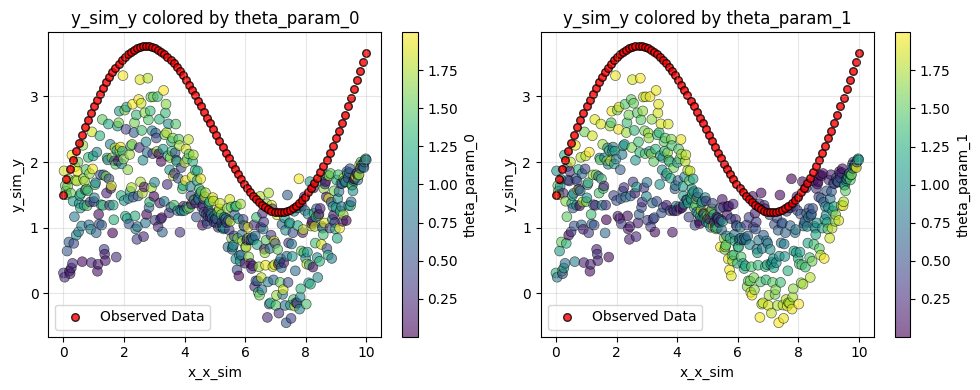

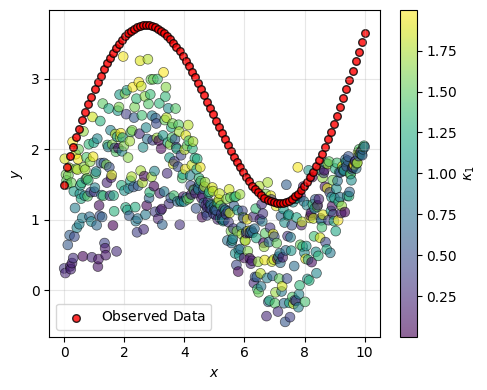

In [20]:
def generate_rawData_figure(model_data, obs_data, figures_directory):
    """
    Create subplots for each theta parameter showing:
    - X-axis: application domain (x values)
    - Y-axis: calibration metric (y values)
    - Point color: theta parameter value
    - Observed data points
    """
    
    model_x_columns = [col for col in model_data.columns if col.startswith('x_')]
    model_y_columns = [col for col in model_data.columns if col.startswith('y_')]
    observation_x_columns = [col for col in obs_data.columns if col.startswith('x_')] if obs_data is not None else []
    observation_y_columns = [col for col in obs_data.columns if col.startswith('xi_')] if obs_data is not None else []
    
    theta_columns = [col for col in model_data.columns if col.startswith('theta_')]
    
    if not model_x_columns or not model_y_columns or not theta_columns:
        print("Missing required columns (x_, y_, or theta_)")
        return
    
    # Use first y column as calibration metric
    y_col = model_y_columns[0]
    x_col = model_x_columns[0]
    
    # Create subplot grid for theta parameters
    n_theta = len(theta_columns)
    n_cols = int(np.ceil(np.sqrt(n_theta)))
    n_rows = int(np.ceil(n_theta / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    axes = np.atleast_1d(axes).flatten()
    
    for idx, theta_col in enumerate(theta_columns):
        ax = axes[idx]
        
        # Scatter plot colored by theta parameter value
        scatter = ax.scatter(model_data[x_col], model_data[y_col], 
                            c=model_data[theta_col], cmap='viridis', 
                            alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
        
        # Plot observed data
        if obs_data is not None and observation_y_columns and observation_y_columns[0] in obs_data.columns and observation_x_columns and observation_x_columns[0] in obs_data.columns:
            ax.scatter(obs_data[observation_x_columns[0]], obs_data[observation_y_columns[0]], color='red', label='Observed Data', alpha=0.8, s=30, edgecolors='black')
        
        ax.set_xlabel(f'{x_col}')
        ax.set_ylabel(f'{y_col}')
        ax.set_title(f'{y_col} colored by {theta_col}')
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # Add colorbar for each subplot
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label(theta_col)
    
    # Hide unused subplots
    for idx in range(n_theta, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    # plt_path = os.path.join(figures_directory, f'rawData_theta_parameters.png')
    # # plt.savefig(plt_path, dpi=150)
    # # print(f'Saved raw data figure to {plt_path}')
    # plt.close()
    plt.show()

generate_rawData_figure(model_data, obs_data, figures_directory=None)

# Single subplot: y vs x, colored by theta_0 (LaTeX-formatted captions)

model_x_columns = [c for c in model_data.columns if c.startswith("x_")]
model_y_columns = [c for c in model_data.columns if c.startswith("y_")]
observation_x_columns = [c for c in obs_data.columns if c.startswith("x_")] if obs_data is not None else []
observation_y_columns = [c for c in obs_data.columns if c.startswith("xi_")] if obs_data is not None else []

x_col = model_x_columns[0]
y_col = model_y_columns[0]
theta0_col = "theta_param_0"

fig, ax = plt.subplots(1, 1, figsize=(5, 4))

scatter = ax.scatter(
    model_data[x_col],
    model_data[y_col],
    c=model_data[theta0_col],
    cmap="viridis",
    alpha=0.6,
    s=50,
    edgecolors="black",
    linewidth=0.5
)

has_obs = (
    obs_data is not None
    and observation_x_columns
    and observation_y_columns
    and observation_x_columns[0] in obs_data.columns
    and observation_y_columns[0] in obs_data.columns
)

if has_obs:
    ax.scatter(
        obs_data[observation_x_columns[0]],
        obs_data[observation_y_columns[0]],
        color="red",
        label=r"$\mathrm{Observed\ Data}$",
        alpha=0.8,
        s=30,
        edgecolors="black"
    )
    ax.legend()

ax.set_xlabel(r"$x$")
ax.set_ylabel(r"$y$")
# ax.set_title(r"$y\ \mathrm{colored\ by}\ \theta_0$")
ax.grid(True, alpha=0.3)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label(r"$\kappa_1$")

plt.tight_layout()
plt.show()

In [21]:
# Functions for preforming the calibration 
import numpy as np
from scipy.linalg import cholesky, cho_solve
from scipy.stats import multivariate_normal, norm
from scipy.stats import invgamma

def rbf_kernel(X, Y, ell=1.0, var=1.0):
    X = np.atleast_2d(X)
    Y = np.atleast_2d(Y)
    sqdist = np.sum((X[:, None, :] - Y[None, :, :])**2, axis=2)
    return var * np.exp(-0.5 * sqdist / ell**2)

def log_likelihood(y, x, theta, delta, eta, sigma2):
    """
    y_i ~ N( eta(x_i, theta + delta(x_i)), sigma2 )
    """
    y_pred = np.zeros_like(y)

    for i in range(len(x)):
        theta_star = theta + delta[:, i]
        y_pred[i] = eta(x[i], theta_star)

    resid = y - y_pred
    return -0.5 * (
        np.sum(resid**2) / sigma2
        + len(y) * np.log(2 * np.pi * sigma2)
    )

def log_prior_delta(delta_k, K_delta_inv):
    return -0.5 * delta_k.T @ K_delta_inv @ delta_k

def gp_log_density(delta_k, K):
    """
    Stable log N(0,K) evaluation.
    """
    No = len(delta_k)
    L = np.linalg.cholesky(K)

    alpha = np.linalg.solve(L.T, np.linalg.solve(L, delta_k))

    logdet = 2*np.sum(np.log(np.diag(L)))

    return -0.5 * (delta_k @ alpha + logdet + No*np.log(2*np.pi))


def log_prior_hyperparams(ell, var, prior_ell, prior_var):
    """
    Log-prior for kernel hyperparameters (ell, var).

    prior_ell = {"mu": ..., "sigma": ...} on log(ell)
    prior_var = {"mu": ..., "sigma": ...} on log(var)
    """

    log_ell = np.log(ell)
    log_var = np.log(var)

    lp_ell = norm.logpdf(
        log_ell,
        loc=prior_ell["mu"],
        scale=prior_ell["sigma"]
    )

    lp_var = norm.logpdf(
        log_var,
        loc=prior_var["mu"],
        scale=prior_var["sigma"]
    )

    return lp_ell + lp_var

def mh_update_delta_hyperparams(
    delta_k, ell, var, x_md,
    prior_ell, prior_var,
    mh_scales
):
    log_ell_prop = np.log(ell) + mh_scales["log_ell_delta"] * np.random.randn()
    log_var_prop = np.log(var) + mh_scales["log_var_delta"] * np.random.randn()

    ell_prop = np.exp(log_ell_prop)
    var_prop = np.exp(log_var_prop)

    K_curr = rbf_kernel(x_md, x_md, ell=ell, var=var)+ 1e-8*np.eye(len(x_md))
    K_prop = rbf_kernel(x_md, x_md, ell=ell_prop, var=var_prop) + 1e-8*np.eye(len(x_md))

    logp_curr = (
        multivariate_normal.logpdf(delta_k, mean=np.zeros(len(delta_k)), cov=K_curr, allow_singular=True)
        + log_prior_hyperparams(ell, var, prior_ell, prior_var)
    )

    logp_prop = (
        multivariate_normal.logpdf(delta_k, mean=np.zeros(len(delta_k)), cov=K_prop, allow_singular=True)
        + log_prior_hyperparams(ell_prop, var_prop, prior_ell, prior_var)
    )

    if np.log(np.random.rand()) < (logp_prop - logp_curr):
        return ell_prop, var_prop, True
    else:
        return ell, var, False
    
def gibbs_sigma2(y_obs, x_obs, theta, kappa, delta_eta, gp_eta, a, b):

    resid = np.zeros_like(y_obs)

    for i in range(len(y_obs)):
        theta_star = theta + kappa[:, i]
        m_i, _ = eta_predict(x_obs[i], theta_star, gp_eta)
        resid[i] = y_obs[i] - (m_i + delta_eta[i])

    a_post = a + len(y_obs)/2
    b_post = b + 0.5*np.sum(resid**2)

    return invgamma.rvs(a_post, scale=b_post)

def gibbs_delta_eta(x_obs, y_obs, theta, kappa, gp_eta, sigma2, ell_eta, var_eta):

    No = len(x_obs)

    # --- build covariance ---
    K = rbf_kernel(x_obs, x_obs, ell=ell_eta, var=var_eta)
    K += 1e-8 * np.eye(No)

    # --- compute residual ---
    r = np.zeros(No)

    for i in range(No):
        theta_star = theta + kappa[:, i]
        m_i, _ = eta_predict(x_obs[i], theta_star, gp_eta)
        r[i] = y_obs[i] - m_i

    # --- posterior ---
    K_inv = np.linalg.inv(K)
    Sigma_post = np.linalg.inv(K_inv + (1/sigma2)*np.eye(No))

    mu_post = Sigma_post @ ((1/sigma2) * r)

    return np.random.multivariate_normal(mu_post, Sigma_post)

def eta_predict(x, theta_star, gp_eta):

    x = np.atleast_1d(np.asarray(x))
    theta_star = np.atleast_1d(np.asarray(theta_star))

    z = np.hstack([x, theta_star]).reshape(1, -1)

    m, s2 = gp_eta.predict(z, return_std=True)

    return m[0], s2[0]**2


def log_likelihood_embedded(y_obs, x_obs, theta, kappa,delta_eta, gp_eta, sigma2):
    """
    y_i ~ N( m_i , sigma2 + s_i^2 )
    where emulator provides (m_i, s_i^2)
    """
    N = len(y_obs)
    loglike = 0.0

    for i in range(N):

        theta_star = theta + kappa[:, i]
        # m_i, _ = eta_predict(x_obs[i], theta_star, gp_eta)

        m_i, s2_i = eta_predict(
            x_obs[i],
            theta_star,
            gp_eta
        )

        total_var = sigma2 + s2_i

        resid = y_obs[i] - (m_i + delta_eta[i])

        loglike += -0.5 * (
            np.log(2*np.pi*total_var)
            + resid**2 / total_var
        )

    return loglike

def mh_update_delta_k(
    k, kappa, delta_eta, theta,
    ell_k, var_k,
    x_obs, y_obs,
    gp_eta,
    sigma2,
    mh_scale
):
    No = len(x_obs)

    # --- GP prior covariance ---
    K = rbf_kernel(x_obs, x_obs, ell=ell_k, var=var_k) + 1e-8*np.eye(No)
    L = np.linalg.cholesky(K)

    # --- proposal ---
    proposal = kappa[k] + mh_scale * (L @ np.random.randn(No))

    delta_prop = kappa.copy()
    delta_prop[k] = proposal

    # --- log posterior current ---
    logpost_curr = (
        log_likelihood_embedded(y_obs, x_obs, theta, kappa, delta_eta, gp_eta, sigma2)
        + gp_log_density(kappa[k], K)
    )

    # --- log posterior proposed ---
    logpost_prop = (
        log_likelihood_embedded(y_obs, x_obs, theta, delta_prop, delta_eta, gp_eta, sigma2)
        + gp_log_density(proposal, K)
    )

    # print("mean proposal jump:", np.linalg.norm(delta_prop - delta))

    log_alpha = logpost_prop - logpost_curr

    # print(f"log posterior current: {logpost_curr:.3f}, proposed: {logpost_prop:.3f}, log alpha: {log_alpha:.3f}")

    if np.log(np.random.rand()) < log_alpha:
        kappa[k] = proposal
        return kappa, True
    else:
        return kappa, False
    



In [22]:
#some plotting functions for visualizing the calibration results
# plotting functions

def plot_delta_acceptance_trajectory(accept_trace, window=50, figures_directory=None):
    """
    Plot acceptance-rate trajectories for each discrepancy GP delta_k.

    Parameters
    ----------
    accept_trace : list of lists
        accept_trace[k][t] = 1 if delta_k accepted at iteration t, else 0

    window : int
        Rolling window size for smoothing acceptance rates

    Output
    ------
    Displays a trajectory plot of rolling acceptance rates.
    """

    n_delta = len(accept_trace)

    plt.figure(figsize=(10, 6))

    for k in range(n_delta):
        accepts = np.array(accept_trace[k])

        # Rolling acceptance rate
        rolling = np.convolve(
            accepts,
            np.ones(window) / window,
            mode="valid"
        )

        plt.plot(
            rolling,
            label=f"delta[{k}]"
        )

    plt.axhline(0.25, linestyle="--", label="Target ~0.25")
    plt.axhline(0.50, linestyle="--", label="Target ~0.50")

    plt.xlabel("Iteration")
    plt.ylabel(f"Rolling Acceptance Rate (window={window})")
    plt.title("Delta GP Acceptance Rate Trajectories")
    plt.legend()
    plt.grid(True)
    plt.show()
    # plt_path = os.path.join(figures_directory, f"delta_acceptance_trajectory.png")
    # plt.savefig(plt_path, dpi=150)
    # print(f"Saved delta acceptance trajectory figure to {plt_path}")
    plt.close()

def plot_delta_jump_sizes(delta_chain, figures_directory=None):
    """
    Plot jump magnitudes ||delta^(t) - delta^(t-1)|| for each delta_k.

    Parameters
    ----------
    delta_chain : array
        Shape (Nmcmc, dtheta, n_obs)
        Stored delta latent fields across iterations.

    Output
    ------
    Line plot of jump norms for each discrepancy GP.
    """

    Nmcmc, dtheta, n_obs = delta_chain.shape

    plt.figure(figsize=(10, 6))

    for k in range(dtheta):

        # difference between successive iterations
        diffs = delta_chain[1:, k, :] - delta_chain[:-1, k, :]

        # norm of each jump
        jump_norms = np.linalg.norm(diffs, axis=1)

        plt.plot(jump_norms, label=f"delta[{k}] jump size")

    plt.xlabel("Iteration")
    plt.ylabel(r"$\|\delta^{(t)} - \delta^{(t-1)}\|$")
    plt.title("Delta GP Jump Magnitudes (Mixing Diagnostic)")
    plt.legend()
    plt.grid(True)
    plt.show()
    # plt_path = os.path.join(figures_directory, f"delta_jump_sizes.png")
    # plt.savefig(plt_path, dpi=150)
    # print(f"Saved delta jump size figure to {plt_path}")
    plt.close()

def plot_discrepancy_diagnostics_realspace(
    obs_data,
    model_data,
    model_normalized,
    x_obs,
    y_obs,
    theta_fixed,
    gp_eta,
    y_prior_mean,
    y_prior_var,
    delta_eta_mean,
    delta_eta_std,
    y_post_mean,
    y_post_var,
    y_sim_phys,
    y_sd,
    kappa_chain,
    idx,
    dtheta,
    figures_directory=None,
    output_directory=None
):
    # --- normalized arrays ---
    x_n = np.asarray(x_obs).ravel()
    y_obs_n = np.asarray(y_obs).ravel()
    y_prior_mean_n = np.asarray(y_prior_mean).ravel()
    y_prior_var_n = np.asarray(y_prior_var).ravel()
    delta_eta_mean_n = np.asarray(delta_eta_mean).ravel()
    delta_eta_std_n = np.asarray(delta_eta_std).ravel()
    y_post_mean_n = np.asarray(y_post_mean).ravel()
    y_post_var_n = np.asarray(y_post_var).ravel()

    # If prior arrays are not evaluated at x_obs, recompute in normalized space
    if y_prior_mean_n.shape[0] != x_n.shape[0] or y_prior_var_n.shape[0] != x_n.shape[0]:
        Z_obs = np.hstack([x_n.reshape(-1, 1), np.tile(theta_fixed, (x_n.shape[0], 1))])
        y_prior_mean_n = gp_eta.predict(Z_obs)
        y_prior_var_n = np.diag(gp_eta.predict(Z_obs, return_cov=True)[1])

    # --- infer columns ---
    obs_x_col = [c for c in obs_data.columns if c.startswith("x_")][0]
    obs_y_col = [c for c in obs_data.columns if c.startswith("xi_")][0]
    model_y_col = [c for c in model_data.columns if c.startswith("y_")][0]

    # --- x reverse-normalization (observation scaling) ---
    x_min, x_max = obs_data[obs_x_col].min(), obs_data[obs_x_col].max()
    x_phys = x_n * (x_max - x_min) + x_min

    # --- y reverse-normalization ---
    # observation/posterior/delta_eta are in observation-normalized y-space
    obs_y_mean = obs_data[obs_y_col].mean()
    obs_y_std = obs_data[obs_y_col].std()

    # emulator prior is in model-normalized y-space
    prior_mean_col = f"{model_y_col}_mean"
    prior_std_col = f"{model_y_col}_std"
    if model_normalized is not None and prior_mean_col in model_normalized.columns and prior_std_col in model_normalized.columns:        
        prior_y_mean = float(model_normalized[prior_mean_col].iloc[0])
        prior_y_std = float(model_normalized[prior_std_col].iloc[0])
    else:
        prior_y_mean = float(np.mean(y_sim_phys)) if "y_sim_phys" in globals() else obs_y_mean
        prior_y_std = float(y_sd) if "y_sd" in globals() else obs_y_std

    y_obs_phys = y_obs_n * obs_y_std + obs_y_mean
    y_prior_mean_phys = y_prior_mean_n * prior_y_std + prior_y_mean
    y_prior_var_phys = y_prior_var_n * (prior_y_std ** 2)
    delta_eta_mean_phys = delta_eta_mean_n * obs_y_std
    delta_eta_std_phys = delta_eta_std_n * obs_y_std
    y_post_mean_phys = y_post_mean_n * obs_y_std + obs_y_mean
    y_post_var_phys = y_post_var_n * (obs_y_std ** 2)

    # simulator data in physical space
    x_sim_phys_local = model_data[[c for c in model_data.columns if c.startswith("x_")][0]].values
    y_sim_phys_local = model_data[model_y_col].values

    # sort by x for clean plotting
    order = np.argsort(x_phys)
    x_phys = x_phys[order]
    y_obs_phys = y_obs_phys[order]
    y_prior_mean_phys = y_prior_mean_phys[order]
    y_prior_var_phys = y_prior_var_phys[order]
    delta_eta_mean_phys = delta_eta_mean_phys[order]
    delta_eta_std_phys = delta_eta_std_phys[order]
    y_post_mean_phys = y_post_mean_phys[order]
    y_post_var_phys = y_post_var_phys[order]

    # layout
    n_rows = 2 + dtheta
    fig = plt.figure(figsize=(10, 3.2 * n_rows))
    gs = fig.add_gridspec(n_rows, 2)

    # Top Left: Emulator Prior (physical)
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.scatter(x_phys, y_obs_phys, label="Observed", color="black")
    ax1.plot(x_phys, y_prior_mean_phys, label="η(x, θ)", linestyle="--")
    ax1.scatter(x_sim_phys_local, y_sim_phys_local, label="Simulator Data", color="orange", alpha=0.5)
    ax1.fill_between(
        x_phys,
        y_prior_mean_phys - 2 * np.sqrt(y_prior_var_phys),
        y_prior_mean_phys + 2 * np.sqrt(y_prior_var_phys),
        alpha=0.15
    )
    ax1.set_title("Emulator Prior")
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.legend()

   

    # Top Right: delta_eta contribution (physical y-units)
    ax2 = fig.add_subplot(gs[0, 1])
    

    obs_x_col = [c for c in obs_data.columns if c.startswith("x_")][0]
    # --- use MODEL normalization, not OBS ---
    model_x_col = [c for c in model_data.columns if c.startswith("x_")][0]
    model_x_min = model_data[model_x_col].min()
    model_x_max = model_data[model_x_col].max()

    x_norm_model = (x_phys - model_x_min) / (model_x_max - model_x_min)

    # delta_eta_true_norm = x_norm_model ** 2

    delta_eta_true_phys = 0.5 * np.sqrt(x_phys)

    # --- correct transformation ---
    # --- reconstruct δ_eta in physical space ---
    delta_eta_mean_phys = y_post_mean_phys - y_prior_mean_phys

    # uncertainty: combine posterior + prior (approx)
    delta_eta_std_phys = np.sqrt(
        y_post_var_phys + y_prior_var_phys
    )


    ax2.plot(x_phys, delta_eta_mean_phys, label=rf"$\delta_{{\eta}}(x)$ mean")
    ax2.fill_between(
        x_phys,
        delta_eta_mean_phys - 2 * delta_eta_std_phys,
        delta_eta_mean_phys + 2 * delta_eta_std_phys,
        alpha=0.85
    )

    ax2.plot(
        x_phys,
        delta_eta_true_phys,
        color="red",
        linestyle="--",
        linewidth=2,
        label=r"True $\delta_{\eta}(x)=0.5\sqrt{x}$"
    )

    ax2.axhline(0, linestyle="--")
    ax2.set_title(r"Additive Discrepancy $\delta_{\eta}(x)$")
    ax2.set_xlabel('x')
    ax2.set_ylabel("Correction")
    ax2.legend()

    # kappa subplots (physical theta-units)
    theta_cols = [c for c in model_data.columns if c.startswith("theta_")]
    use_idx = idx if "idx" in globals() else np.random.choice(kappa_chain.shape[0], size=min(200, kappa_chain.shape[0]), replace=False)
    # add 'true values of theta for comparison
    theta_0_true = 1.5
    theta_1_true = 1.75


    for k in range(dtheta):
        plot_label=k+1
        ax_k = fig.add_subplot(gs[1 + k, :])

        dt_mean_n = kappa_chain[use_idx, k, :].mean(axis=0)
        dt_std_n = kappa_chain[use_idx, k, :].std(axis=0)

        theta_min = model_data[theta_cols[k]].min()
        theta_max = model_data[theta_cols[k]].max()
        theta_range = theta_max - theta_min

        dt_mean_phys = (dt_mean_n * theta_range)[order]
        dt_std_phys = (dt_std_n * theta_range)[order]

        ax_k.plot(x_phys, dt_mean_phys, label=rf"$\kappa_{plot_label}(x)$ mean")
        ax_k.fill_between(
            x_phys,
            dt_mean_phys - 2 * dt_std_phys,
            dt_mean_phys + 2 * dt_std_phys,
            alpha=0.3
        )

        # add horizontal line for true theta correction: (true value - mean value used)
        theta_true_vals = [theta_0_true, theta_1_true]       
        if k < len(theta_true_vals):
            theta_col_k = theta_cols[k]
            theta_mean_col = f"{theta_col_k}_mean"

            # if model_normalized is not None and prior_mean_col in model_normalized.columns and prior_std_col in model_normalized.columns:                theta_mean_used = float(model_normalized[theta_mean_col].iloc[0])
            #     # print(f"Using normalized mean for {theta_col_k}: {theta_mean_used:.3f}")
            # elif "theta_fixed" in globals():
            #     theta_mean_used = float(theta_fixed[k])
            #     # print(f"Using fixed theta for {theta_col_k}: {theta_mean_used:.3f}")
            # else:
            #     theta_mean_used = float(model_data[theta_col_k].mean())
            #     # print(f"Using data mean for {theta_col_k}: {theta_mean_used:.3f}")

            # true_correction = float(theta_true_vals[k]) - theta_mean_used
            # ax_k.axhline(
            # true_correction,
            # color="red",
            # linestyle=":",
            # label=rf"True $\kappa_{plot_label}$ correction"
            # )

        ax_k.axhline(0, linestyle="--")
        ax_k.set_title(rf"Calibration Discrepancy $\kappa_{plot_label}(x)$")
        ax_k.set_xlabel('x')
        ax_k.set_ylabel(rf"$\kappa_{{{plot_label}}} - \bar{{\kappa}}_{{{plot_label}}}$")
        ax_k.legend()

    # Bottom: Full Posterior (physical) with uncertainty band
    ax3 = fig.add_subplot(gs[1 + dtheta, :])
    ax3.scatter(x_phys, y_obs_phys, label="Observed", color="black", s=18, zorder=3)
    ax3.plot(x_phys, y_post_mean_phys, label="Posterior Mean", color="C1", linewidth=2, zorder=4)

    # Coupled uncertainty from discrepancy terms: δη(x) + Σk δθk(x)
    # (captures cross-correlation across theta components via joint chain samples)
    theta_ranges = np.array(
        [model_data[c].max() - model_data[c].min() for c in theta_cols],
        dtype=float
    )

    # kappa_chain: (n_samples, dtheta, n_x) in normalized theta units
    dt_samples_phys = kappa_chain[use_idx, :, :] * theta_ranges[None, :, None]
    dt_sum_phys = dt_samples_phys.sum(axis=1)[:, order]  # (n_samples, n_x), sorted by x

    # Sample delta_eta in physical y-units (no joint chain with kappa available)
    rng = np.random.default_rng(0)
    eta_samples_phys = rng.normal(
        loc=delta_eta_mean_phys[None, :],
        scale=np.clip(delta_eta_std_phys[None, :], 0.0, None),
        size=dt_sum_phys.shape
    )

    # Total discrepancy samples and uncertainty envelope
    discrepancy_samples_phys = eta_samples_phys + dt_sum_phys
    coupled_std_phys = np.std(discrepancy_samples_phys, axis=0, ddof=1)

    ax3.fill_between(
        x_phys,
        y_post_mean_phys - 2.0 * coupled_std_phys,
        y_post_mean_phys + 2.0 * coupled_std_phys,
        color="C1",
        alpha=0.85,
        label="Coupled Discrepancy Uncertainty (±2σ)",
        zorder=2
    )

    # Include the prior as translucent points for reference
    ax3.scatter(x_phys, y_prior_mean_phys, label="Emulator Prior Mean", color="C0", alpha=0.5, s=12, zorder=1)
    

    ax3.set_title("Full Posterior Prediction")
    ax3.set_xlabel('x')
    ax3.set_ylabel('y')
    ax3.legend()

    plt.tight_layout()
    plt.show()
    # plt_path = os.path.join(figures_directory, f"discrepancy_diagnostics_realspace.png")
    # plt.savefig(plt_path, dpi=150)
    # print(f"Saved discrepancy diagnostics figure to {plt_path}")
    plt.close()

In [23]:
# define an objective function for evaluating the calibration results with different input parameter

def run_calibration(params):
    # ============================================================
    # 1. Extract normalized arrays from your DataFrames
    # ============================================================

    # ---- simulator dataframe ----
    x_sim = model_normalized["x_x_sim"].values.reshape(-1, 1)

    theta_sim = model_normalized[[
    "theta_param_0",
    "theta_param_1"
    ]].values

    y_sim = model_normalized["y_sim_y"].values


    # ---- observation dataframe ----
    x_obs = observation_normalized["x_obs_x"].values.reshape(-1, 1)
    y_obs = observation_normalized["xi_obs_y"].values


    print("Simulator design shape:", x_sim.shape, theta_sim.shape)
    print("Observation shape:", x_obs.shape, y_obs.shape)

    dtheta = theta_sim.shape[1]
    No = len(x_obs)

    # ============================================================
    # 2. Train probabilistic emulator GP η(x,θ)
    # ============================================================

    from sklearn.gaussian_process import GaussianProcessRegressor
    from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

    Z_sim = np.hstack([x_sim, theta_sim])

    kernel_eta = C(1.0, (1e-2, 1e2)) * RBF(
        length_scale=np.ones(Z_sim.shape[1]),
        length_scale_bounds=(1e-2, 1e2)
    )

    gp_eta = GaussianProcessRegressor(
        kernel=kernel_eta,
        alpha=1e-6,
        normalize_y=False,
        n_restarts_optimizer=5
    )

    gp_eta.fit(Z_sim, y_sim)

    print("\nTrained emulator kernel:")
    print(gp_eta.kernel_)

    # save the following prior information: y_prior_mean,y_prior_var,delta_eta_mean,delta_eta_std,
    y_prior_mean = gp_eta.predict(Z_sim)
    y_prior_var = np.diag(gp_eta.predict(Z_sim, return_cov=True)[1])

    # Plot emulator prior in row-wise subplots: normalized (top) and physical (bottom)

    # ---- normalized ----
    x_sim_norm = x_sim.flatten()
    y_sim_norm = y_sim
    y_prior_std = np.sqrt(y_prior_var)

    # ---- physical ----
    x_sim_phys = model_data["x_x_sim"].values
    y_sim_phys = model_data["y_sim_y"].values

    # Reverse normalization using stored stats in normalized dataframe
    y_mu = model_normalized["y_sim_y_mean"].iloc[0]
    y_sd = model_normalized["y_sim_y_std"].iloc[0]

    y_prior_mean_phys = y_prior_mean * y_sd + y_mu
    y_prior_std_phys = y_prior_std * y_sd

    # # sort for clean line/fill plotting
    # idx_norm = np.argsort(x_sim_norm)
    # idx_phys = np.argsort(x_sim_phys)

    # fig, axes = plt.subplots(2, 1, figsize=(9, 9))

    # # Top: normalized
    # axes[0].scatter(x_sim_norm, y_sim_norm, color="blue", alpha=0.6, label="Simulator Data")
    # axes[0].plot(x_sim_norm[idx_norm], y_prior_mean[idx_norm], color="orange", label="Emulator Prior Mean")
    # axes[0].fill_between(
    #     x_sim_norm[idx_norm],
    #     (y_prior_mean - 2 * y_prior_std)[idx_norm],
    #     (y_prior_mean + 2 * y_prior_std)[idx_norm],
    #     color="orange",
    #     alpha=0.2,
    #     label="Prior ±2σ",
    # )
    # axes[0].set_title("Normalized Space")
    # axes[0].set_xlabel("x (normalized)")
    # axes[0].set_ylabel("y (normalized)")
    # axes[0].grid(True)
    # axes[0].legend()

    # # Bottom: physical
    # axes[1].scatter(x_sim_phys, y_sim_phys, color="blue", alpha=0.6, label="Simulator Data")
    # axes[1].plot(x_sim_phys[idx_phys], y_prior_mean_phys[idx_phys], color="green", label="Emulator Prior Mean")
    # axes[1].fill_between(
    #     x_sim_phys[idx_phys],
    #     (y_prior_mean_phys - 2 * y_prior_std_phys)[idx_phys],
    #     (y_prior_mean_phys + 2 * y_prior_std_phys)[idx_phys],
    #     color="green",
    #     alpha=0.2,
    #     label="Prior ±2σ",
    # )
    # axes[1].set_title("Physical Space")
    # axes[1].set_xlabel("x_x_sim")
    # axes[1].set_ylabel("y_y_sim")
    # axes[1].grid(True)
    # axes[1].legend()

    # plt.tight_layout()
    # plt.show()

    delta_eta_mean = np.zeros(No)
    delta_eta_std = np.zeros(No)


    # ============================================================
    # 3. Initialize θ (fixed plug-in estimate)
    # ============================================================

    theta_fixed = theta_sim.mean(axis=0)

    print("\nFixed theta used:")
    print(theta_fixed)


    # ============================================================
    # 4a. Initialize discrepancy δₖ(x) latent vectors
    # ============================================================

    kappa = np.zeros((dtheta, No))
    # delta_eta= np.zeros(No)

    # Initial hyperparameters for each δₖ
    ell_delta = params['ell_delta'] * np.ones(dtheta)
    # var_delta = 0.05 * np.ones(dtheta)
    var_delta = params['var_delta'] * np.ones(dtheta) # start with smaller variance to encourage more conservative initial discrepancy fields, which can help stabilize early sampling

    # Initial noise variance
    sigma2 = params['sigma2']

    # ============================================================
    # 4b. Initialize additive discrepancy δ_eta(x)
    # ============================================================

    delta_eta = np.zeros(No)

    # hyperparameters for δ_eta GP
    ell_eta = params['ell_eta']
    var_eta = params['var_eta']


    # ============================================================
    # 5. Sampler config
    # ============================================================

    Nmcmc = 2000

    # create a separate MH scale for each theta the delta_k updates, which we will adapt during burn-in

    mh_scale_delta = np.ones(dtheta) * 0.1 # initial guess, will be adapted per input parameter during burn-in to target acceptance rates in the 0.25-0.50 range

    for k in range(dtheta):
        print(f"Initial MH scale for delta[{k}] = {mh_scale_delta[k]:.4f}")

    prior_ell = {"mu": -1.0, "sigma": 1.0}
    prior_var = {"mu": -2.0, "sigma": 1.0}

    mh_scales = {
        "log_ell_delta": 0.1,
        "log_var_delta": 0.1
    }

    a_sigma = 2.0
    b_sigma = 0.5


    # Storage
    kappa_chain = np.zeros((Nmcmc, dtheta, No))
    theta_star_chain = np.zeros((Nmcmc, dtheta, No))
    delta_eta_chain = np.zeros((Nmcmc, No))
    sigma2_chain = np.zeros(Nmcmc)

    accept_delta = np.zeros(dtheta)

    # --- acceptance trace storage ---
    accept_trace = [[] for _ in range(dtheta)]

    # --- MH scaling adaptation settings ---
    burnin = 200
    adapt_interval = 20
    target_accept = 0.35


    # store scale history (optional)
    mh_scale_trace = []



    # ============================================================
    # 6. Run Embedded Discrepancy Sampler
    # ============================================================

    print("\nRunning embedded δ-MH sampler...\n")

    for it in range(Nmcmc):

        # ---- update δₖ fields ----
        for k in range(dtheta):
            kappa, acc = mh_update_delta_k(
                k,
                kappa,
                delta_eta,
                theta_fixed,
                ell_delta[k],
                var_delta[k],
                x_obs,
                y_obs,
                gp_eta,
                sigma2,
                mh_scale_delta[k]
            )
            accept_delta[k] += acc
            accept_trace[k].append(acc)

            kappa[k] -= np.mean(kappa[k])
            
        # ---- adapt mh_scale_delta during burn-in ----
        if it < burnin and (it + 1) % adapt_interval == 0:

            gamma = 0.05  # adaptation speed

            for k in range(dtheta):

                # acceptance rate over last window
                recent_accept_k = np.mean(accept_trace[k][-adapt_interval:])

                # log-scale update
                mh_scale_delta[k] *= np.exp(gamma * (recent_accept_k - target_accept))

                print(f"[ADAPT] Iter {it+1}, k={k}: acc={recent_accept_k:.3f}, scale={mh_scale_delta[k]:.4f}")
                print(f"[ADAPT] Updated mh_scale_delta for theta_{k} = {mh_scale_delta[k]:.4f}")



        # ---- update δ hyperparameters ----
        for k in range(dtheta):
            ell_delta[k], var_delta[k], _ = mh_update_delta_hyperparams(
                kappa[k],
                ell_delta[k],
                var_delta[k],
                x_obs,
                prior_ell,
                prior_var,
                mh_scales
            )

        # ---- update δ_eta (Gibbs) ----
        delta_eta = gibbs_delta_eta(
            x_obs,
            y_obs,
            theta_fixed,
            kappa,
            gp_eta,
            sigma2,
            ell_eta,
            var_eta
        )

        # ---- Gibbs update σ² ----
        sigma2 = gibbs_sigma2(
        y_obs,
        x_obs,
        theta_fixed,
        kappa,
        delta_eta,   # NEW
        gp_eta,
        a_sigma,
        b_sigma
    )

        # ---- store ----
        kappa_chain[it] = kappa
        theta_star_chain[it] = theta_fixed[:, None] + kappa
        delta_eta_chain[it] = delta_eta
        sigma2_chain[it] = sigma2

        # ---- diagnostics ----
        if (it+1) % 50 == 0:
            print(f"Iter {it+1}/{Nmcmc}")
            print(" sigma2 =", sigma2)
            print(" delta acceptance rates:",
                accept_delta / (it+1))
            print(" ell_delta:", ell_delta)
            print(" var_delta:", var_delta)

            print("--------------------------------------------------")


    print("\nSampler complete.")


    # ============================================================
    # 7. Posterior Predictive Check
    # ============================================================

    print("\nBuilding posterior predictive mean + uncertainty...\n")

    y_post_mean = np.zeros(No)
    y_post_var  = np.zeros(No)

    Nsamp = 200
    idx = np.random.choice(Nmcmc, Nsamp, replace=False)

    for i in range(No):

        preds = []

        for s in idx:

            kappa_s = kappa_chain[s, :, i]
            theta_star = theta_fixed + kappa_s
            delta_eta_s = delta_eta_chain[s, i]


            m_i, s2_i = eta_predict(x_obs[i], theta_star, gp_eta)

            preds.append(m_i+delta_eta_s)

        preds = np.array(preds)
        

        y_post_mean[i] = preds.mean()
        y_post_var[i]  = preds.var()

        delta_eta_mean[i] = delta_eta_chain[idx, i].mean()
        delta_eta_std[i] = delta_eta_chain[idx, i].std()

        # print prediction mean and 95% credible interval
        print(f"x_obs[{i}] = {x_obs[i,0]:.3f}, y_obs = {y_obs[i]:.3f}, post pred mean = {y_post_mean[i]:.3f}, 95% CI = [{y_post_mean[i] - 2*np.sqrt(y_post_var[i]):.3f}, {y_post_mean[i] + 2*np.sqrt(y_post_var[i]):.3f}]")
        print(f" delta_eta mean = {delta_eta_mean[i]:.3f}, std = {delta_eta_std[i]:.3f}")

    # ============================================================
    # 8. Plot Posterior Predictive Fit
    # ============================================================

    plt.figure()
    plt.scatter(x_obs, y_obs, label="Observed y", marker="o")

    plt.plot(x_obs, y_post_mean, label="Posterior mean prediction")

    plt.fill_between(
        x_obs.ravel(),
        y_post_mean - 2*np.sqrt(y_post_var),
        y_post_mean + 2*np.sqrt(y_post_var),
        alpha=0.3,
        label="±2 posterior std"
    )

    plt.title("Embedded Discrepancy Posterior Predictive Fit")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.legend()
    plt.show()

    # ============================================================
    # 9. Convert values to physical space for further analysis/plotting
    # ============================================================
    
    # return the posterior predictive mean/variance, delta_eta mean/std, and the kappa chain for further analysis and plotting in physical space

    # --- normalized arrays ---
    x_n = np.asarray(x_obs).ravel()
    y_obs_n = np.asarray(y_obs).ravel()
    y_prior_mean_n = np.asarray(y_prior_mean).ravel()
    y_prior_var_n = np.asarray(y_prior_var).ravel()
    delta_eta_mean_n = np.asarray(delta_eta_mean).ravel()
    delta_eta_std_n = np.asarray(delta_eta_std).ravel()
    y_post_mean_n = np.asarray(y_post_mean).ravel()
    y_post_var_n = np.asarray(y_post_var).ravel()

    # --- infer columns ---
    obs_x_col = [c for c in obs_data.columns if c.startswith("x_")][0]
    obs_y_col = [c for c in obs_data.columns if c.startswith("xi_")][0]
    model_y_col = [c for c in model_data.columns if c.startswith("y_")][0]
    theta_cols = [c for c in model_data.columns if c.startswith("theta_")]
    use_idx = idx if "idx" in globals() else np.random.choice(kappa_chain.shape[0], size=min(200, kappa_chain.shape[0]), replace=False)

    # --- x reverse-normalization (observation scaling) ---
    x_min_obs, x_max_obs = obs_data[obs_x_col].min(), obs_data[obs_x_col].max()
    x_obs_phys = x_n * (x_max_obs - x_min_obs) + x_min_obs

    # sort by x for clean plotting
    order = np.argsort(x_obs_phys)

    # --- y reverse-normalization ---
    # observation/posterior/delta_eta are in observation-normalized y-space
    obs_y_mean = obs_data[obs_y_col].mean()
    obs_y_std = obs_data[obs_y_col].std()

    y_obs_phys = y_obs_n * obs_y_std + obs_y_mean

    # prior eta emulator
    y_prior_mean_phys = y_prior_mean_n * obs_y_std + obs_y_mean
    y_prior_var_phys = y_prior_var_n * obs_y_std**2

    # additive discrepancy contribution
    delta_eta_mean_phys = delta_eta_mean_n * obs_y_std
    delta_eta_std_phys = delta_eta_std_n * obs_y_std

    # posterior predictive
    y_post_mean_phys = y_post_mean_n * obs_y_std + obs_y_mean
    y_post_var_phys = y_post_var_n * obs_y_std**2

    # kappa chain and theta_star chain reverse-normalization (model normalization)
    theta_ranges = np.array(
        [model_data[c].max() - model_data[c].min() for c in theta_cols],
        dtype=float
    )
    kappa_chain_phys = kappa_chain * theta_ranges[None, :, None]
    kappa_chain_phys = kappa_chain_phys[:, :, order]  # sort by x

    theta_star_chain_phys = theta_fixed[None, :, None] + kappa_chain_phys

    # sigma2 chain is in observation-normalized y-space, so convert to physical space
    sigma2_chain_phys = sigma2_chain * obs_y_std**2

    # ============================================================
    # 9. Output results in both normalized and physical space for further analysis and plotting
    # ============================================================

    # store normalized results in a dictionary for return
    results_normalized = {
        "x_obs": x_n,
        "y_obs": y_obs_n,
        "y_prior_mean": y_prior_mean_n,
        "y_prior_var": y_prior_var_n,
        "delta_eta_mean": delta_eta_mean_n,
        "delta_eta_std": delta_eta_std_n,
        "y_post_mean": y_post_mean_n,
        "y_post_var": y_post_var_n,
        "kappa_chain": kappa_chain,
        "theta_star_chain": theta_star_chain,
        "sigma2_chain": sigma2_chain,
    }

    # store real-space results in a dictionary for return
    results_physical = {
        "x_obs": x_obs_phys,
        "y_obs": y_obs_phys,
        "y_prior_mean": y_prior_mean_phys,
        "y_prior_var": y_prior_var_phys,
        "delta_eta_mean": delta_eta_mean_phys,
        "delta_eta_std": delta_eta_std_phys,
        "y_post_mean": y_post_mean_phys,
        "y_post_var": y_post_var_phys,
        "kappa_chain": kappa_chain_phys,
        "theta_star_chain": theta_star_chain_phys,
        "sigma2_chain": sigma2_chain_phys

    }

    plot_delta_acceptance_trajectory(accept_trace, window=50)
    plot_delta_jump_sizes(kappa_chain)
    
    return(results_normalized, results_physical)

In [24]:

# known loss functions for calibration evaluation
# delta_eta= 0.5 * np.sqrt(x_obs.flatten())
# kappa_1_true = 1.5
# kappa_2_true = 1.75
# fixed theta used in the sampler: theta_fixed = [1.0, 1.0]
# so true kappa corrections are:
# kappa_1_true = kappa_1_true - theta_fixed[0] = 0.5
# kappa_2_true = kappa_2_true - theta_fixed[1] = 0.75
import optuna

def objective(trial):

    # -----------------------------
    # 1. Sample hyperparameters
    # -----------------------------
    params = {
        'ell_delta': trial.suggest_float("ell_delta", 0.05, 2.0, log=True),
        'var_delta': trial.suggest_float("var_delta", 1e-4, 0.1, log=True),
        'ell_eta': trial.suggest_float("ell_eta", 0.05, 5.0, log=True),
        'var_eta': trial.suggest_float("var_eta", 1e-4, 0.1, log=True),
        'sigma2': trial.suggest_float("sigma2", 1e-5, 1e-2, log=True),
    }

    # -----------------------------
    # 2. Run your calibration routine
    # -----------------------------
    (
        results_normalized,
        results_physical
    ) = run_calibration(params)

    # -----------------------------
    # 3. Compute loss (physical space)
    # -----------------------------
    dtheta = results_physical["kappa_chain"].shape[1]
    x_obs_phys = results_physical["x_obs"]
    y_obs_phys = results_physical["y_obs"]
    y_post_mean_phys = results_physical["y_post_mean"]
    delta_eta_mean = results_physical["delta_eta_mean"]
    kappa_chain = results_physical["kappa_chain"]
    theta_fixed = np.array([1.0, 1.0])  # known fixed theta used in the sampler
    delta_eta_true_phys = 0.5 * np.sqrt(x_obs_phys)
    kappa_k_true = np.array([0.5, 0.75])

    mse_y = np.mean((y_post_mean_phys - y_obs_phys.flatten())**2)

    mse_delta_eta = np.mean(
        (delta_eta_mean - delta_eta_true_phys)**2
    )

    mse_kappa = 0.0
    for k in range(dtheta):
        kappa_mean_k = kappa_chain[:, k, :].mean(axis=0)
        true_val = kappa_k_true[k] - theta_fixed[k]

        mse_kappa += np.mean(
            (kappa_mean_k - true_val)**2
        )

    loss = (
        mse_y
        + 0.5 * mse_delta_eta
        + 0.5 * mse_kappa
    )

    return loss

[I 2026-04-07 10:53:58,359] A new study created in memory with name: no-name-b4ad77da-9025-41e3-a59e-210c8c9d3888


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 21 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1015
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
Iter 50/2000
 sigma2 = 0.036352558065037274
 delta acceptance rates: [0.6  0.52]
 ell_delta: [0.13278553 0.1522904 ]
 var_delta: [0.00851542 0.00589865]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.600, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1028
[ADAPT] Updated mh_scale_delta fo

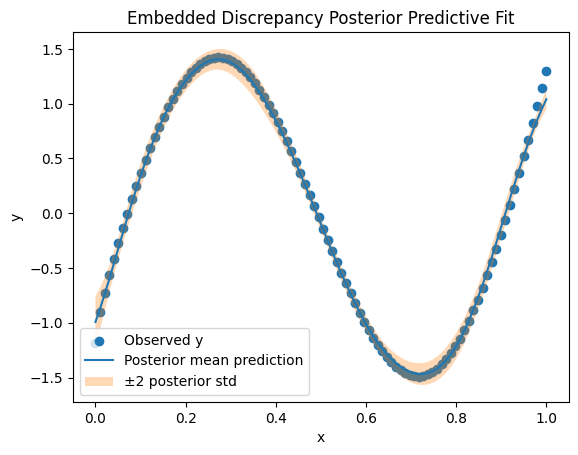

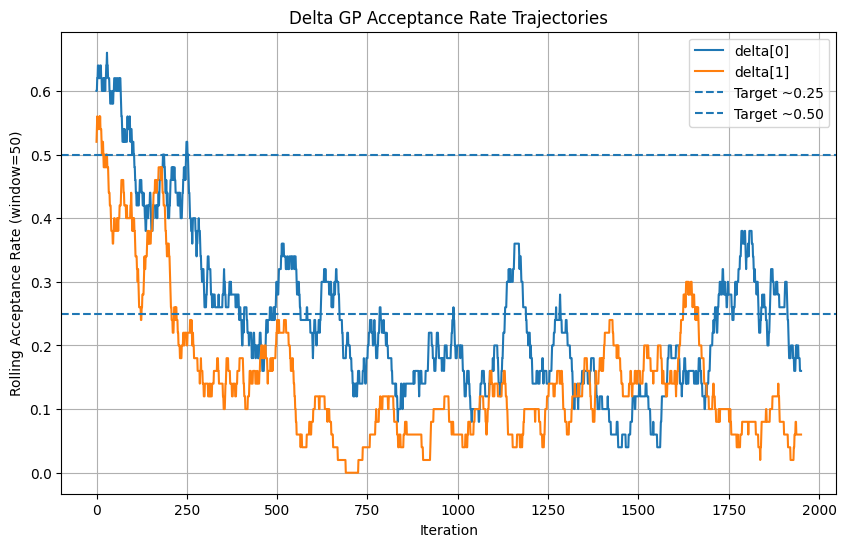

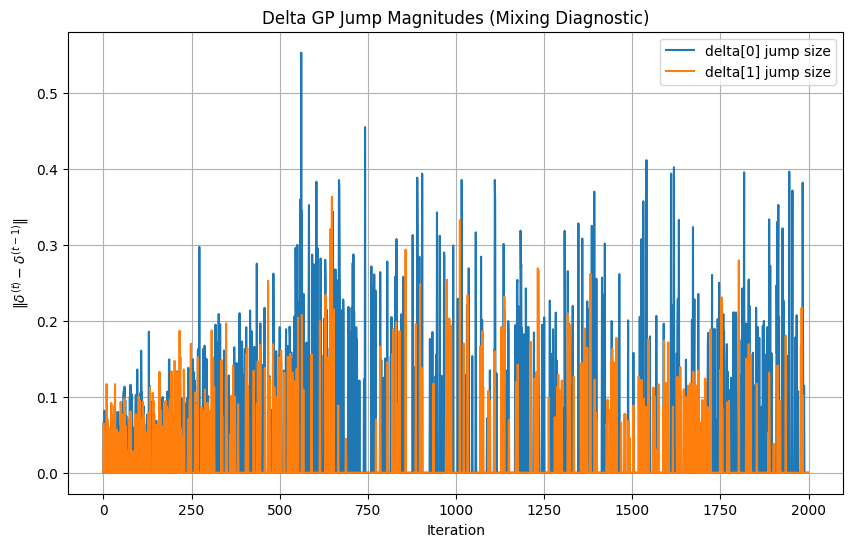

[I 2026-04-07 11:04:25,502] Trial 0 finished with value: 0.9183996293924144 and parameters: {'ell_delta': 0.10696849047658961, 'var_delta': 0.005124836353799588, 'ell_eta': 0.07884029346575643, 'var_eta': 0.0014235810029582603, 'sigma2': 1.901317330498351e-05}. Best is trial 0 with value: 0.9183996293924144.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.350, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.008649253173479057
 delta acceptance rates: [0.48 0.58]
 ell_delta: [0.88299175 0.66201755]
 var_delta: [0.00071886 0.00052713]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1033
[ADAPT] Updated mh_scale_delta fo

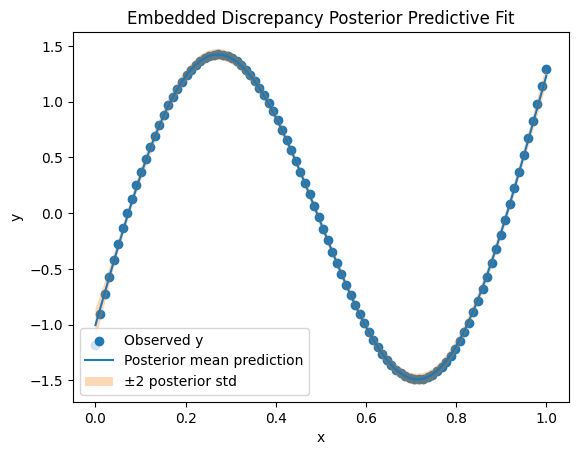

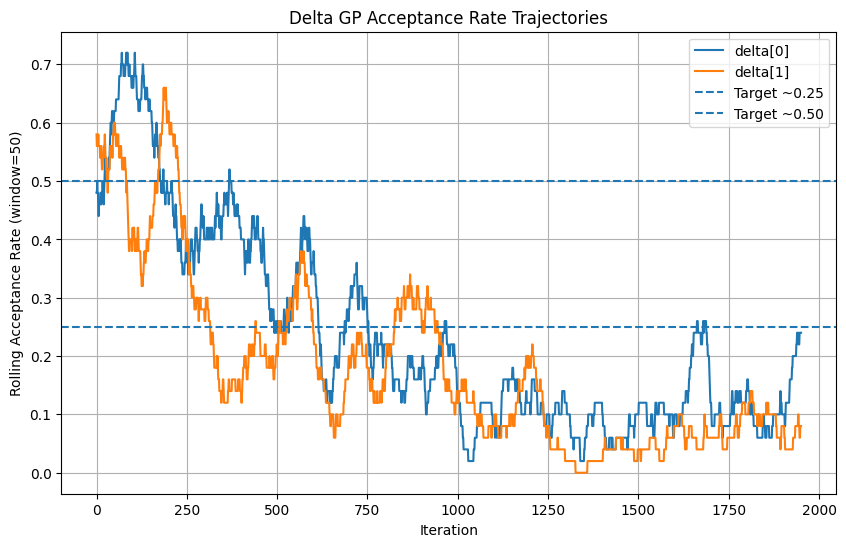

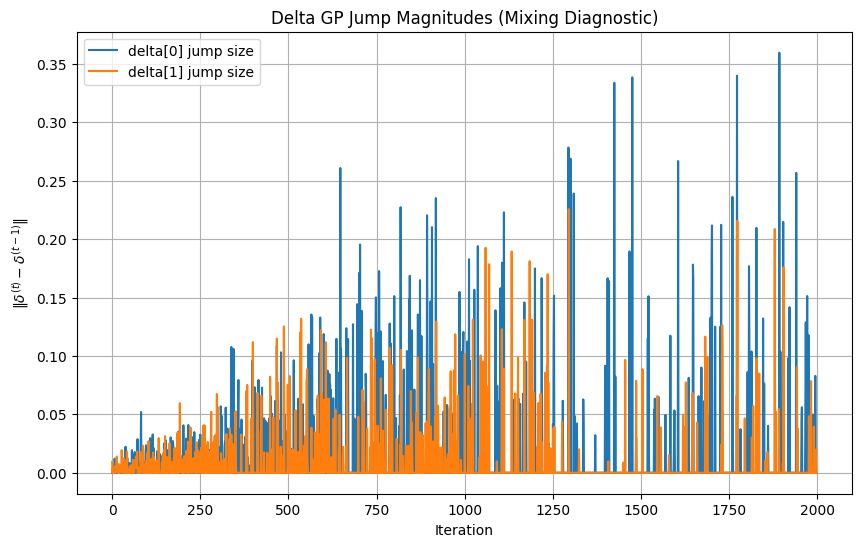

[I 2026-04-07 11:13:02,717] Trial 1 finished with value: 0.8930748434428198 and parameters: {'ell_delta': 0.46463192002270004, 'var_delta': 0.00017274555191816915, 'ell_eta': 0.22786477324340107, 'var_eta': 0.08031914319391406, 'sigma2': 0.0005537169167713895}. Best is trial 1 with value: 0.8930748434428198.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.800, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.1327888100258484
 delta acceptance rates: [0.66 0.64]
 ell_delta: [0.26179836 0.28612266]
 var_delta: [0.00048521 0.00030435]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.700, scale=0.1043
[ADAPT] Updated mh_scale_delta for 

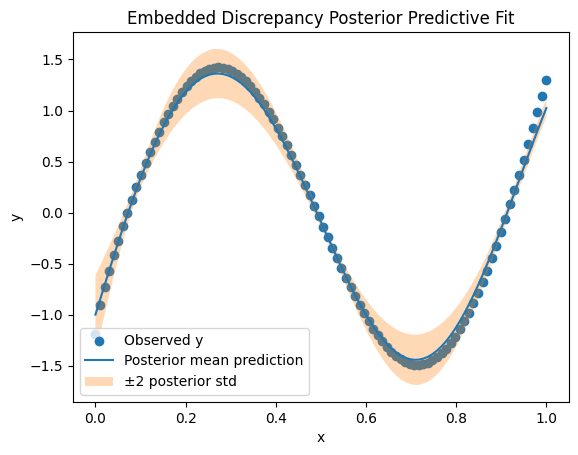

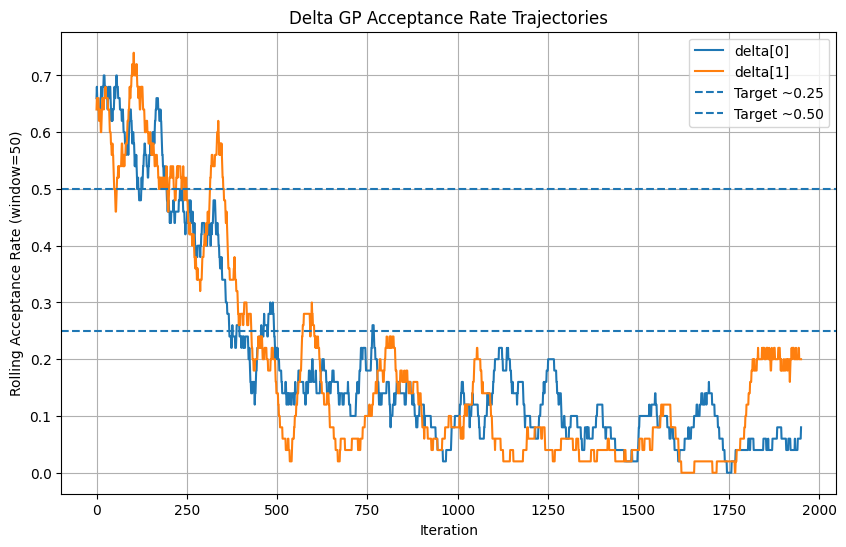

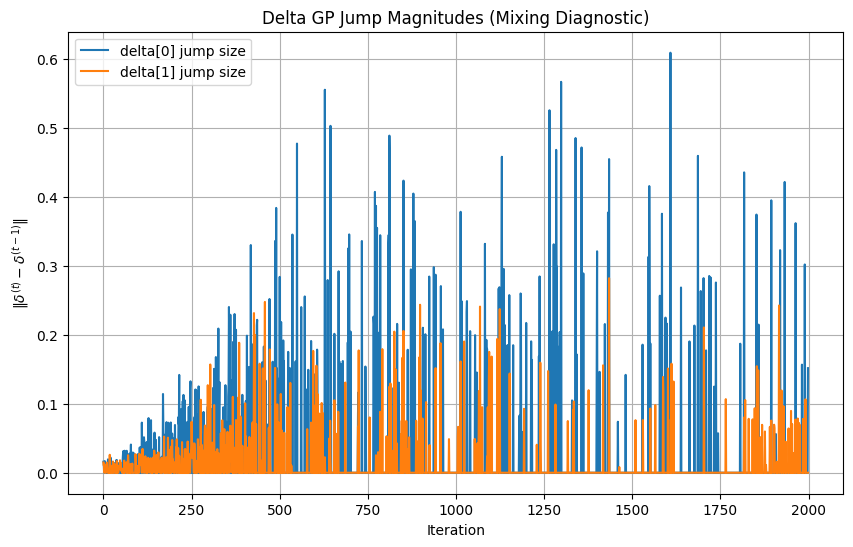

[I 2026-04-07 11:21:37,331] Trial 2 finished with value: 0.9389409285282598 and parameters: {'ell_delta': 0.15690060056403718, 'var_delta': 0.0003565988404803893, 'ell_eta': 0.2377737872996255, 'var_eta': 0.0006685818670897638, 'sigma2': 9.515443703726662e-05}. Best is trial 1 with value: 0.8930748434428198.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 17 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 16 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_v


Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.450, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 40, k=1: acc=0.350, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
Iter 50/2000
 sigma2 = 0.06037868524897767
 delta acceptance rates: [0.52 0.54]
 ell_delta: [0.13379057 0.11125526]
 var_delta: [0.0041307 0.0029962]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 60, k=1: acc=0.800, scale=0.1036
[ADAPT] Updated mh_scale_delta for t

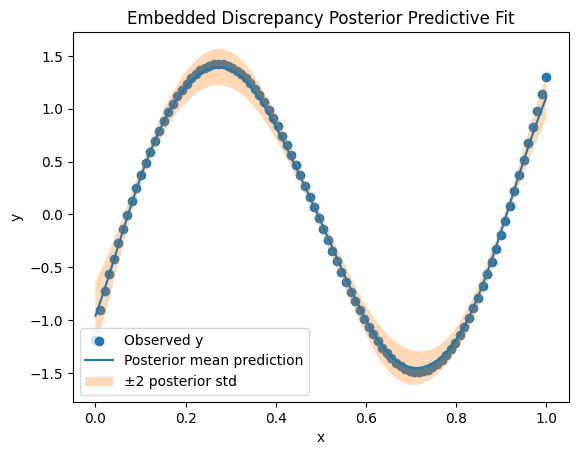

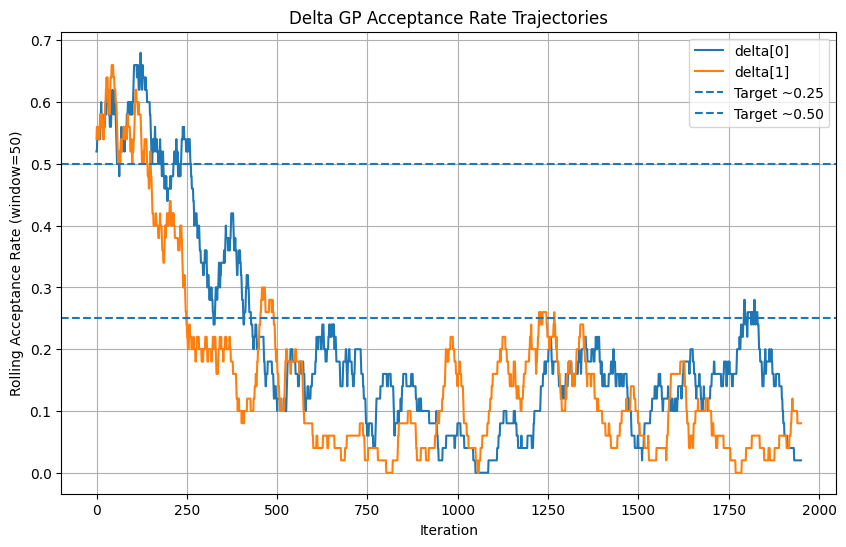

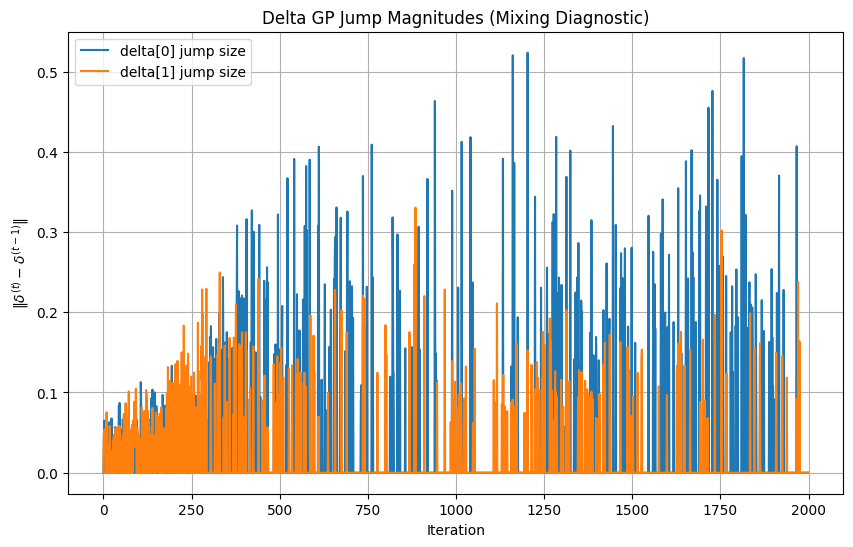

[I 2026-04-07 11:30:40,553] Trial 3 finished with value: 0.8721142524409915 and parameters: {'ell_delta': 0.08825892995719277, 'var_delta': 0.003253935985399266, 'ell_eta': 0.5381046174632917, 'var_eta': 0.012800954004663637, 'sigma2': 4.86389912334791e-05}. Best is trial 3 with value: 0.8721142524409915.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.400, scale=0.1003
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1003
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
Iter 50/2000
 sigma2 = 0.0669871994556158
 delta acceptance rates: [0.6  0.52]
 ell_delta: [0.32872567 0.40356654]
 var_delta: [0.02878337 0.0717824 ]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for 

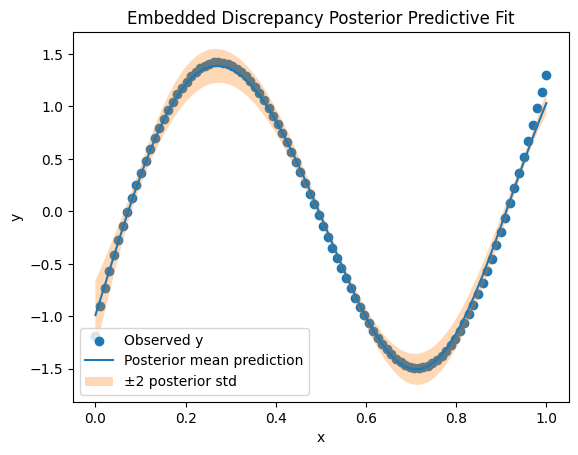

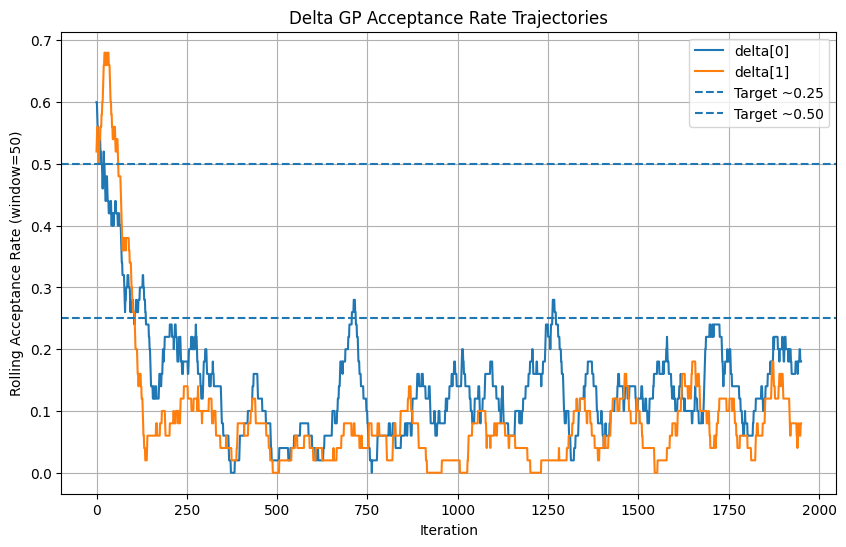

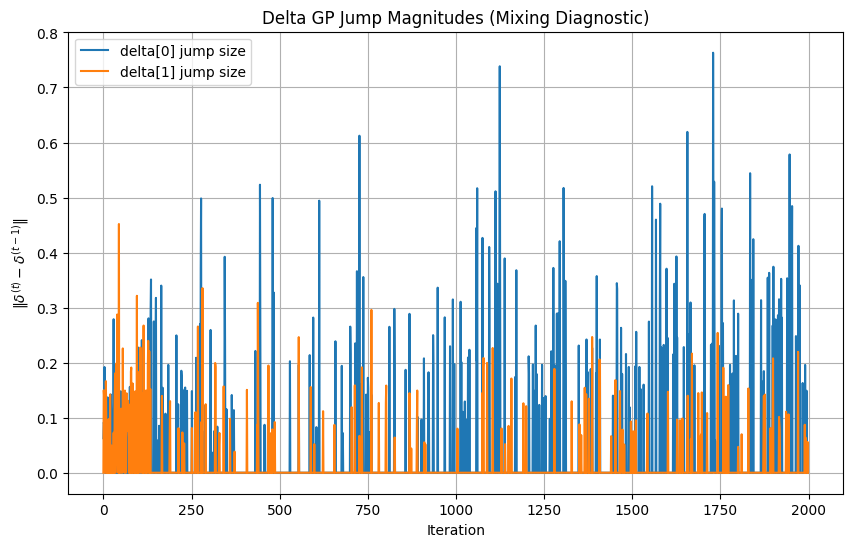

[I 2026-04-07 11:40:28,901] Trial 4 finished with value: 0.9652956311276093 and parameters: {'ell_delta': 0.30685863546152337, 'var_delta': 0.041108118687608, 'ell_eta': 1.5349495500033552, 'var_eta': 0.0014199594817205213, 'sigma2': 0.003103109167100202}. Best is trial 3 with value: 0.8721142524409915.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1015
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
Iter 50/2000
 sigma2 = 0.10943035282403946
 delta acceptance rates: [0.6  0.58]
 ell_delta: [0.07783361 0.08544274]
 var_delta: [0.00028457 0.0003561 ]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1038
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1038
[ADAPT] Iter 60, k=1: acc=0.500, scale=0.1028
[ADAPT] Updated mh_scale_delta for

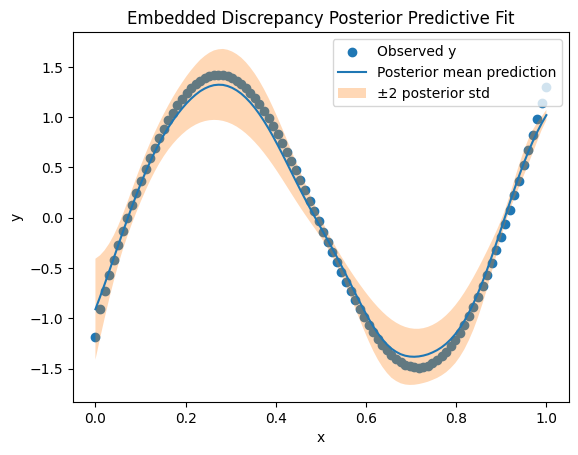

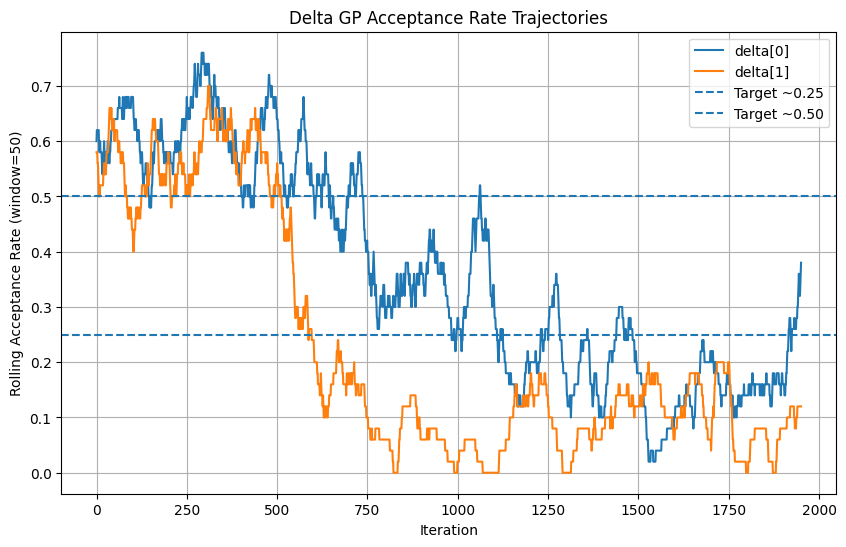

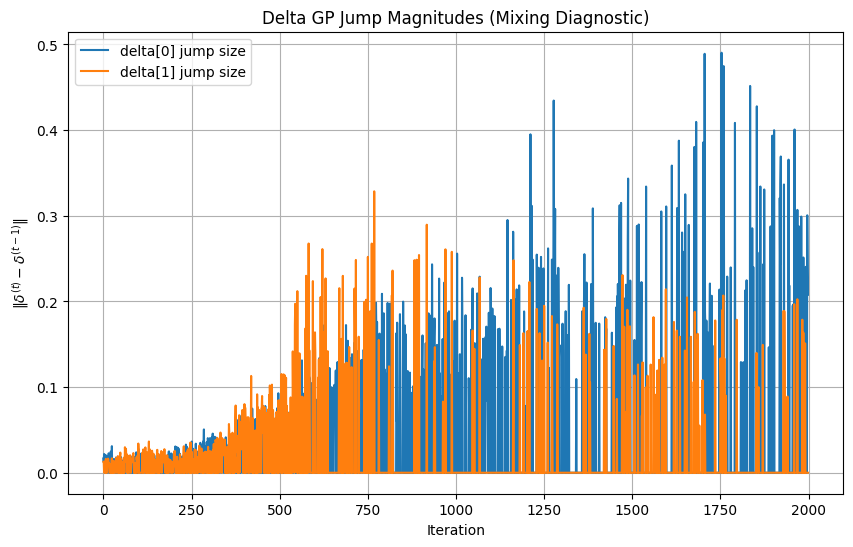

[I 2026-04-07 11:49:49,125] Trial 5 finished with value: 0.8443966153749871 and parameters: {'ell_delta': 0.056367612443446416, 'var_delta': 0.00032783185053343453, 'ell_eta': 1.0842025779096665, 'var_eta': 0.0005325771648207556, 'sigma2': 0.0023493245509439314}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.08970565171812307
 delta acceptance rates: [0.66 0.56]
 ell_delta: [0.37875687 0.36950292]
 var_delta: [0.00076936 0.00065665]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.600, scale=0.1049
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1049
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1036
[ADAPT] Updated mh_scale_delta for

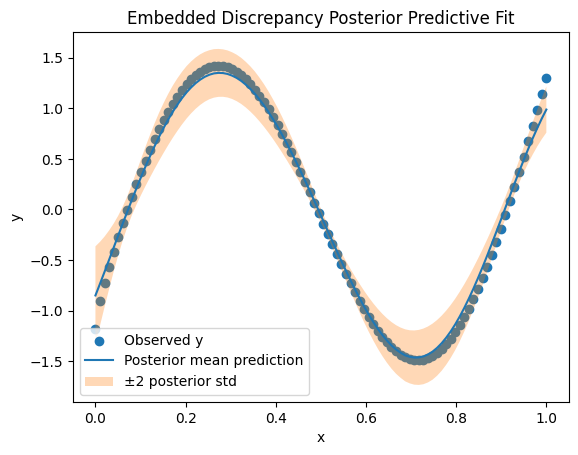

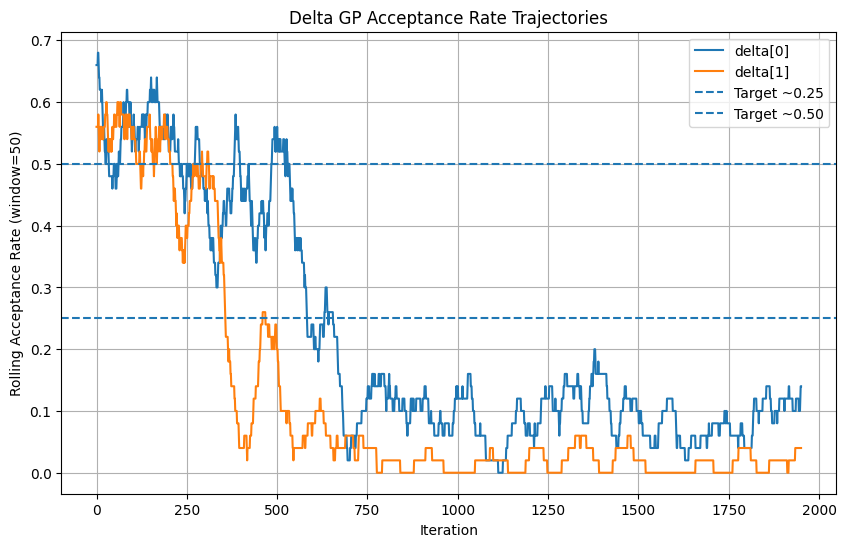

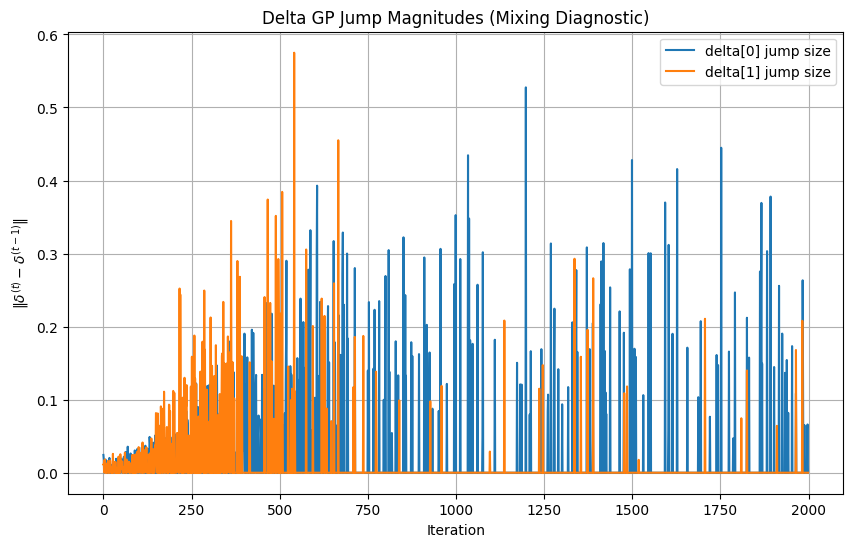

[I 2026-04-07 11:59:04,257] Trial 6 finished with value: 0.9304855358073657 and parameters: {'ell_delta': 0.22135895144790219, 'var_delta': 0.0005168290512769138, 'ell_eta': 0.6800423560168625, 'var_eta': 0.007718976552417808, 'sigma2': 5.66499049894864e-05}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.750, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1041
Iter 50/2000
 sigma2 = 0.0880110521353928
 delta acceptance rates: [0.68 0.7 ]
 ell_delta: [0.0938175  0.09869231]
 var_delta: [0.00078054 0.00128666]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.500, scale=0.1049
[ADAPT] Updated mh_scale_delta for 

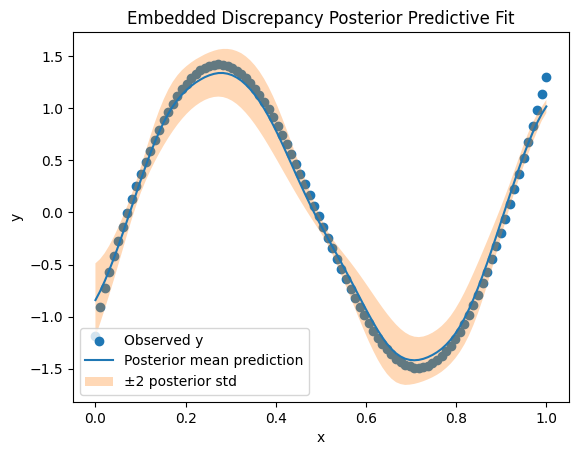

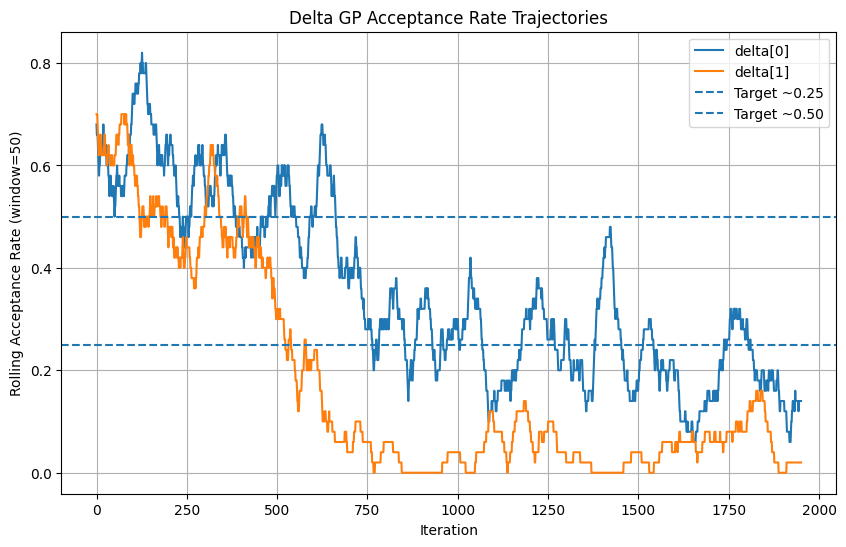

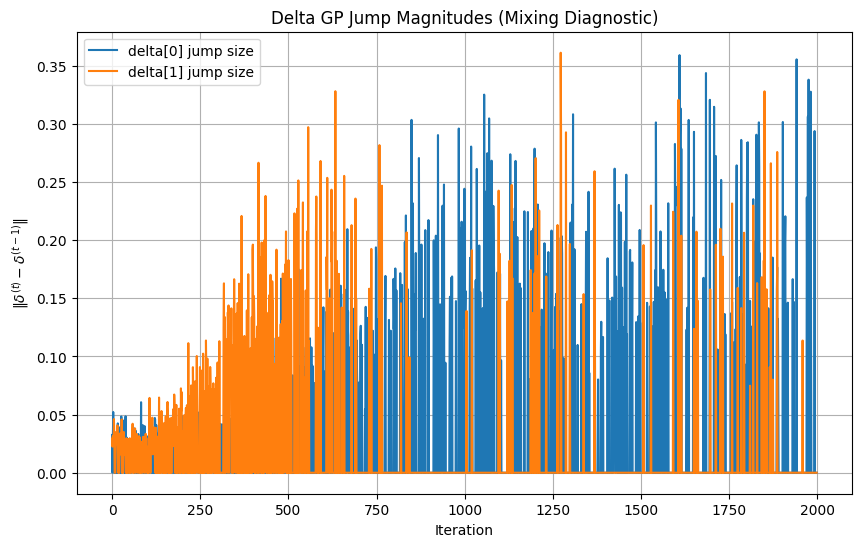

[I 2026-04-07 12:08:04,368] Trial 7 finished with value: 0.8503660420968219 and parameters: {'ell_delta': 0.07276971152515259, 'var_delta': 0.0013674380966706306, 'ell_eta': 1.5214521785540072, 'var_eta': 0.000560602383249629, 'sigma2': 0.004142795204458952}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 25 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.500, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.11422916431637578
 delta acceptance rates: [0.54 0.58]
 ell_delta: [0.54811367 0.43961941]
 var_delta: [0.00035684 0.00016711]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1038
[ADAPT] Updated mh_scale_delta for

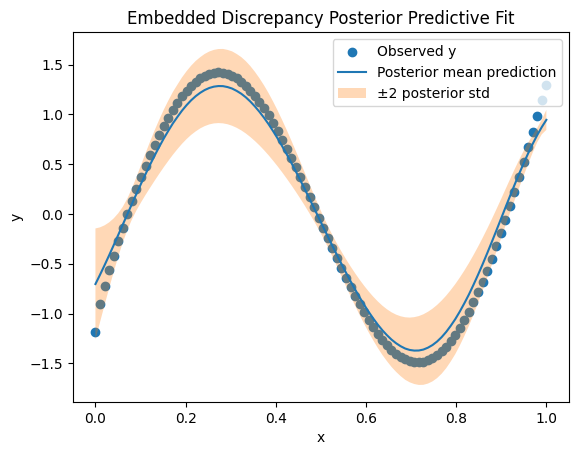

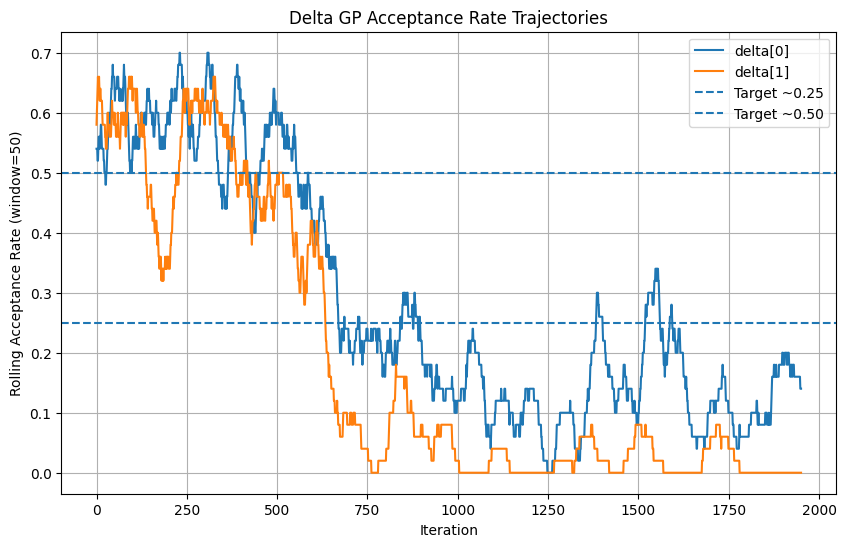

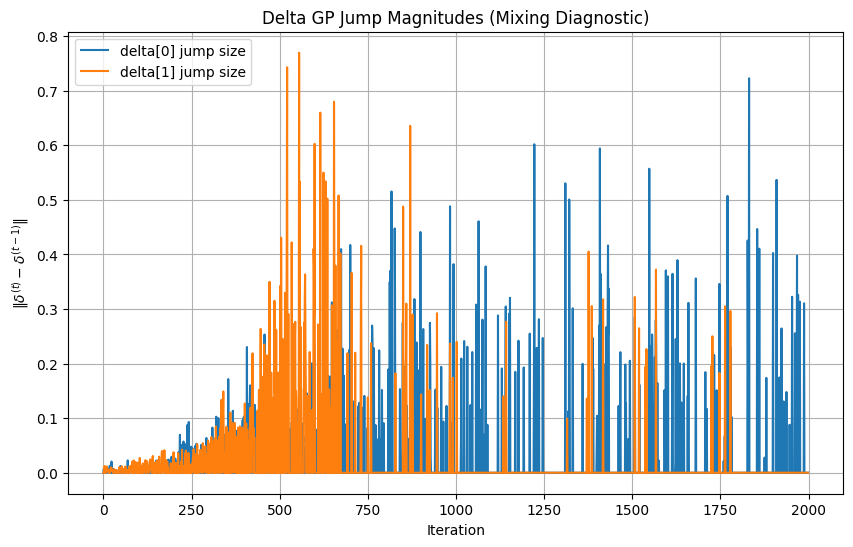

[I 2026-04-07 12:17:11,355] Trial 8 finished with value: 0.9262278064375886 and parameters: {'ell_delta': 0.27986512736241803, 'var_delta': 0.00010759893340124308, 'ell_eta': 3.5554398941587895, 'var_eta': 0.00048483050137787027, 'sigma2': 3.207797647320276e-05}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.400, scale=0.1003
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1003
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 40, k=1: acc=0.450, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
Iter 50/2000
 sigma2 = 0.05432691361100065
 delta acceptance rates: [0.54 0.46]
 ell_delta: [0.20022784 0.16896213]
 var_delta: [0.01021031 0.03052812]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 60, k=1: acc=0.300, scale=0.1013
[ADAPT] Updated mh_scale_delta for

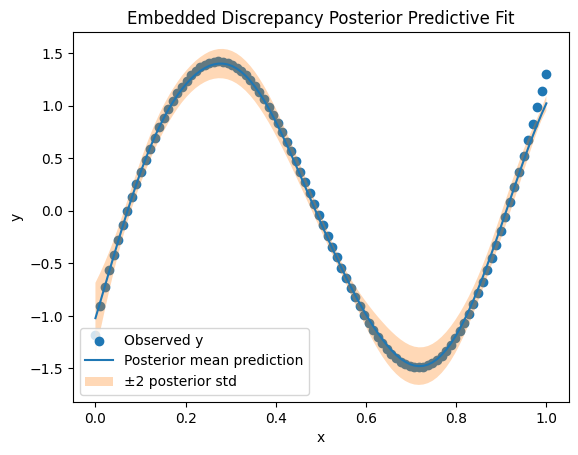

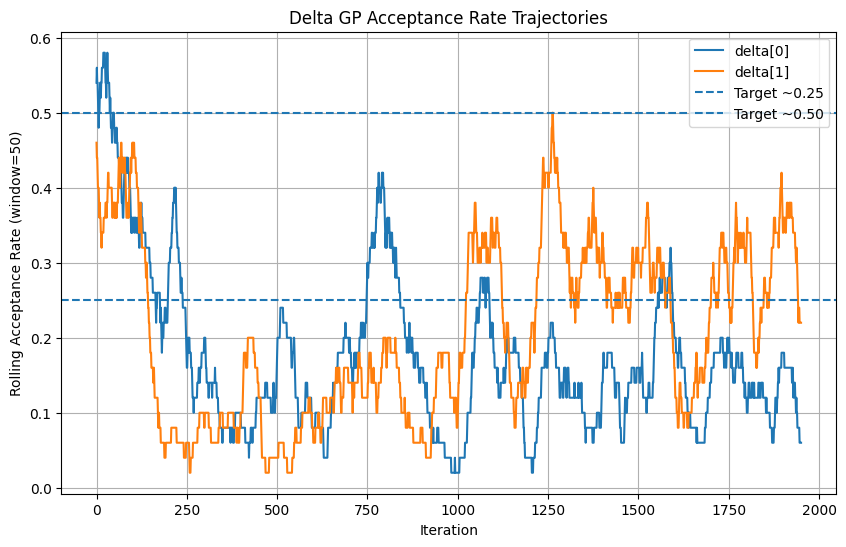

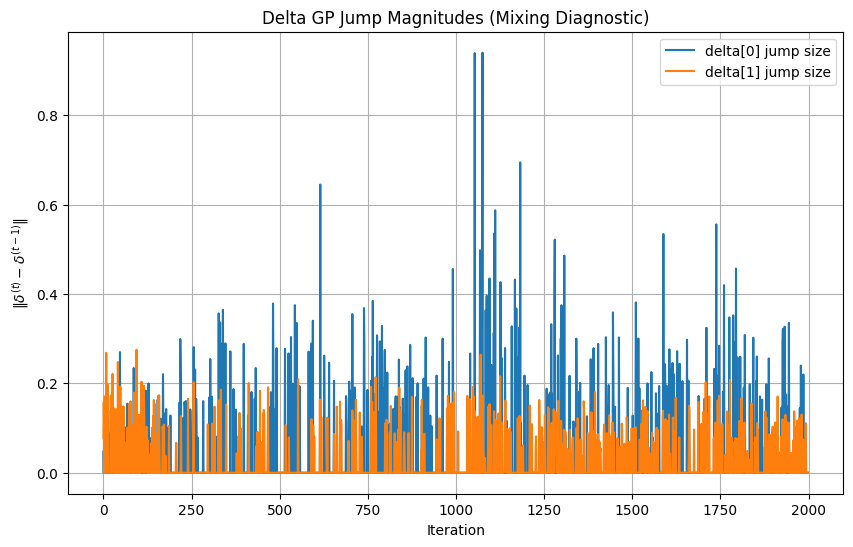

[I 2026-04-07 12:25:18,689] Trial 9 finished with value: 0.9505943304373895 and parameters: {'ell_delta': 0.13844401453228705, 'var_delta': 0.018019821385647856, 'ell_eta': 0.9664114505896835, 'var_eta': 0.00021973519283472143, 'sigma2': 7.161072481274465e-05}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1015
[ADAPT] Iter 20, k=1: acc=0.450, scale=0.1005
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1005
[ADAPT] Iter 40, k=0: acc=0.800, scale=0.1038
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1038
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
Iter 50/2000
 sigma2 = 0.12042022808881107
 delta acceptance rates: [0.76 0.5 ]
 ell_delta: [0.79453763 1.84804727]
 var_delta: [0.00124052 0.00432676]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.750, scale=0.1059
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1059
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1028
[ADAPT] Updated mh_scale_delta for

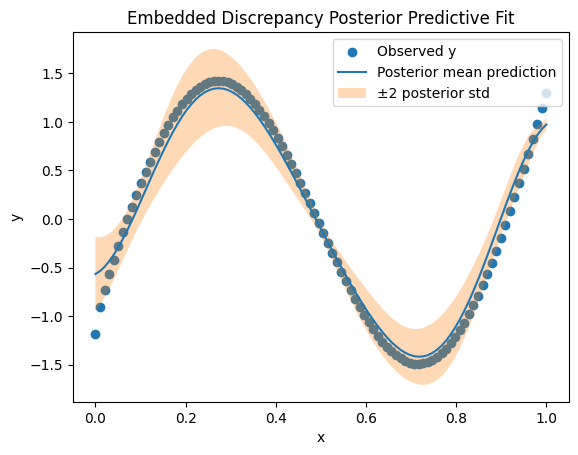

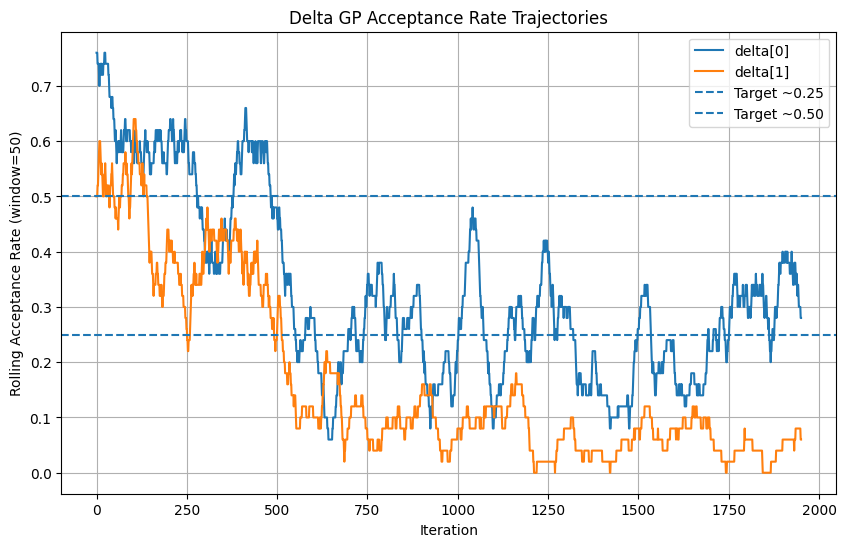

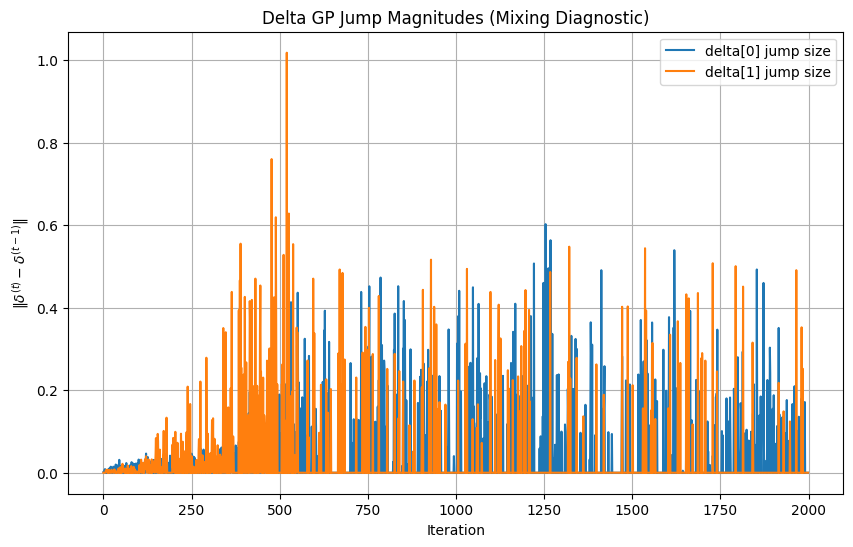

[I 2026-04-07 12:31:57,742] Trial 10 finished with value: 0.8720924308895007 and parameters: {'ell_delta': 1.6306843544649248, 'var_delta': 0.0010976852643057346, 'ell_eta': 2.909674824849389, 'var_eta': 0.00012077837212560765, 'sigma2': 0.0008350771919750581}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.550, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.11159984030639222
 delta acceptance rates: [0.62 0.56]
 ell_delta: [0.08230622 0.07174751]
 var_delta: [0.00099542 0.00122408]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 60, k=1: acc=0.350, scale=0.1028
[ADAPT] Updated mh_scale_delta for

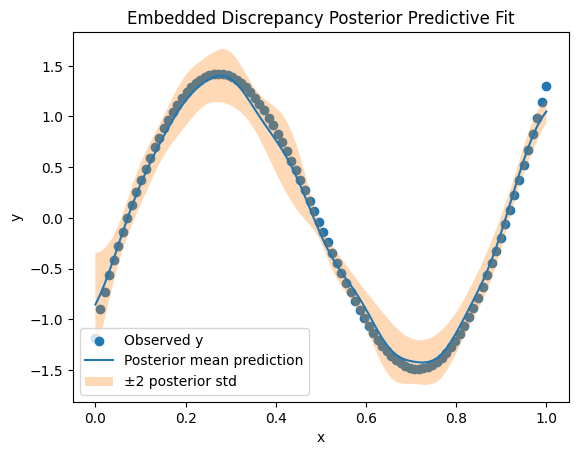

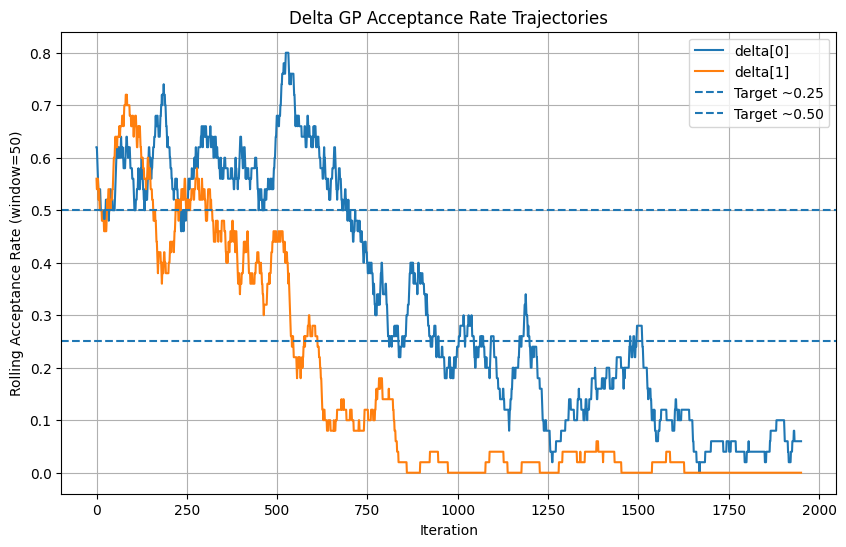

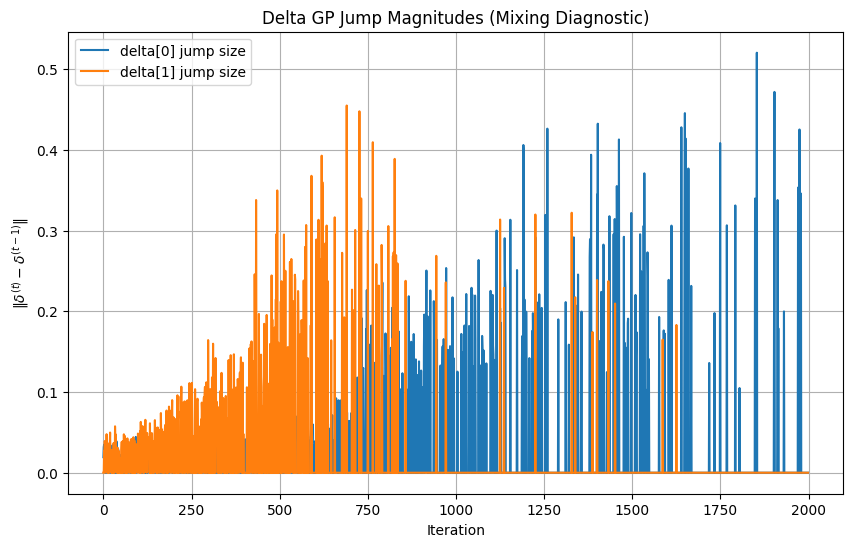

[I 2026-04-07 12:40:41,926] Trial 11 finished with value: 0.859636475547501 and parameters: {'ell_delta': 0.05670969981649453, 'var_delta': 0.0011257614210491988, 'ell_eta': 1.521250085435474, 'var_eta': 0.0035758835217503107, 'sigma2': 0.00862854383343661}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.450, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
Iter 50/2000
 sigma2 = 0.08800148455865375
 delta acceptance rates: [0.7  0.56]
 ell_delta: [0.07757852 0.0810549 ]
 var_delta: [0.00136292 0.00125424]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.750, scale=0.1049
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1049
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for

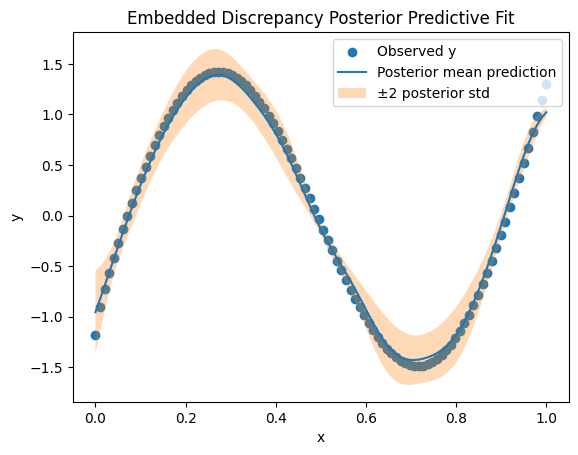

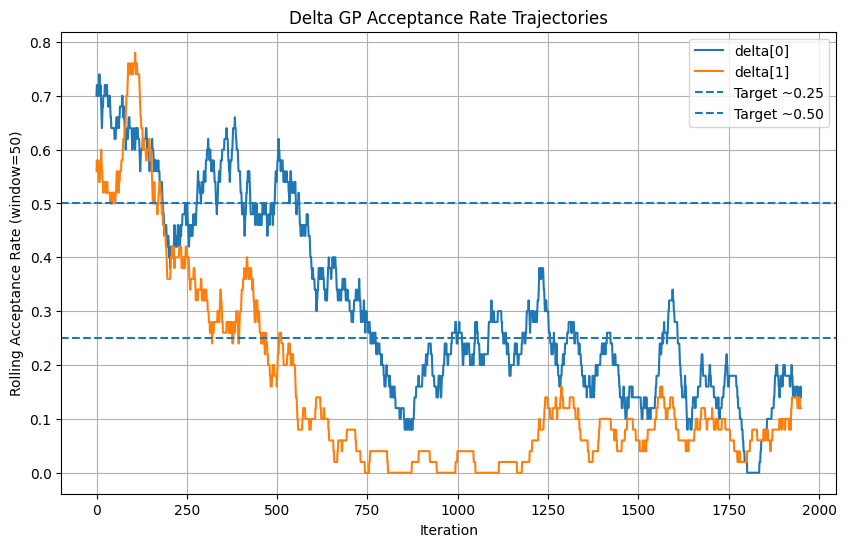

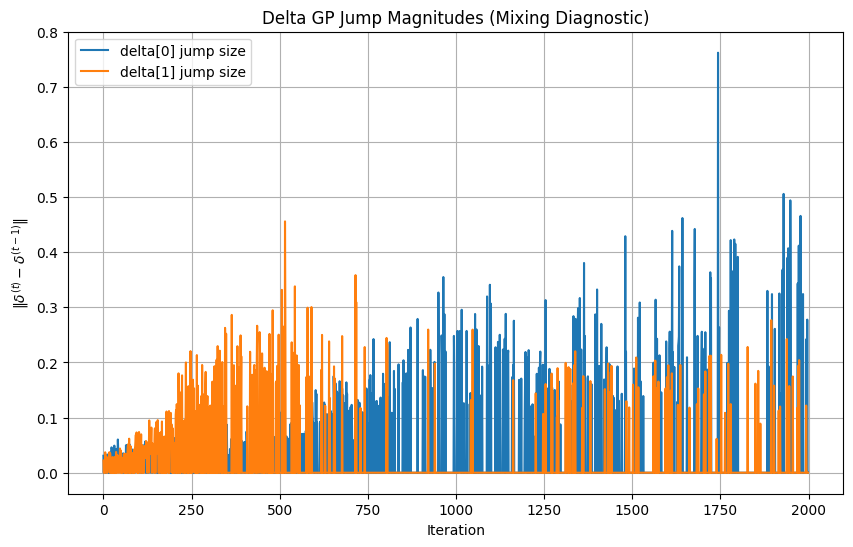

[I 2026-04-07 12:49:25,671] Trial 12 finished with value: 0.8618479873399751 and parameters: {'ell_delta': 0.052596191227929225, 'var_delta': 0.0013405714793124292, 'ell_eta': 4.976633547595435, 'var_eta': 0.0003756091660039571, 'sigma2': 0.002097726597177875}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.450, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1015
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
Iter 50/2000
 sigma2 = 0.0962440096134407
 delta acceptance rates: [0.52 0.54]
 ell_delta: [0.79635651 0.88136634]
 var_delta: [0.00777328 0.01253534]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1030
[ADAPT] Updated mh_scale_delta for 

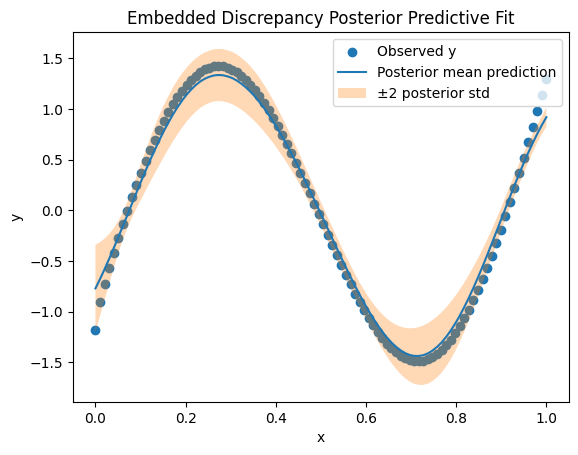

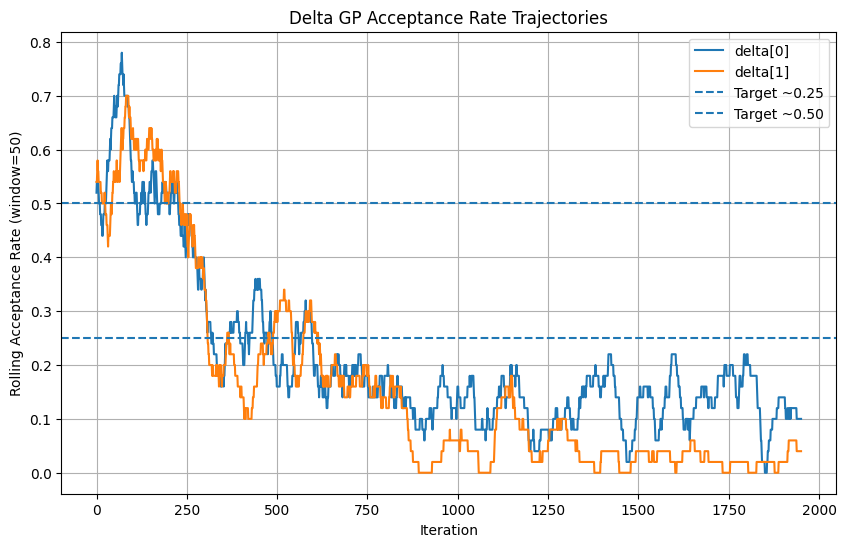

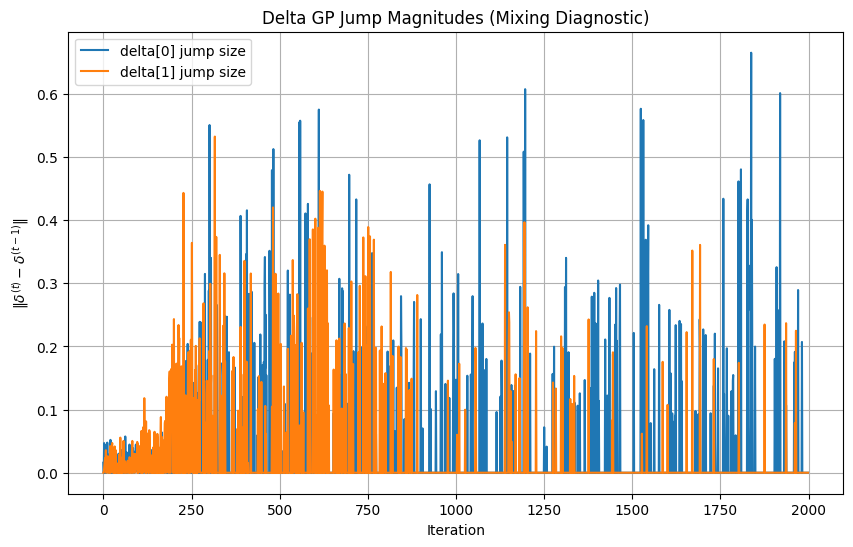

[I 2026-04-07 12:59:06,635] Trial 13 finished with value: 0.9759282121962098 and parameters: {'ell_delta': 0.5719526293802097, 'var_delta': 0.0062898012574247085, 'ell_eta': 1.5929524448784065, 'var_eta': 0.0012848629945297902, 'sigma2': 0.00809358961886789}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1008
[ADAPT] Iter 40, k=0: acc=0.750, scale=0.1038
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1038
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.10242031069365508
 delta acceptance rates: [0.72 0.66]
 ell_delta: [0.1141883  0.10513822]
 var_delta: [0.0004464  0.00028305]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1054
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1054
[ADAPT] Iter 60, k=1: acc=0.750, scale=0.1049
[ADAPT] Updated mh_scale_delta for

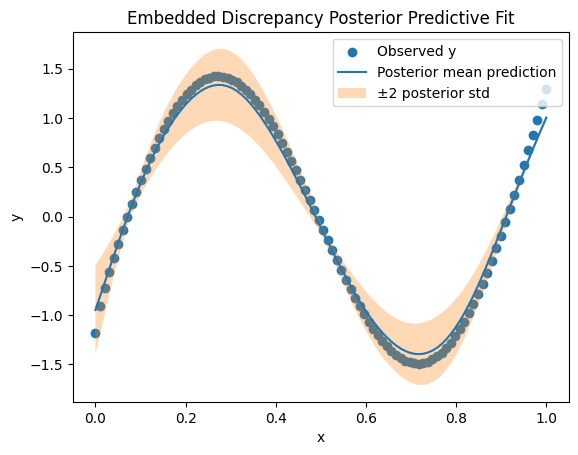

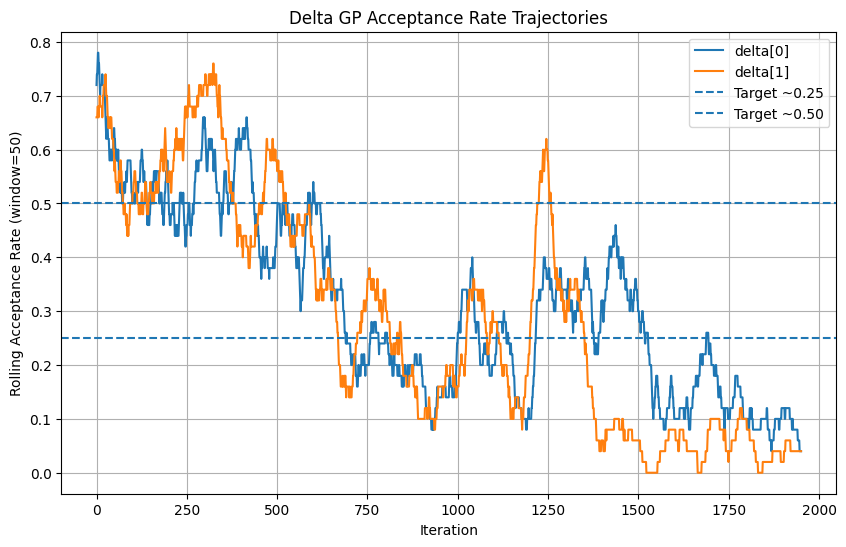

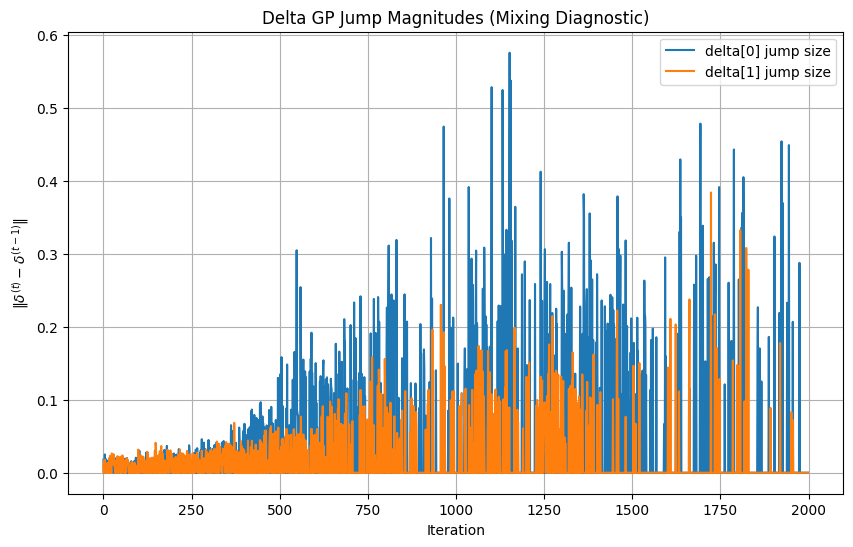

[I 2026-04-07 13:07:52,048] Trial 14 finished with value: 0.91716297970699 and parameters: {'ell_delta': 0.07913096645684414, 'var_delta': 0.0003661197280579517, 'ell_eta': 0.2668003781778634, 'var_eta': 0.00010438669899053547, 'sigma2': 0.0020643925241108133}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.450, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 40, k=1: acc=0.450, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.14651771979286804
 delta acceptance rates: [0.52 0.54]
 ell_delta: [1.78364912 1.52647454]
 var_delta: [0.00433025 0.00148538]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 60, k=1: acc=0.350, scale=0.1025
[ADAPT] Updated mh_scale_delta for

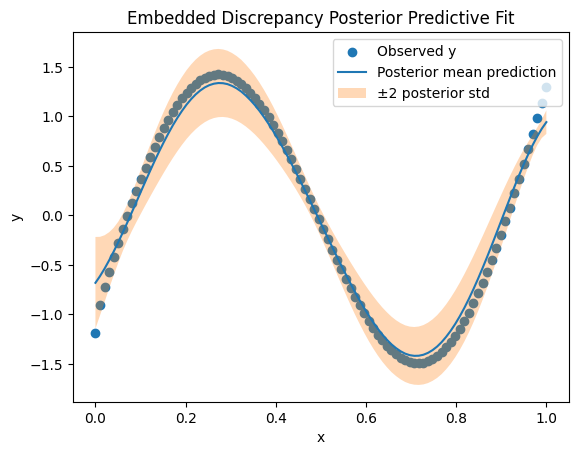

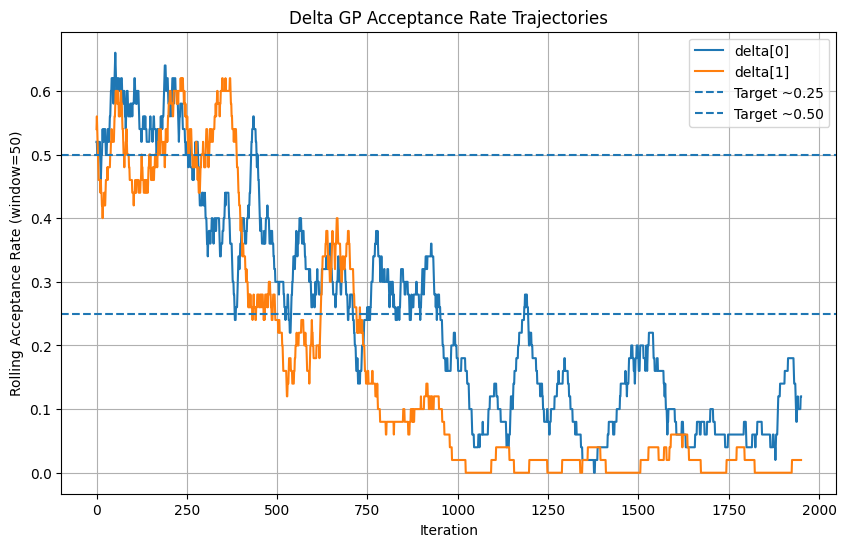

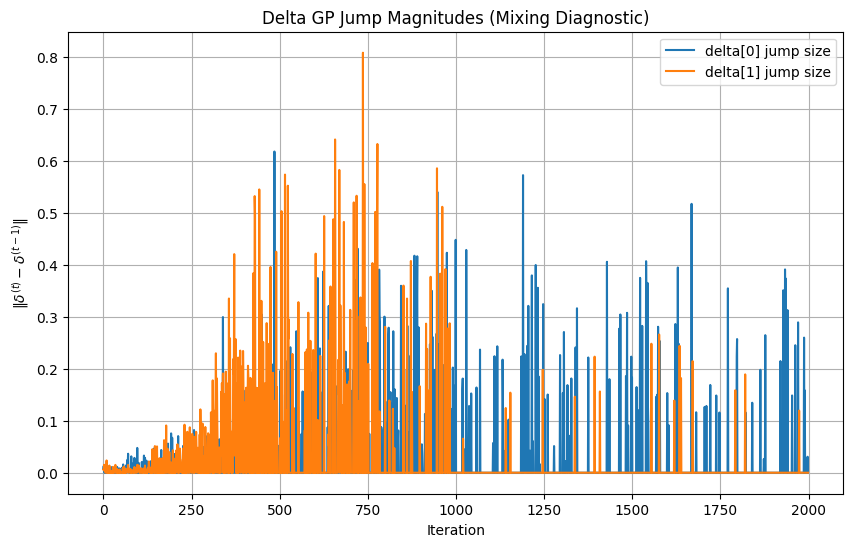

[I 2026-04-07 13:16:41,044] Trial 15 finished with value: 0.911719218628432 and parameters: {'ell_delta': 1.1656407185140973, 'var_delta': 0.0016074759950745917, 'ell_eta': 2.1053444274702366, 'var_eta': 0.003791341234667997, 'sigma2': 0.0002055125830182523}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 22 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.0463579922110532
 delta acceptance rates: [0.66 0.58]
 ell_delta: [0.08309019 0.0953286 ]
 var_delta: [0.00684291 0.00660567]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.700, scale=0.1051
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1051
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1041
[ADAPT] Updated mh_scale_delta for 

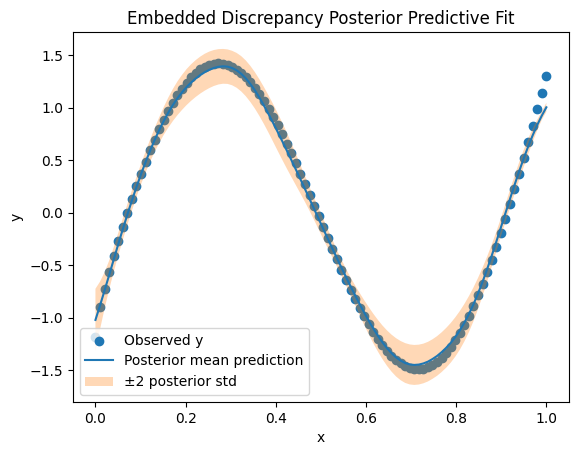

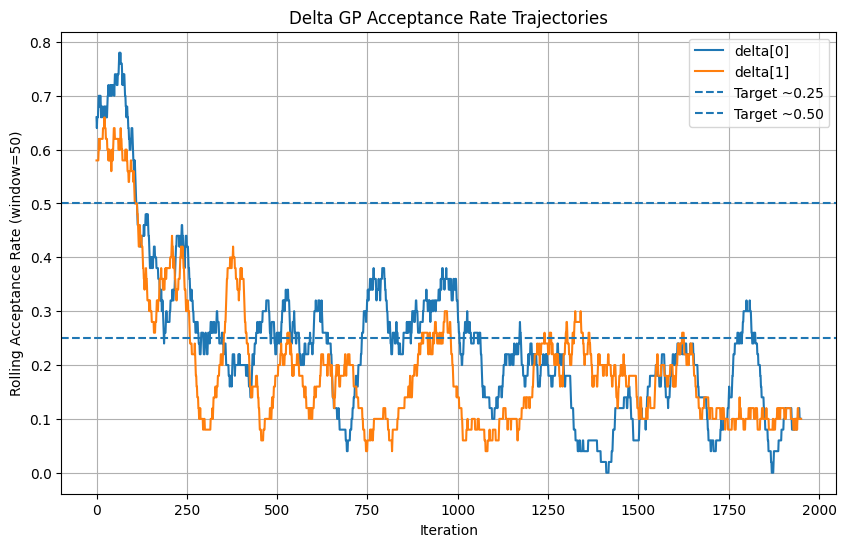

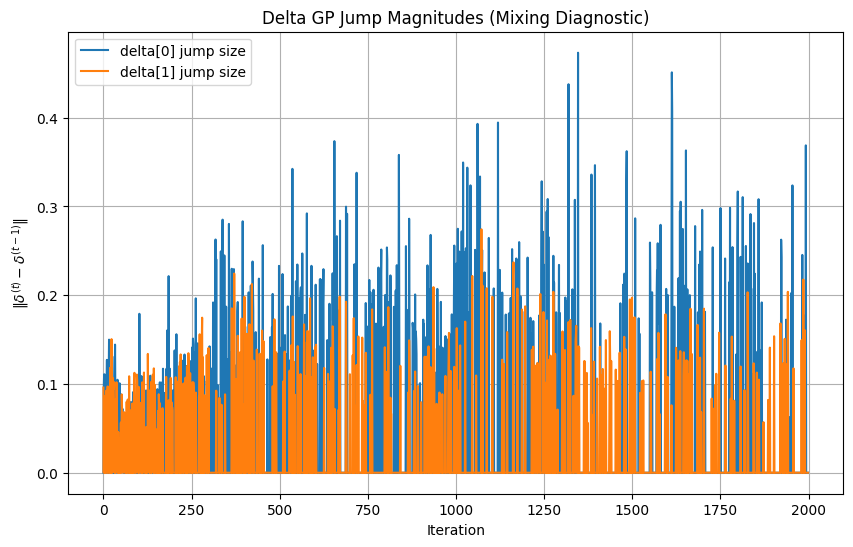

[I 2026-04-07 13:25:40,546] Trial 16 finished with value: 0.9019352541037462 and parameters: {'ell_delta': 0.07043478376456279, 'var_delta': 0.011235911661173908, 'ell_eta': 0.9209801936644718, 'var_eta': 0.0002917539319592371, 'sigma2': 0.003730727217479955}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1038
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1038
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.09645241873249867
 delta acceptance rates: [0.74 0.62]
 ell_delta: [0.18088916 0.21129128]
 var_delta: [0.00057563 0.00073725]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.750, scale=0.1059
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1059
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1043
[ADAPT] Updated mh_scale_delta for

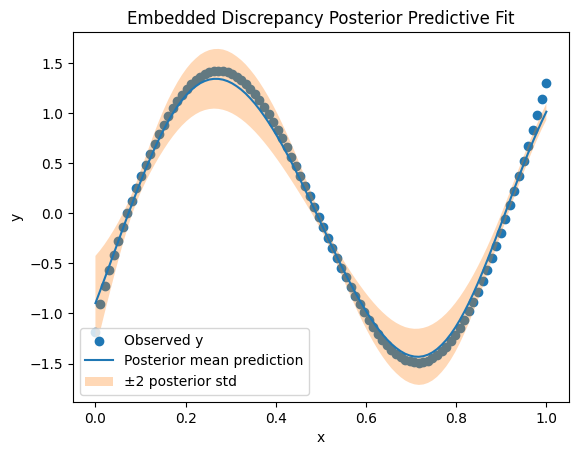

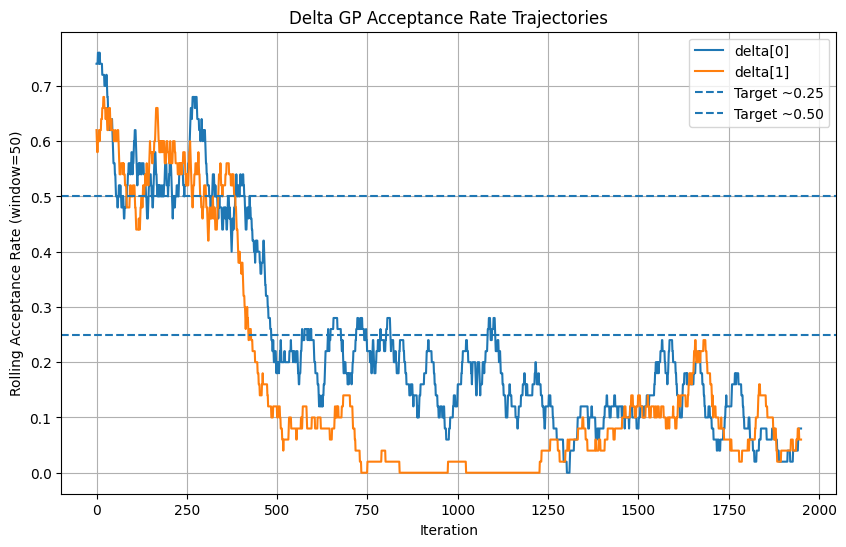

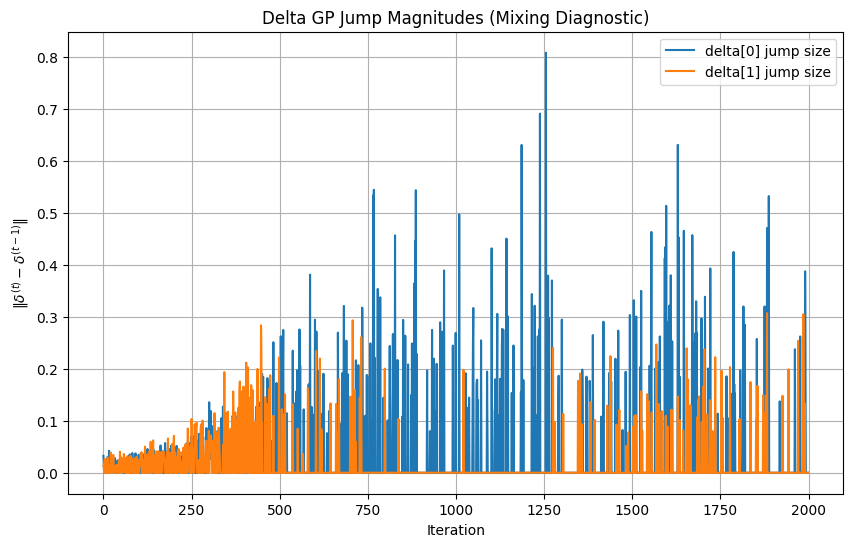

[I 2026-04-07 13:34:27,313] Trial 17 finished with value: 0.8902890161335414 and parameters: {'ell_delta': 0.1479796982706302, 'var_delta': 0.0006023097176082979, 'ell_eta': 0.37494207187920225, 'var_eta': 0.0006920434613423259, 'sigma2': 0.0007518763937457338}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.100, scale=0.0988
[ADAPT] Updated mh_scale_delta for theta_0 = 0.0988
[ADAPT] Iter 20, k=1: acc=0.300, scale=0.0998
[ADAPT] Updated mh_scale_delta for theta_1 = 0.0998
[ADAPT] Iter 40, k=0: acc=0.250, scale=0.0983
[ADAPT] Updated mh_scale_delta for theta_0 = 0.0983
[ADAPT] Iter 40, k=1: acc=0.250, scale=0.0993
[ADAPT] Updated mh_scale_delta for theta_1 = 0.0993
Iter 50/2000
 sigma2 = 0.0124480077960234
 delta acceptance rates: [0.22 0.24]
 ell_delta: [1.18056039 0.95464554]
 var_delta: [0.08421988 0.09915737]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.350, scale=0.0983
[ADAPT] Updated mh_scale_delta for theta_0 = 0.0983
[ADAPT] Iter 60, k=1: acc=0.200, scale=0.0985
[ADAPT] Updated mh_scale_delta for 

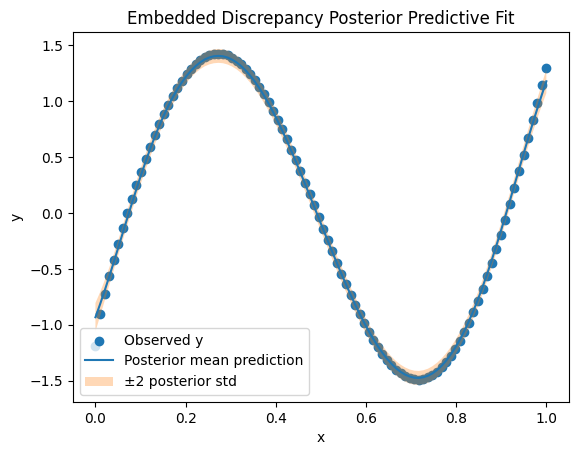

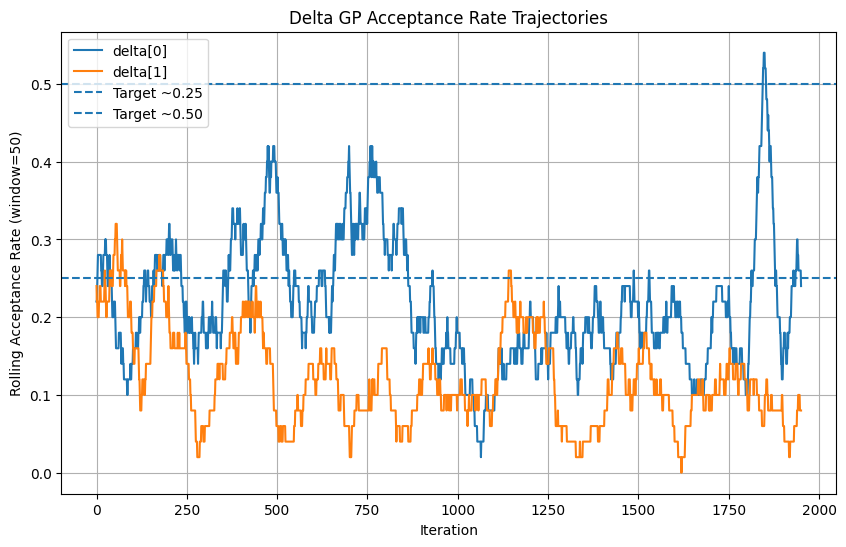

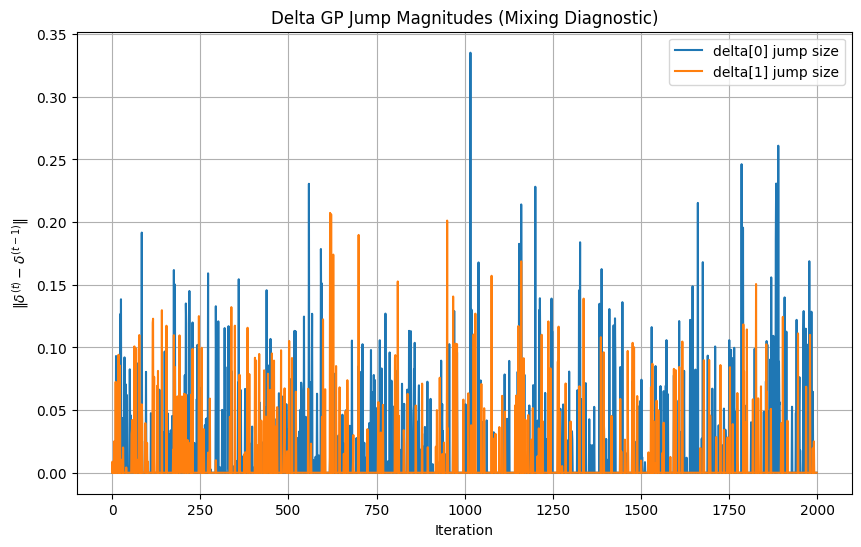

[I 2026-04-07 13:43:46,803] Trial 18 finished with value: 0.8594083350878242 and parameters: {'ell_delta': 0.6443765562394451, 'var_delta': 0.08503517999074701, 'ell_eta': 0.09599991876666486, 'var_eta': 0.014887452498294157, 'sigma2': 0.0002625584804014104}. Best is trial 5 with value: 0.8443966153749871.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 25 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.08810816963948057
 delta acceptance rates: [0.64 0.68]
 ell_delta: [0.16381031 0.13766829]
 var_delta: [0.0004651  0.00018653]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1046
[ADAPT] Updated mh_scale_delta for

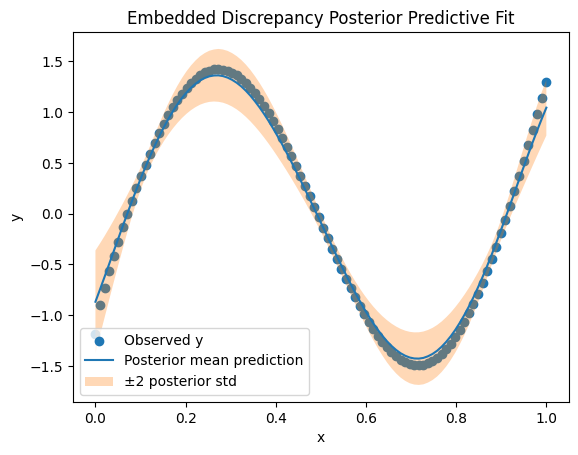

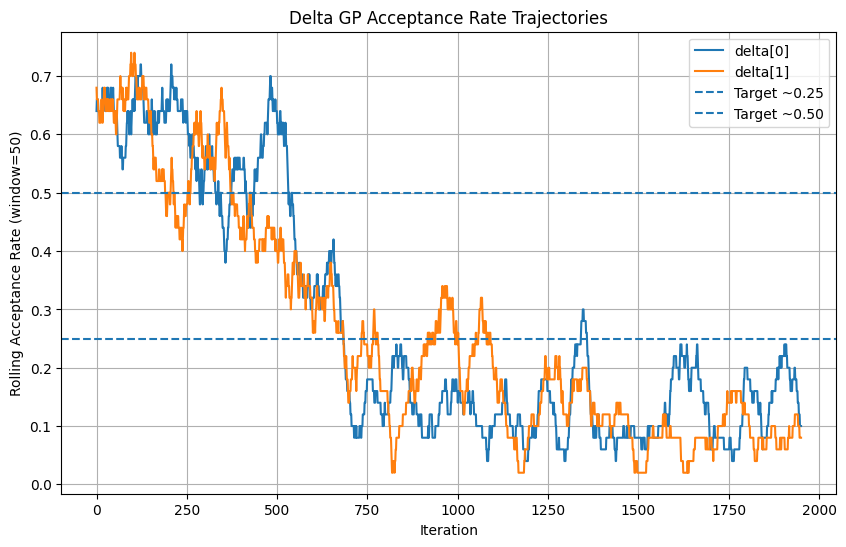

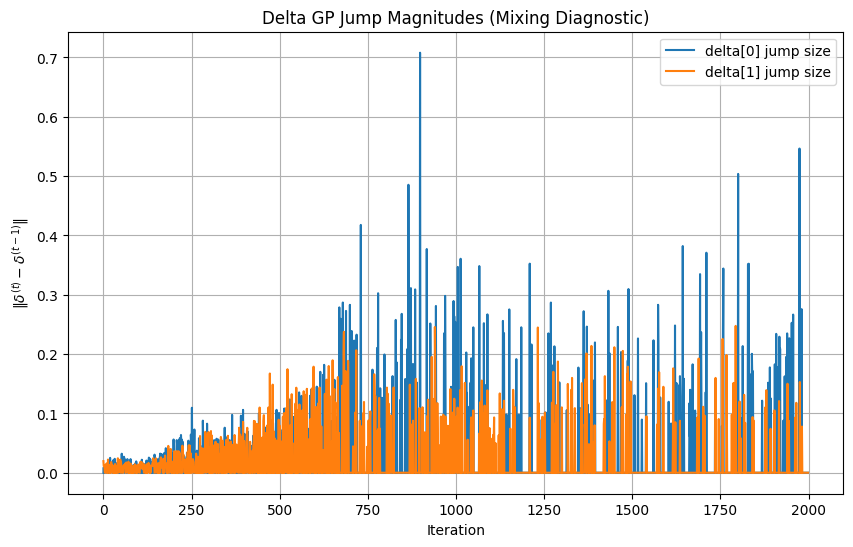

[I 2026-04-07 13:53:48,675] Trial 19 finished with value: 0.8218737363144591 and parameters: {'ell_delta': 0.11380327577193566, 'var_delta': 0.00022088290255777785, 'ell_eta': 0.9209062631028945, 'var_eta': 0.05171385230931958, 'sigma2': 0.0014541987419385627}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.550, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.450, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1023
Iter 50/2000
 sigma2 = 0.010219713477039967
 delta acceptance rates: [0.64 0.58]
 ell_delta: [0.15812716 0.14711379]
 var_delta: [0.00022277 0.00016107]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1038
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1038
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1033
[ADAPT] Updated mh_scale_delta fo

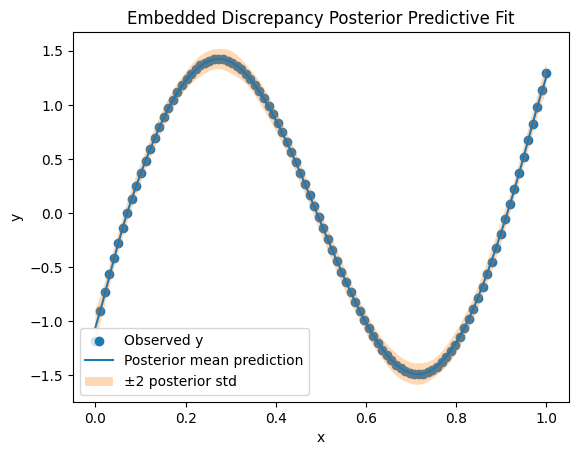

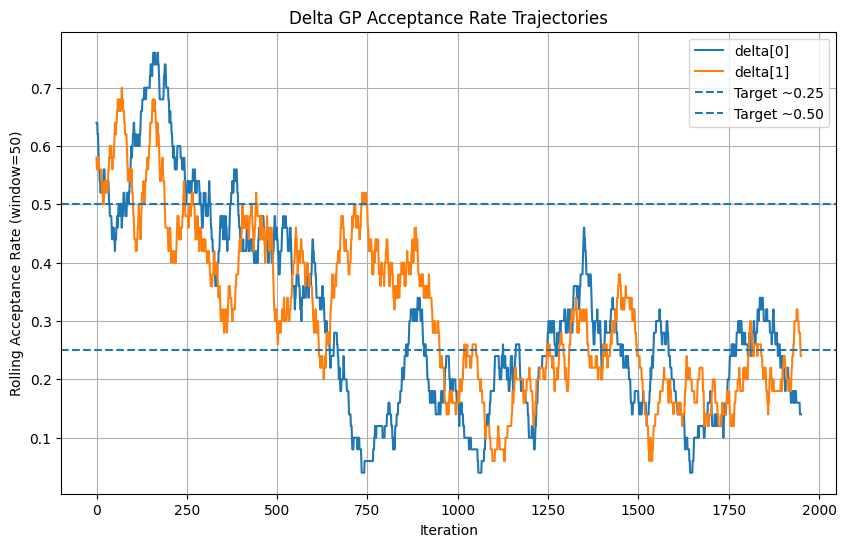

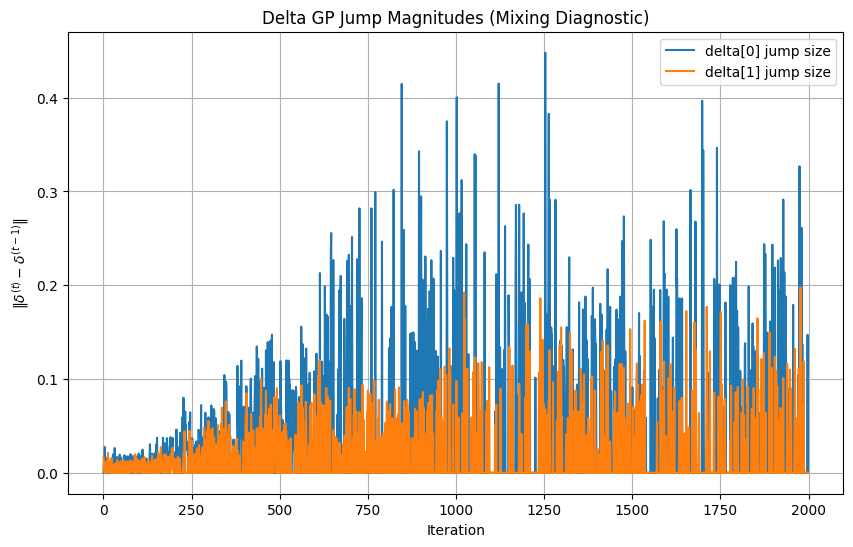

[I 2026-04-07 14:03:51,943] Trial 20 finished with value: 0.8396151870654704 and parameters: {'ell_delta': 0.10851314689214515, 'var_delta': 0.00017827868980185057, 'ell_eta': 0.050720488365984584, 'var_eta': 0.07185900738438367, 'sigma2': 0.0013962253986084603}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1015
[ADAPT] Iter 20, k=1: acc=0.450, scale=0.1005
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1005
[ADAPT] Iter 40, k=0: acc=0.750, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 40, k=1: acc=0.800, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.010457248071038252
 delta acceptance rates: [0.66 0.62]
 ell_delta: [0.19853398 0.17807714]
 var_delta: [0.00022329 0.0002438 ]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1051
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1051
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1041
[ADAPT] Updated mh_scale_delta fo

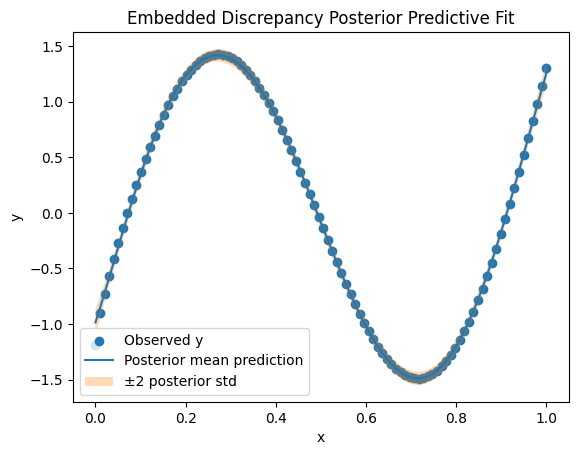

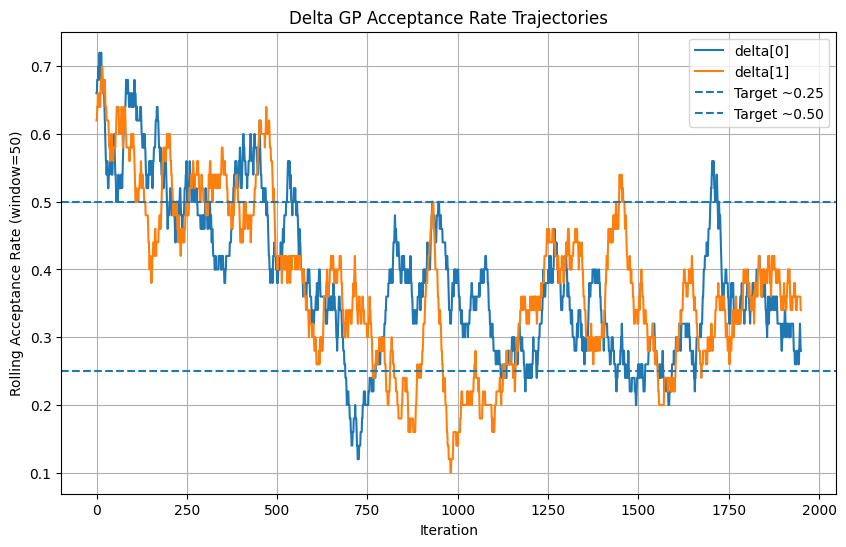

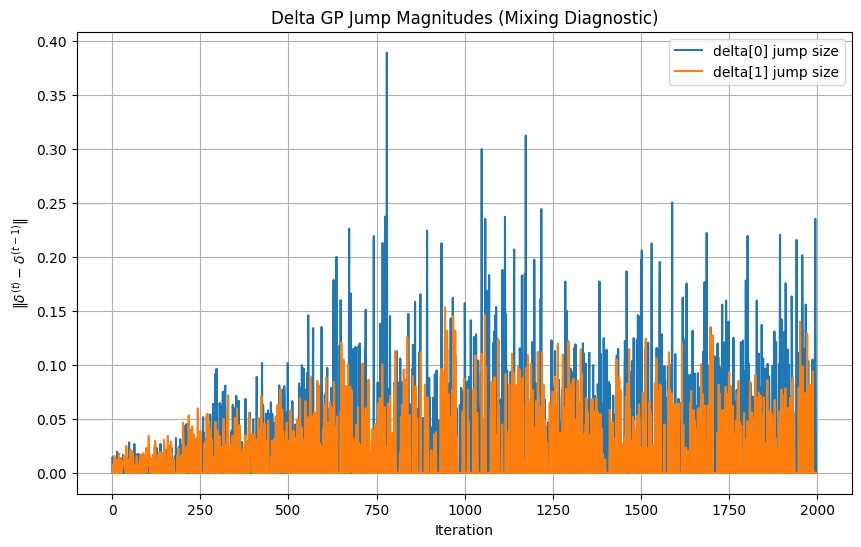

[I 2026-04-07 14:13:16,764] Trial 21 finished with value: 0.8246287569722621 and parameters: {'ell_delta': 0.12422752367999401, 'var_delta': 0.0001843733168398529, 'ell_eta': 0.1537780378427758, 'var_eta': 0.09244938039569862, 'sigma2': 0.00134340442783336}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.011009999265564958
 delta acceptance rates: [0.54 0.62]
 ell_delta: [0.27444677 0.27892419]
 var_delta: [0.00027873 0.00018084]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.400, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1046
[ADAPT] Updated mh_scale_delta fo

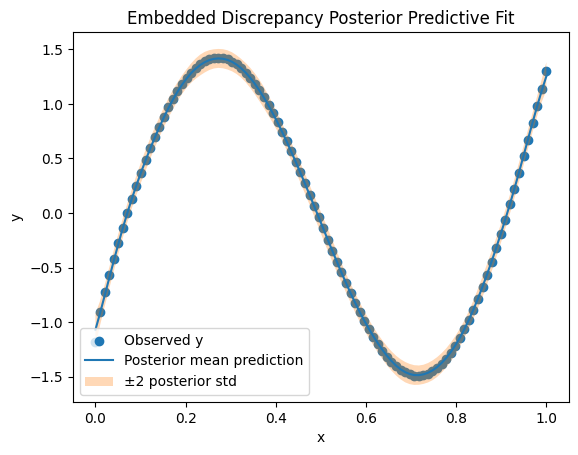

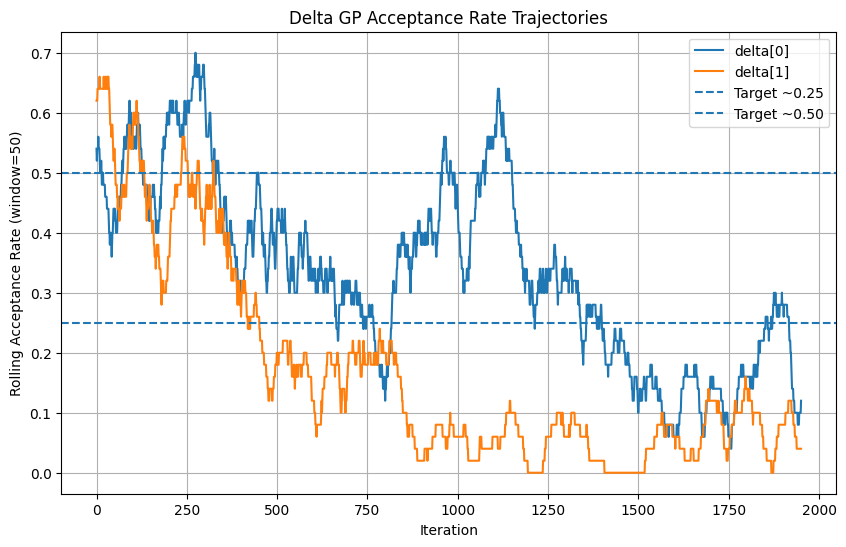

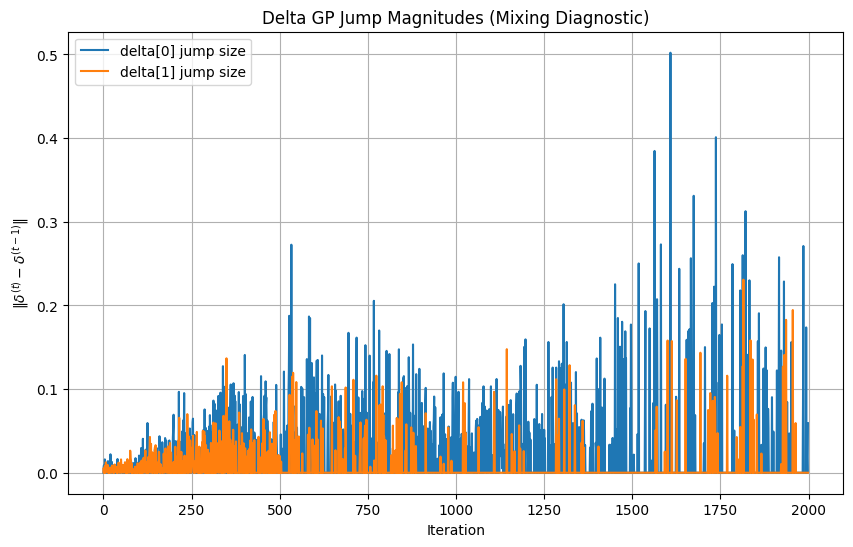

[I 2026-04-07 14:22:18,160] Trial 22 finished with value: 0.8223760089291793 and parameters: {'ell_delta': 0.20505844072879983, 'var_delta': 0.0001641663695928264, 'ell_eta': 0.0569591593941924, 'var_eta': 0.08407362422501469, 'sigma2': 0.0012591569053390487}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.014690053562881734
 delta acceptance rates: [0.54 0.64]
 ell_delta: [0.24666984 0.26267444]
 var_delta: [9.66479246e-05 3.20818753e-04]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1038
[ADAPT] Updated mh_scale_

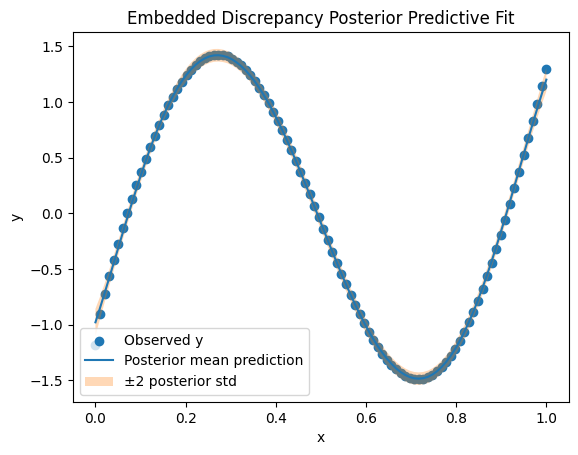

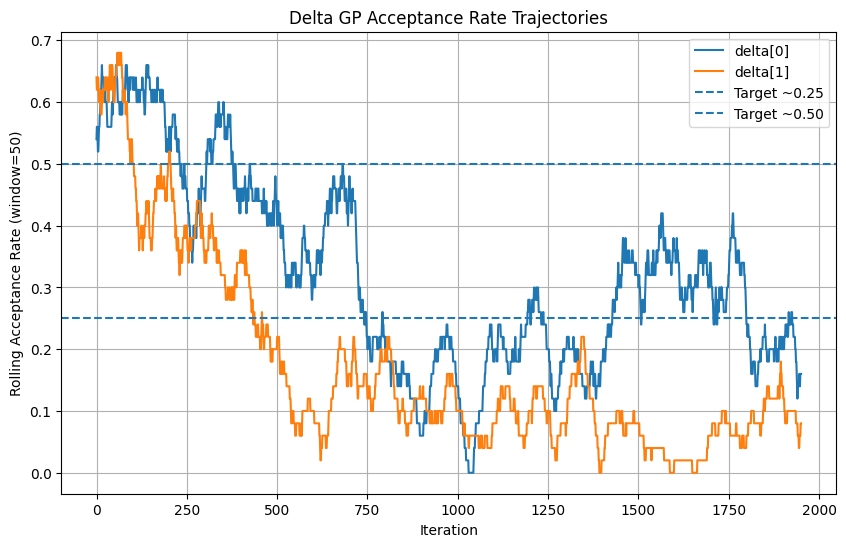

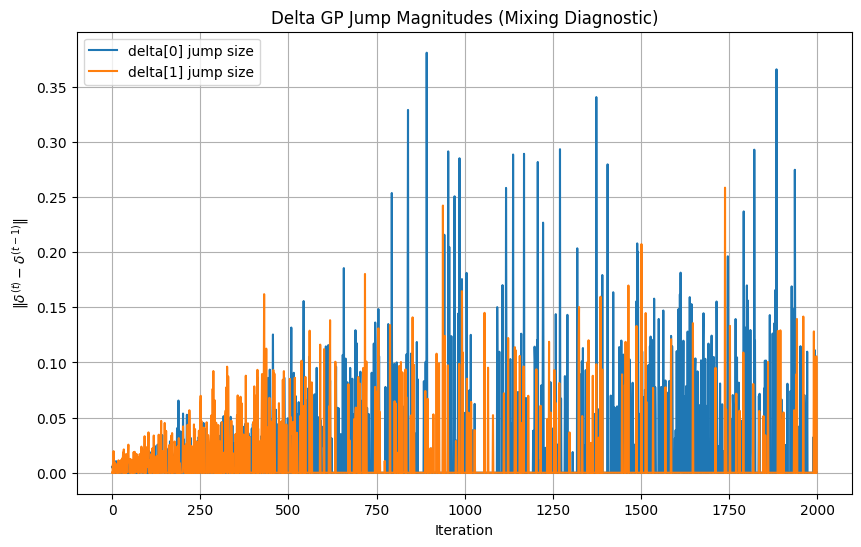

[I 2026-04-07 14:32:05,421] Trial 23 finished with value: 0.8809125084600657 and parameters: {'ell_delta': 0.1809441348755393, 'var_delta': 0.00010941100875221624, 'ell_eta': 0.1345374347731341, 'var_eta': 0.037641756172006983, 'sigma2': 0.00047759245851161186}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.800, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.010158107019842275
 delta acceptance rates: [0.66 0.6 ]
 ell_delta: [0.32751706 0.43003624]
 var_delta: [0.00044209 0.00056294]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1046
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1046
[ADAPT] Iter 60, k=1: acc=0.500, scale=0.1036
[ADAPT] Updated mh_scale_delta fo

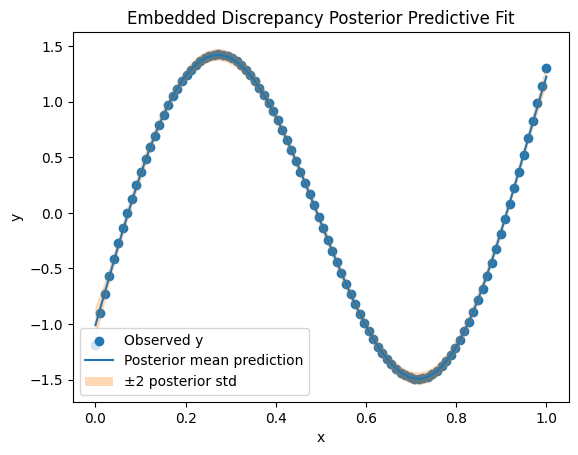

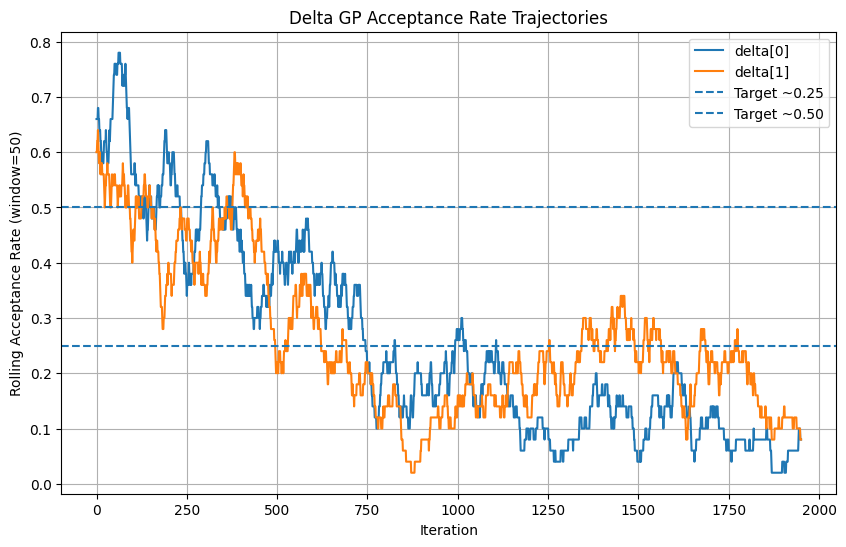

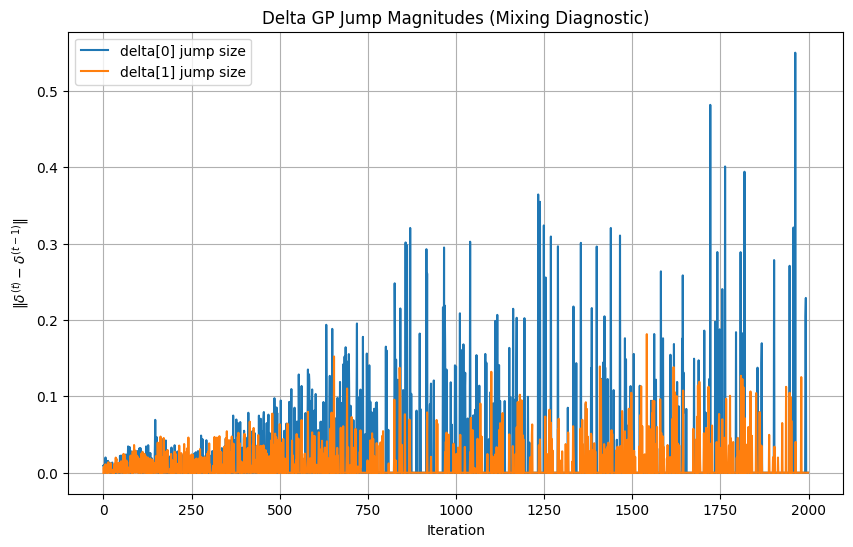

[I 2026-04-07 14:41:40,879] Trial 24 finished with value: 0.8506698659224997 and parameters: {'ell_delta': 0.22177304465412354, 'var_delta': 0.00021348848569911782, 'ell_eta': 0.14244609403363495, 'var_eta': 0.04026771918958448, 'sigma2': 0.001282136249230191}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1008
[ADAPT] Iter 40, k=0: acc=0.800, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 40, k=1: acc=0.700, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.016552121305981615
 delta acceptance rates: [0.7  0.58]
 ell_delta: [0.51529582 0.55220136]
 var_delta: [0.000689   0.00062487]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.600, scale=0.1054
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1054
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1028
[ADAPT] Updated mh_scale_delta fo

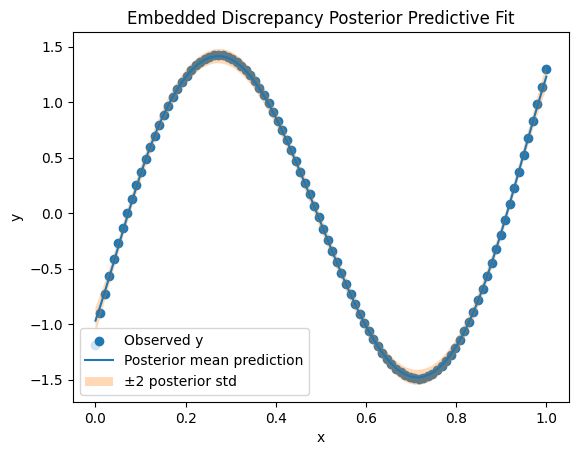

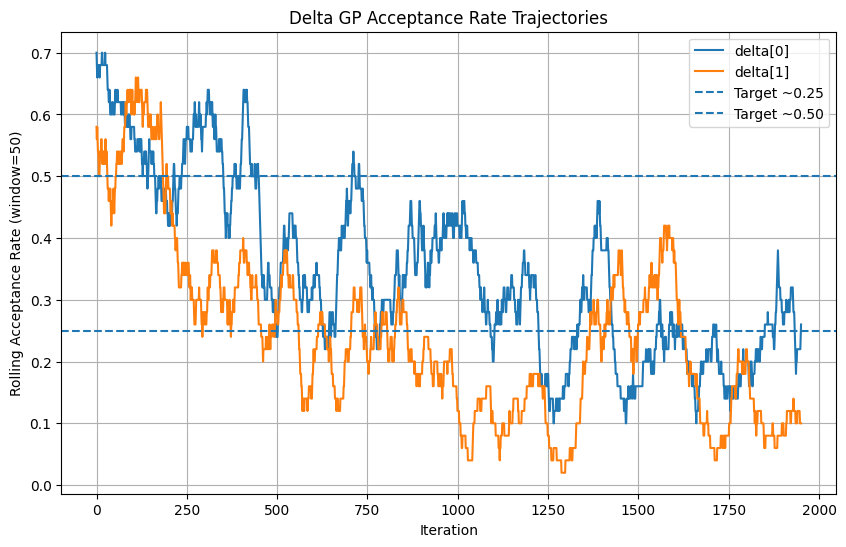

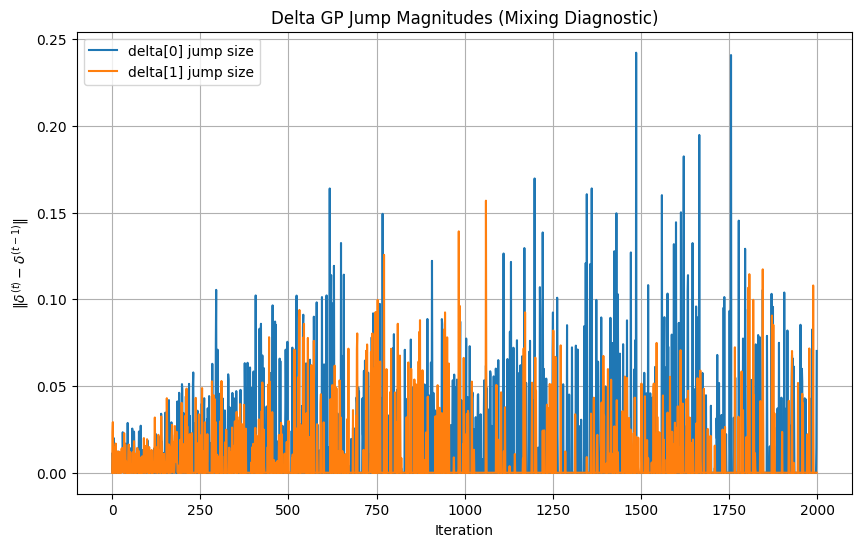

[I 2026-04-07 14:50:43,023] Trial 25 finished with value: 0.8249003310079892 and parameters: {'ell_delta': 0.4045198585364049, 'var_delta': 0.0005745133864699368, 'ell_eta': 0.10146980469641725, 'var_eta': 0.036944112827632075, 'sigma2': 0.0001332324635765456}. Best is trial 19 with value: 0.8218737363144591.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.800, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1036
Iter 50/2000
 sigma2 = 0.013170621036041791
 delta acceptance rates: [0.72 0.66]
 ell_delta: [0.19335673 0.19433464]
 var_delta: [0.00014185 0.00020624]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1049
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1049
[ADAPT] Iter 60, k=1: acc=0.450, scale=0.1041
[ADAPT] Updated mh_scale_delta fo

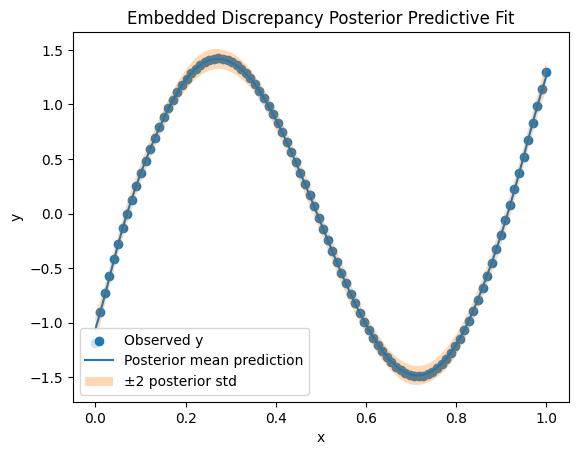

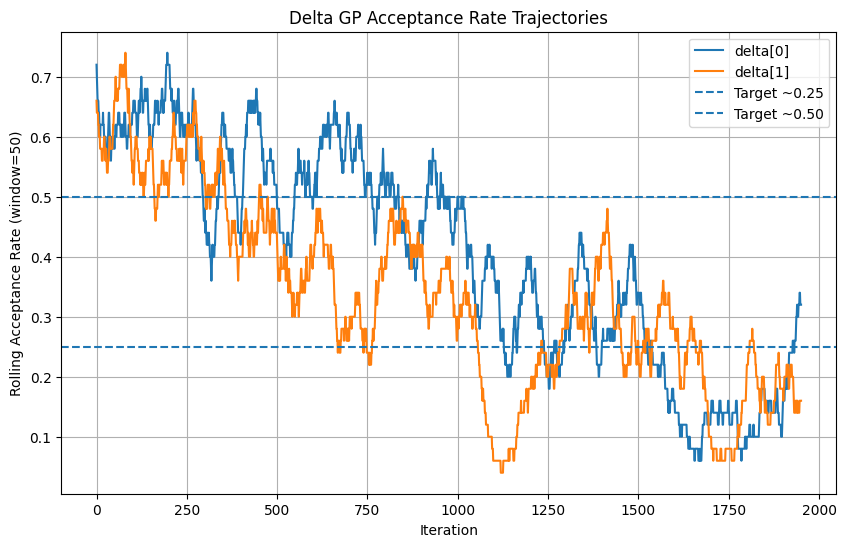

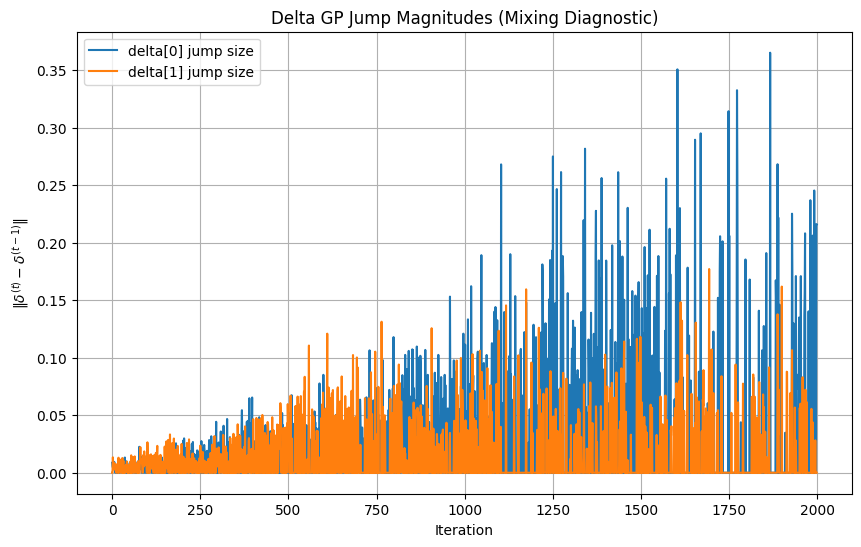

[I 2026-04-07 15:00:34,301] Trial 26 finished with value: 0.804787338843067 and parameters: {'ell_delta': 0.1184539139260971, 'var_delta': 0.00010144272639551804, 'ell_eta': 0.05686626070493033, 'var_eta': 0.09223358251014505, 'sigma2': 0.0011211242837510559}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1008
[ADAPT] Iter 40, k=0: acc=0.550, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.012643992283640442
 delta acceptance rates: [0.58 0.66]
 ell_delta: [0.31491748 0.36880227]
 var_delta: [7.49748157e-05 1.88027091e-04]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1043
[ADAPT] Updated mh_scale_

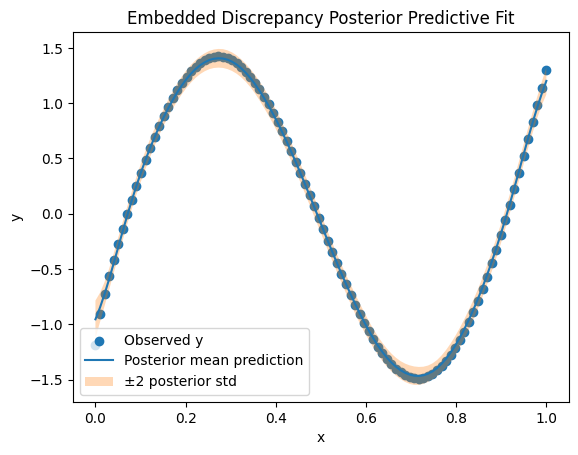

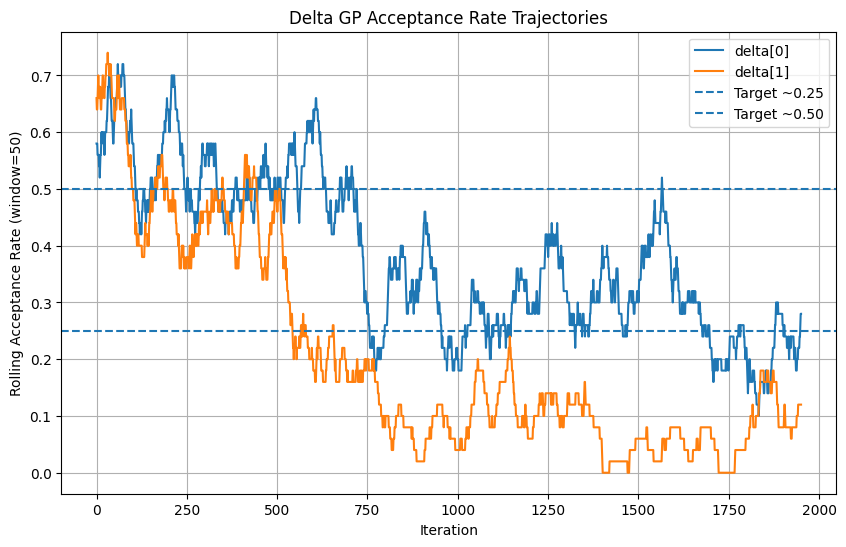

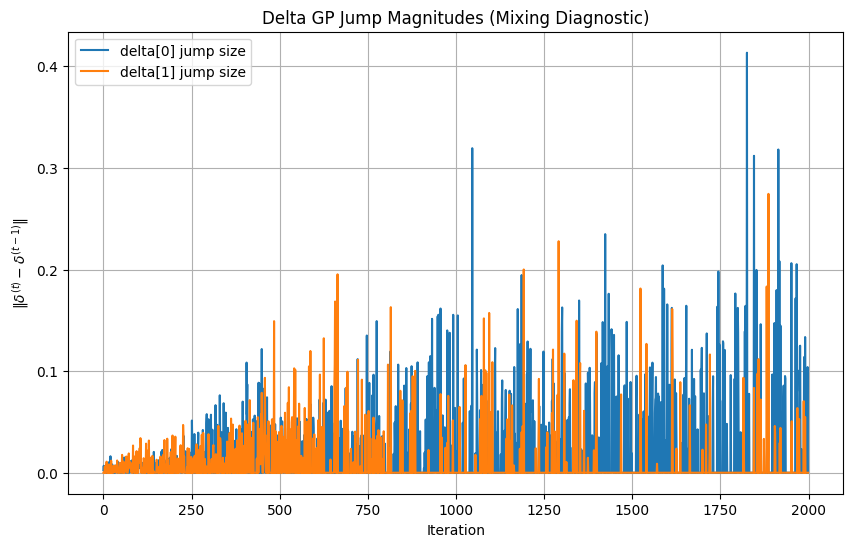

[I 2026-04-07 15:10:03,758] Trial 27 finished with value: 0.8729800741538363 and parameters: {'ell_delta': 0.21912704078973114, 'var_delta': 0.0001008914085237831, 'ell_eta': 0.05668355790311657, 'var_eta': 0.020913055965021975, 'sigma2': 0.00038904508553523035}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1033
Iter 50/2000
 sigma2 = 0.01225399085038434
 delta acceptance rates: [0.56 0.7 ]
 ell_delta: [0.14825275 0.13523139]
 var_delta: [0.00036284 0.00013478]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.600, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 60, k=1: acc=0.800, scale=0.1057
[ADAPT] Updated mh_scale_delta for

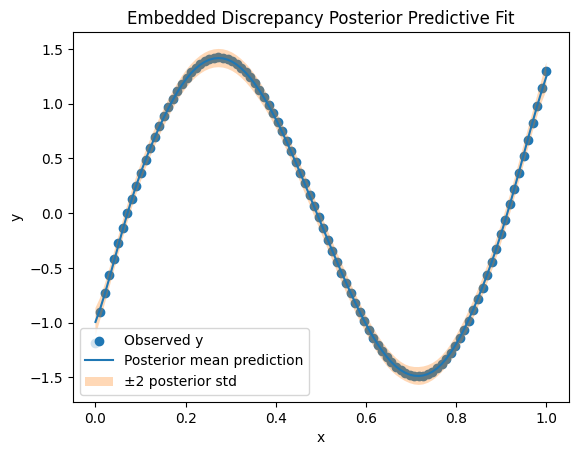

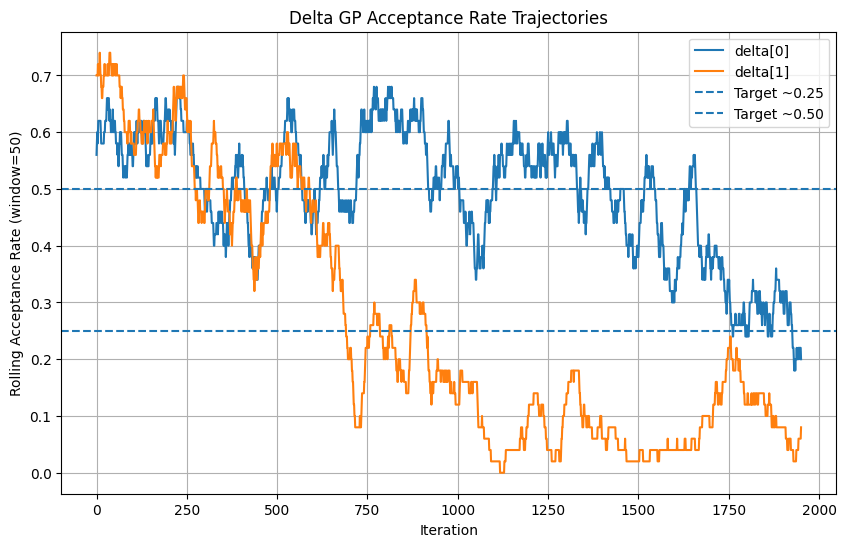

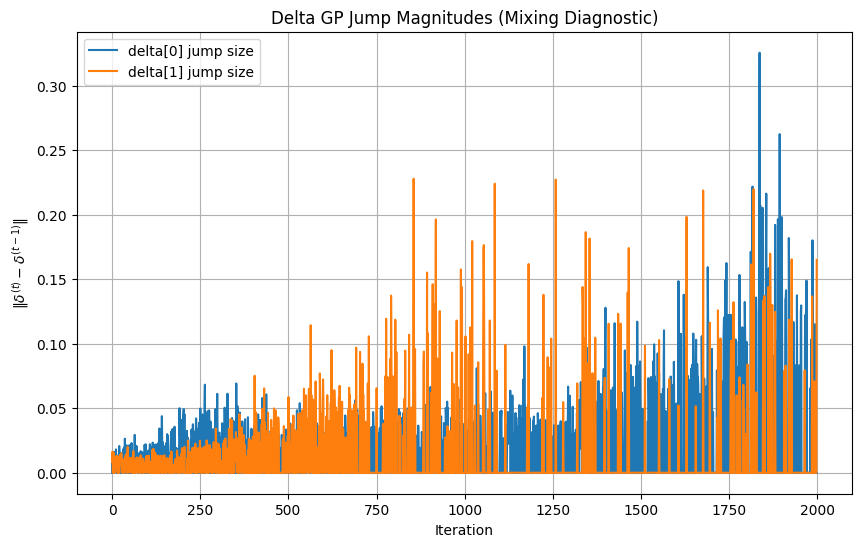

[I 2026-04-07 15:19:23,701] Trial 28 finished with value: 0.8346137832068016 and parameters: {'ell_delta': 0.10212505852787687, 'var_delta': 0.0002500175722761726, 'ell_eta': 0.06394705792299513, 'var_eta': 0.054205944574032265, 'sigma2': 0.0008961062363032346}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.450, scale=0.1005
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1005
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
Iter 50/2000
 sigma2 = 0.007706672922617521
 delta acceptance rates: [0.62 0.44]
 ell_delta: [0.25133133 0.27950846]
 var_delta: [0.00301211 0.00491294]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1015
[ADAPT] Updated mh_scale_delta fo

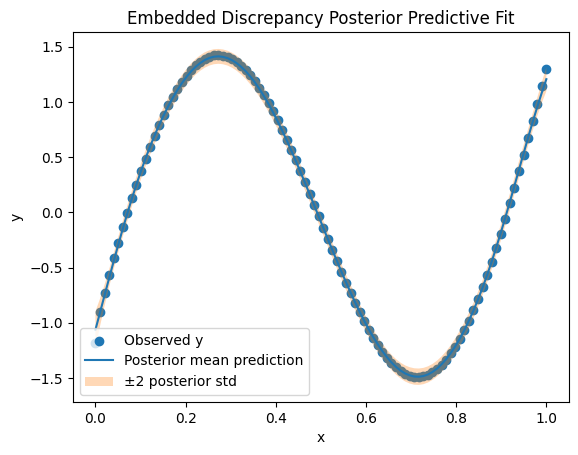

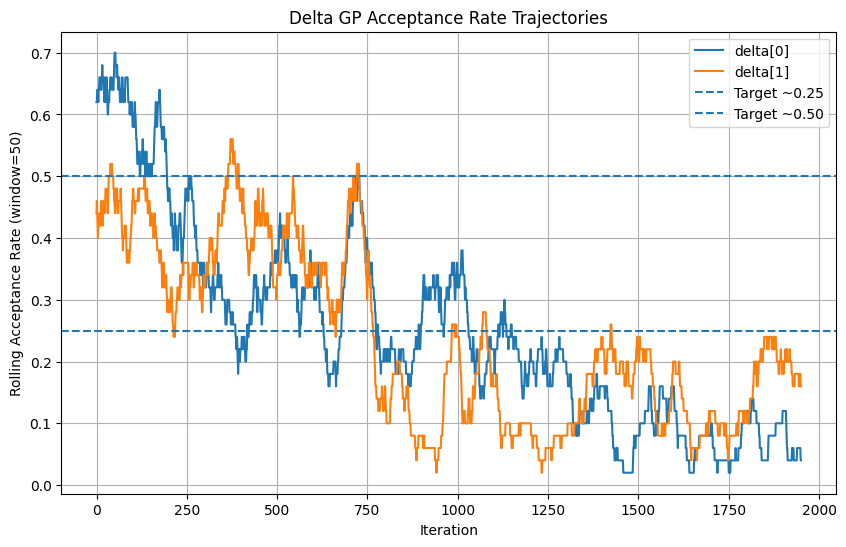

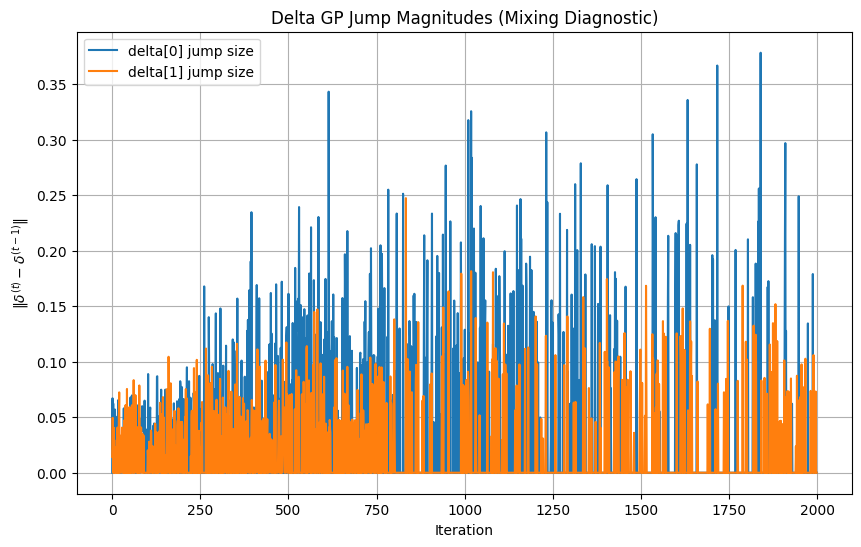

[I 2026-04-07 15:29:06,984] Trial 29 finished with value: 0.8099606640822781 and parameters: {'ell_delta': 0.1837294174404909, 'var_delta': 0.0025470410007758407, 'ell_eta': 0.08409188882739752, 'var_eta': 0.026400112269851575, 'sigma2': 0.005927162910057388}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.016138640963273075
 delta acceptance rates: [0.72 0.66]
 ell_delta: [0.15675609 0.13711217]
 var_delta: [0.00275864 0.00513879]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1051
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1051
[ADAPT] Iter 60, k=1: acc=0.550, scale=0.1038
[ADAPT] Updated mh_scale_delta fo

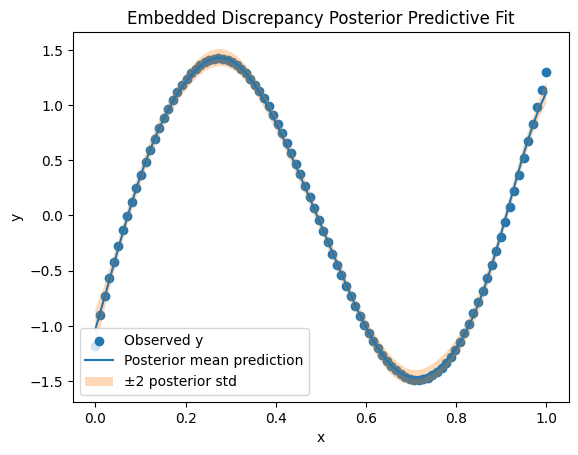

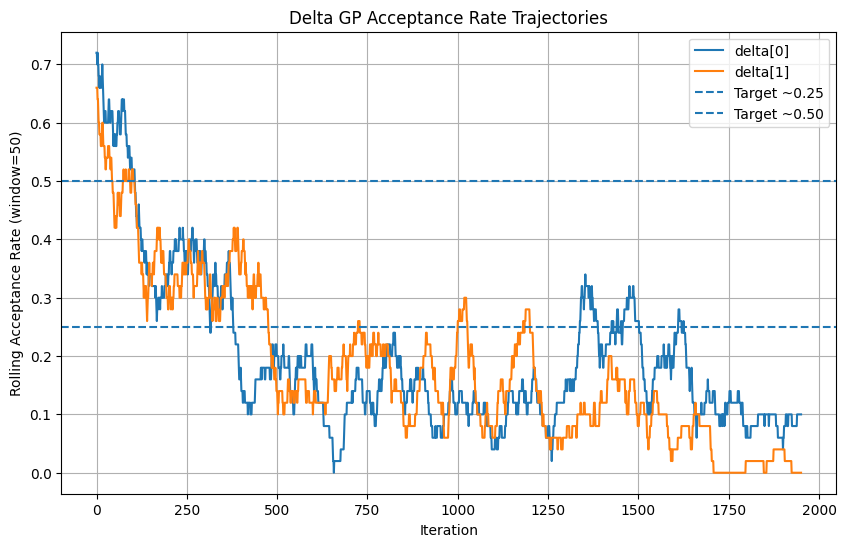

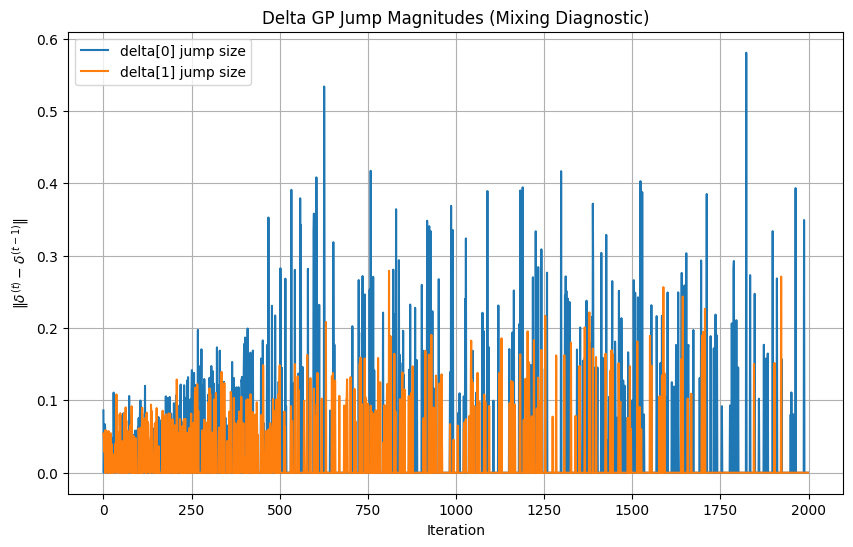

[I 2026-04-07 15:38:33,144] Trial 30 finished with value: 0.8823418446670865 and parameters: {'ell_delta': 0.11088352738918626, 'var_delta': 0.003537575370272232, 'ell_eta': 0.08294367971397498, 'var_eta': 0.00658405239315438, 'sigma2': 1.1350177005401176e-05}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 36 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.800, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.450, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.012586746115777602
 delta acceptance rates: [0.64 0.56]
 ell_delta: [0.23084319 0.23684634]
 var_delta: [0.00073291 0.00163692]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.700, scale=0.1046
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1046
[ADAPT] Iter 60, k=1: acc=0.450, scale=0.1030
[ADAPT] Updated mh_scale_delta fo

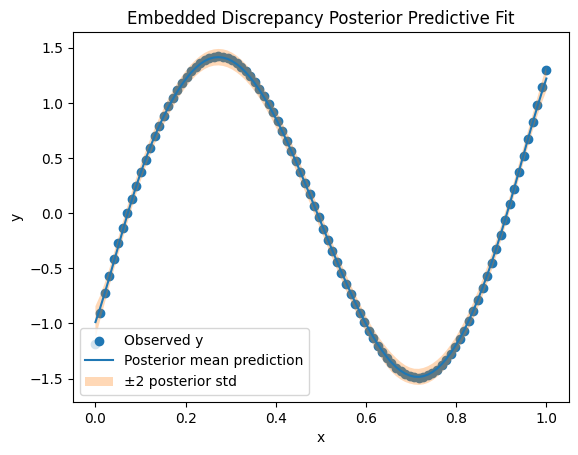

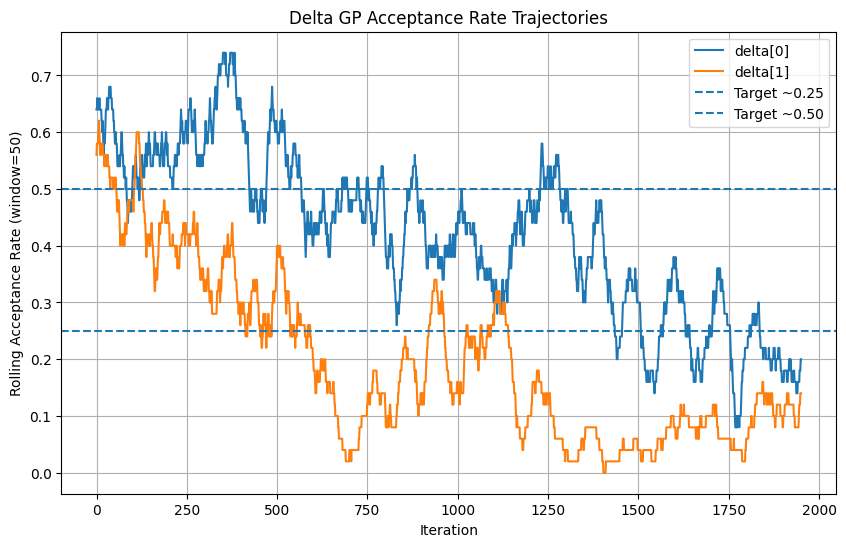

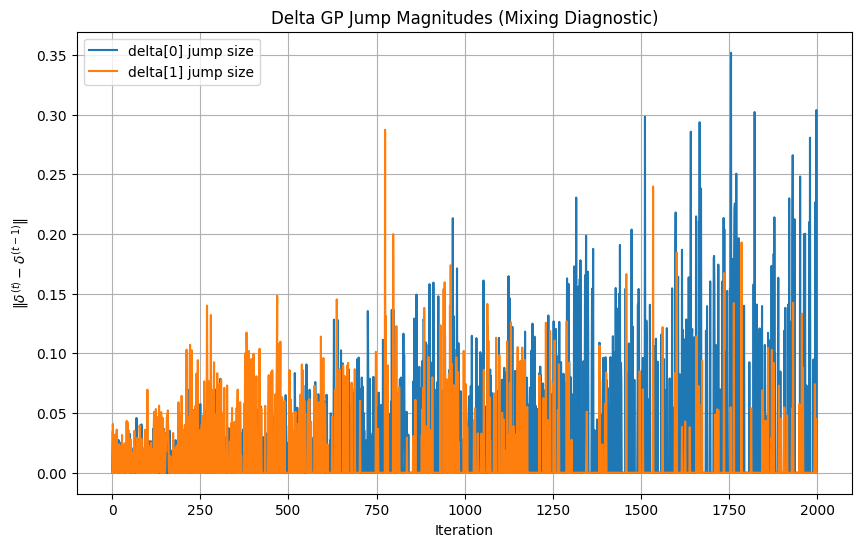

[I 2026-04-07 15:48:11,713] Trial 31 finished with value: 0.8589697762311588 and parameters: {'ell_delta': 0.1793309902149825, 'var_delta': 0.0006950215205610488, 'ell_eta': 0.06905709198659327, 'var_eta': 0.02468909059407803, 'sigma2': 0.006360564249996215}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.008869631661338447
 delta acceptance rates: [0.64 0.6 ]
 ell_delta: [0.68325809 0.62464192]
 var_delta: [0.00015618 0.00054182]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.650, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1033
[ADAPT] Updated mh_scale_delta fo

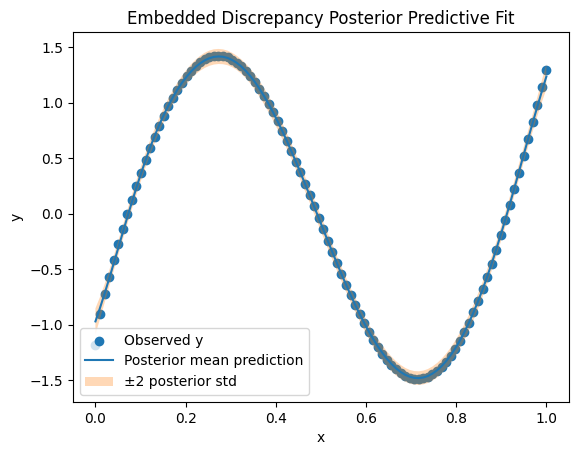

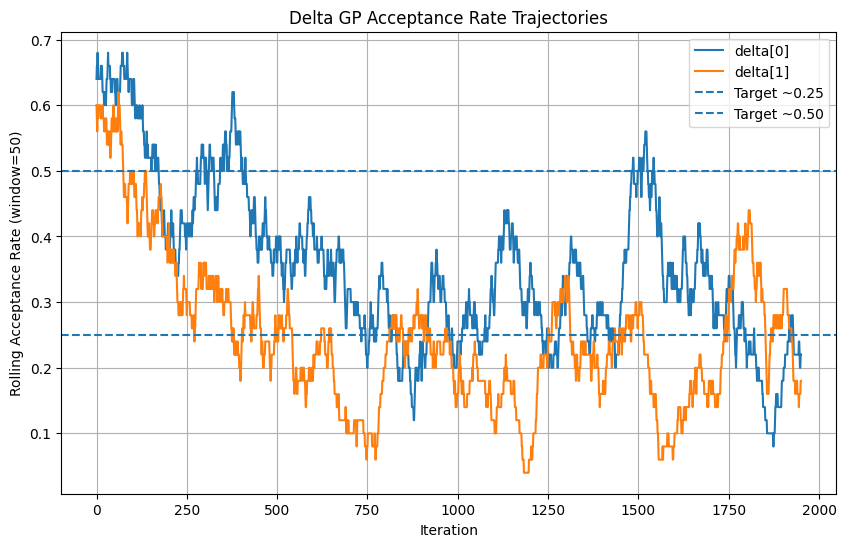

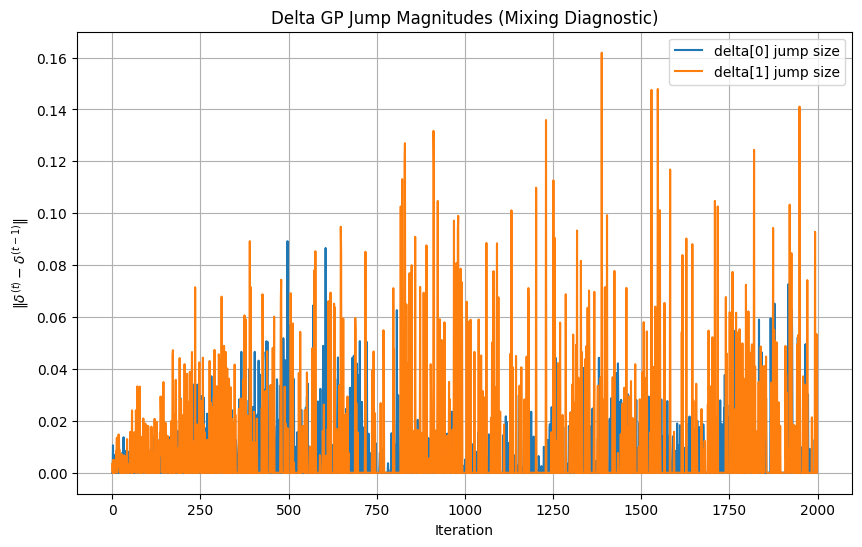

[I 2026-04-07 15:57:33,175] Trial 32 finished with value: 0.8840778292960852 and parameters: {'ell_delta': 0.3778625046600297, 'var_delta': 0.0001472123886173196, 'ell_eta': 0.10258563037883515, 'var_eta': 0.05661243226238936, 'sigma2': 0.004875881584206805}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.350, scale=0.1000
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1000
[ADAPT] Iter 20, k=1: acc=0.300, scale=0.0998
[ADAPT] Updated mh_scale_delta for theta_1 = 0.0998
[ADAPT] Iter 40, k=0: acc=0.300, scale=0.0998
[ADAPT] Updated mh_scale_delta for theta_0 = 0.0998
[ADAPT] Iter 40, k=1: acc=0.400, scale=0.1000
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1000
Iter 50/2000
 sigma2 = 0.009859200470269084
 delta acceptance rates: [0.36 0.36]
 ell_delta: [0.33024079 0.33942872]
 var_delta: [0.00789538 0.02186699]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.450, scale=0.1003
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1003
[ADAPT] Iter 60, k=1: acc=0.250, scale=0.0995
[ADAPT] Updated mh_scale_delta fo

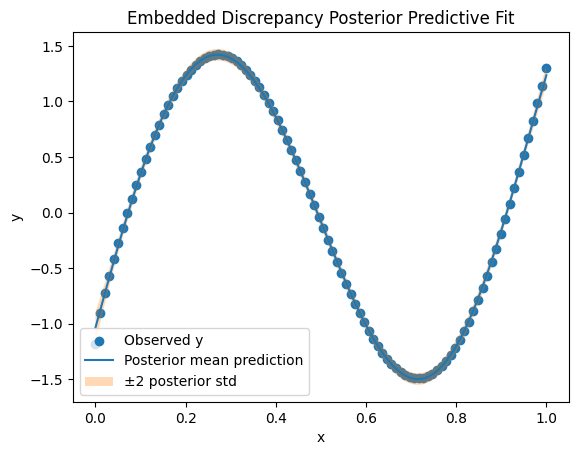

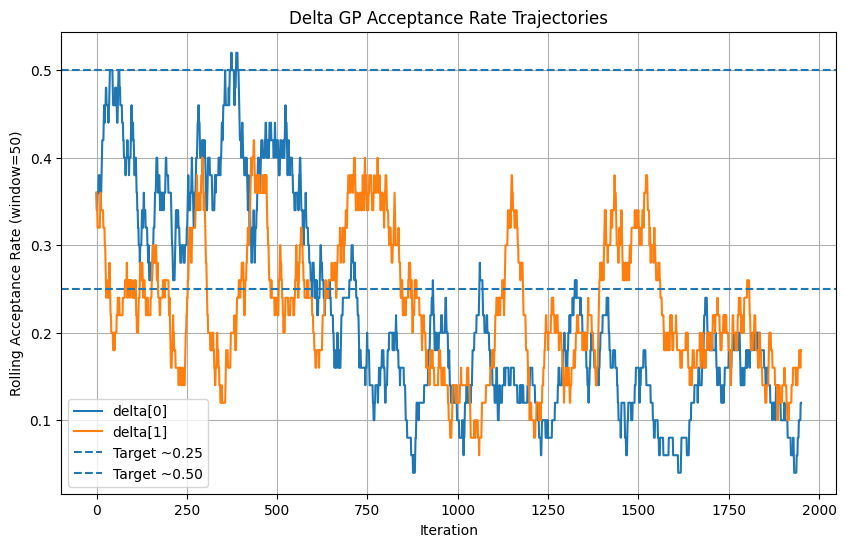

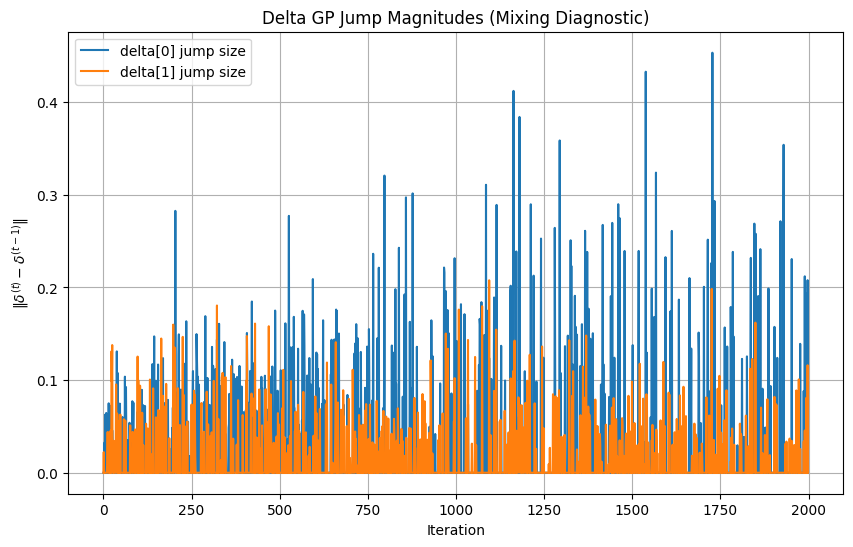

[I 2026-04-07 16:07:07,637] Trial 33 finished with value: 0.8300530139637399 and parameters: {'ell_delta': 0.24503578112014796, 'var_delta': 0.0071253808556806675, 'ell_eta': 0.20604298492397316, 'var_eta': 0.08939656773709184, 'sigma2': 0.0005239256894964797}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.400, scale=0.1003
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1003
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
Iter 50/2000
 sigma2 = 0.02582360636180573
 delta acceptance rates: [0.6 0.5]
 ell_delta: [0.21107373 0.25151431]
 var_delta: [0.00162753 0.00481013]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.500, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for t

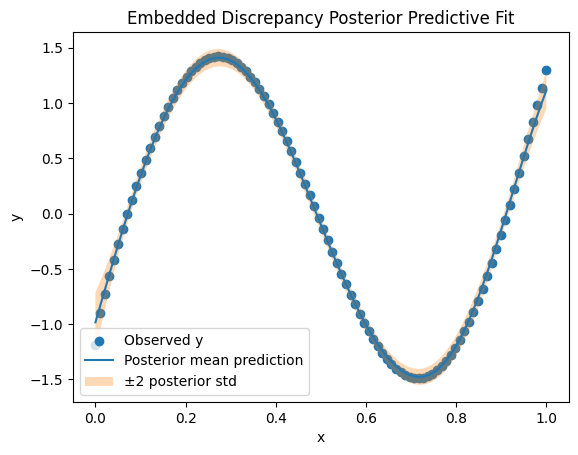

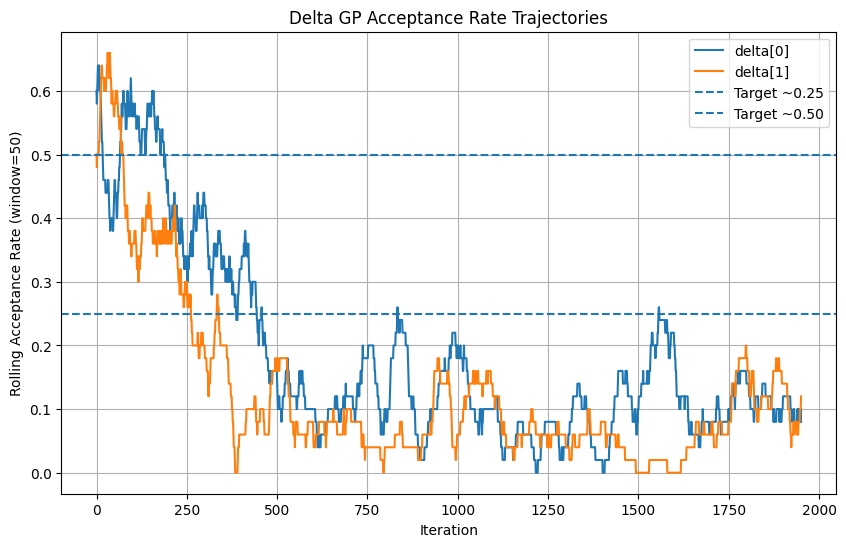

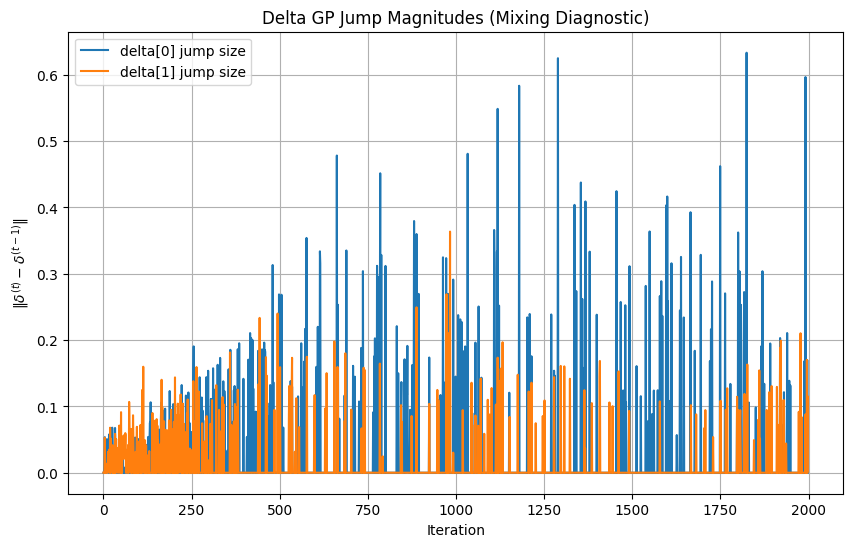

[I 2026-04-07 16:16:54,152] Trial 34 finished with value: 0.8400879027609208 and parameters: {'ell_delta': 0.17309318686321865, 'var_delta': 0.0021431789631311143, 'ell_eta': 0.3510159203486864, 'var_eta': 0.021450739797175874, 'sigma2': 0.0014690701305414625}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 22 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1008
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.800, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.350, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
Iter 50/2000
 sigma2 = 0.011772153969258474
 delta acceptance rates: [0.58 0.56]
 ell_delta: [0.22240529 0.12552755]
 var_delta: [0.00032124 0.00084791]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.450, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 60, k=1: acc=0.500, scale=0.1028
[ADAPT] Updated mh_scale_delta fo

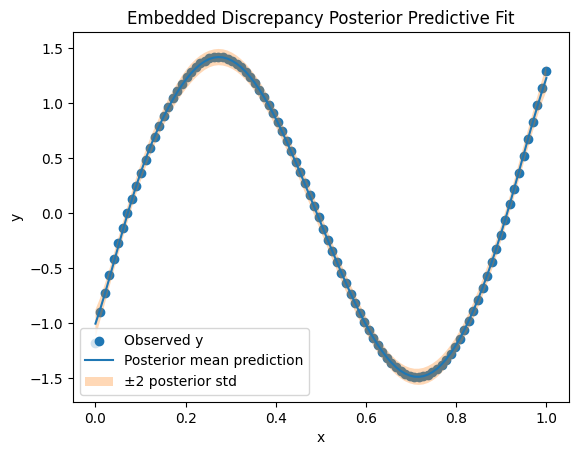

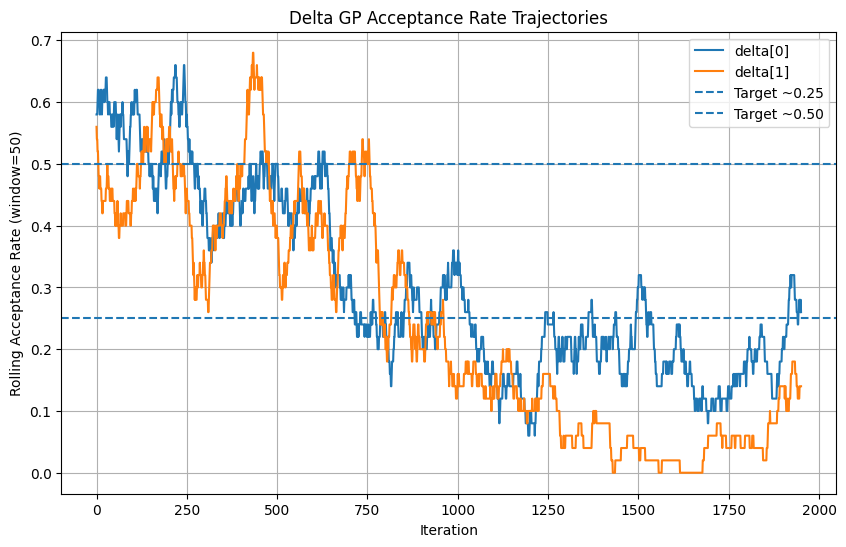

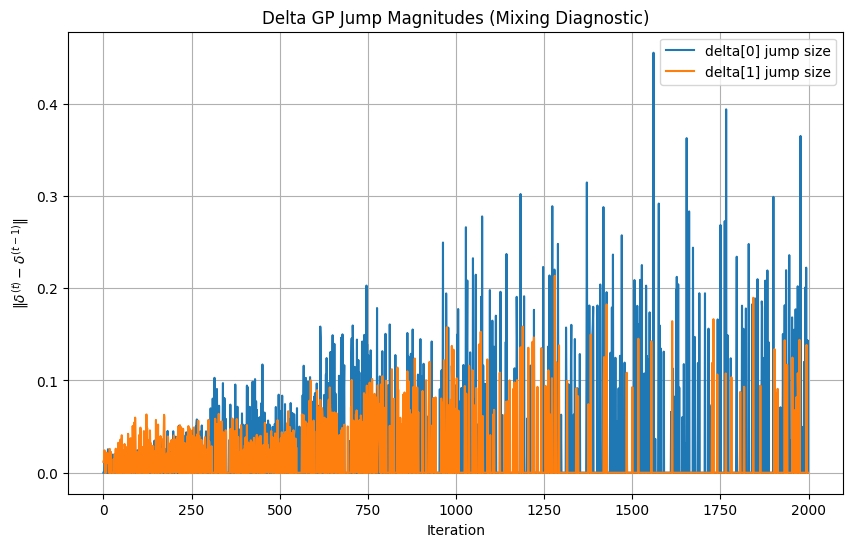

[I 2026-04-07 16:26:06,305] Trial 35 finished with value: 0.8656472264485457 and parameters: {'ell_delta': 0.0873249582184841, 'var_delta': 0.000311974401374963, 'ell_eta': 0.07502535882010708, 'var_eta': 0.053530758106731434, 'sigma2': 0.002776349011883843}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.450, scale=0.1005
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1005
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.500, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1023
Iter 50/2000
 sigma2 = 0.046056626709250675
 delta acceptance rates: [0.48 0.56]
 ell_delta: [0.16722142 0.16049602]
 var_delta: [0.02594028 0.01491639]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.450, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 60, k=1: acc=0.350, scale=0.1023
[ADAPT] Updated mh_scale_delta fo

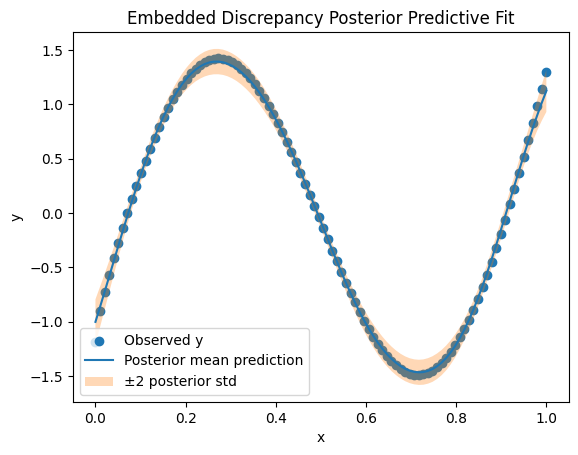

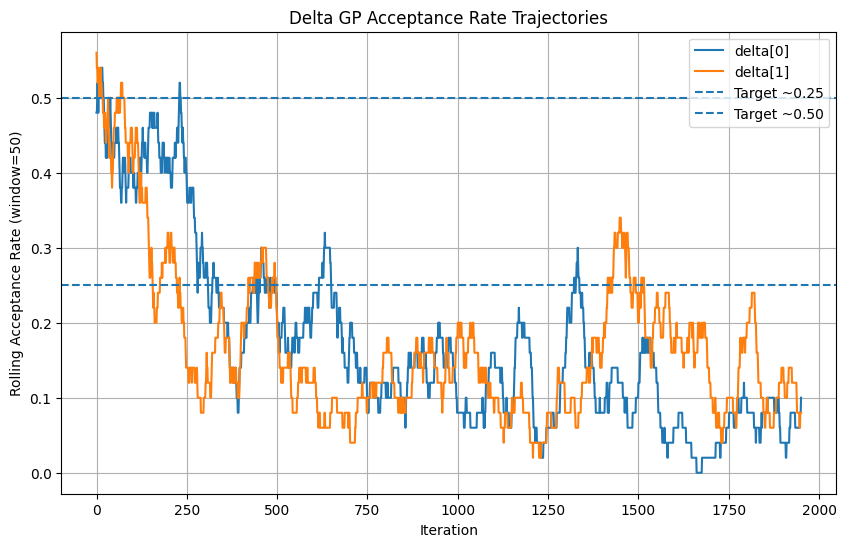

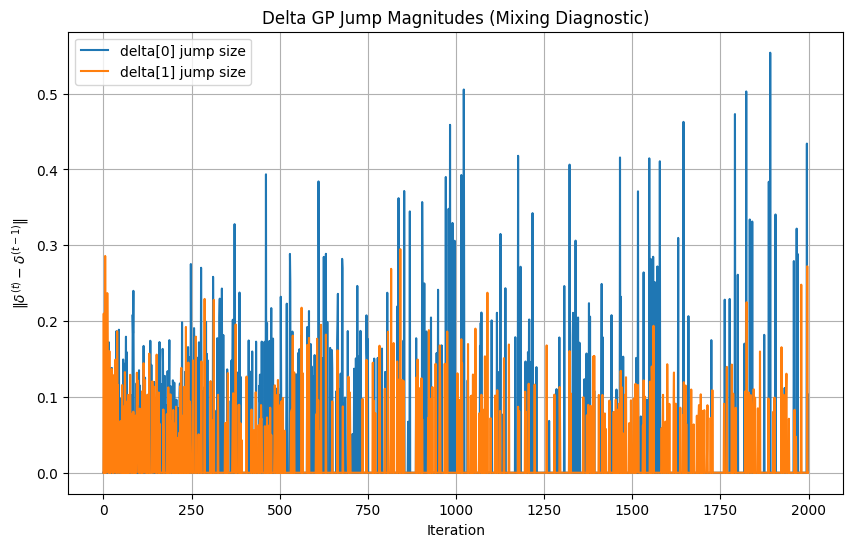

[I 2026-04-07 16:35:54,997] Trial 36 finished with value: 1.033789440810088 and parameters: {'ell_delta': 0.13148805623872037, 'var_delta': 0.02504146912711868, 'ell_eta': 0.6623600084659654, 'var_eta': 0.029083438358464494, 'sigma2': 0.005299767457146149}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.700, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1033
Iter 50/2000
 sigma2 = 0.012550369456127568
 delta acceptance rates: [0.66 0.66]
 ell_delta: [0.55956302 0.74602977]
 var_delta: [0.00066761 0.00037384]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.800, scale=0.1049
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1049
[ADAPT] Iter 60, k=1: acc=0.750, scale=0.1054
[ADAPT] Updated mh_scale_delta fo

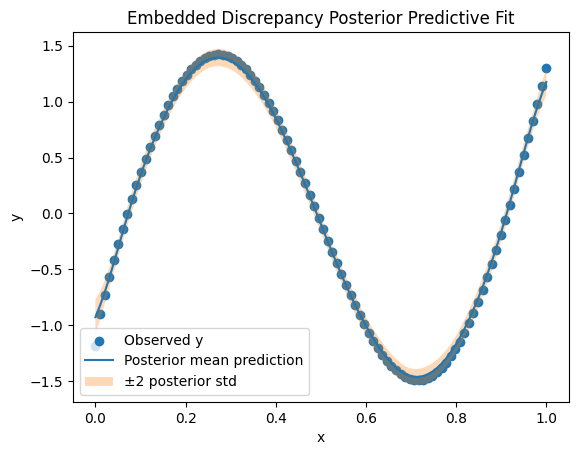

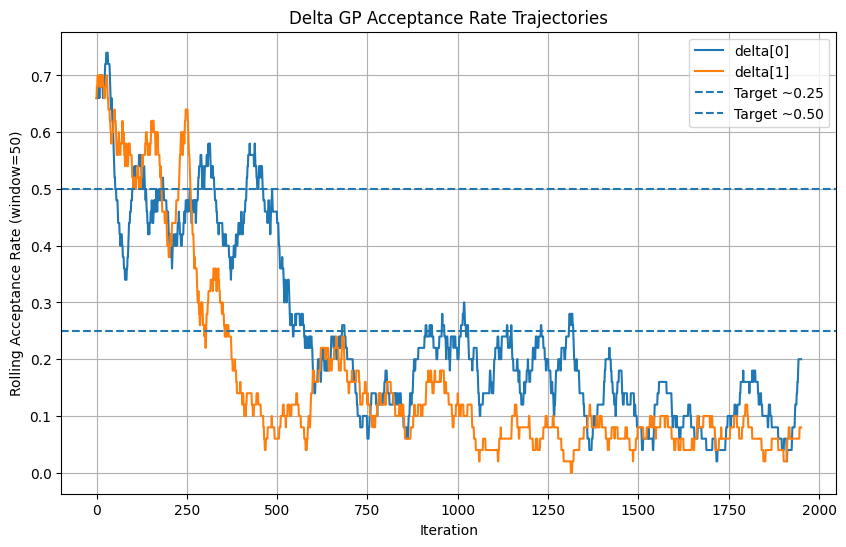

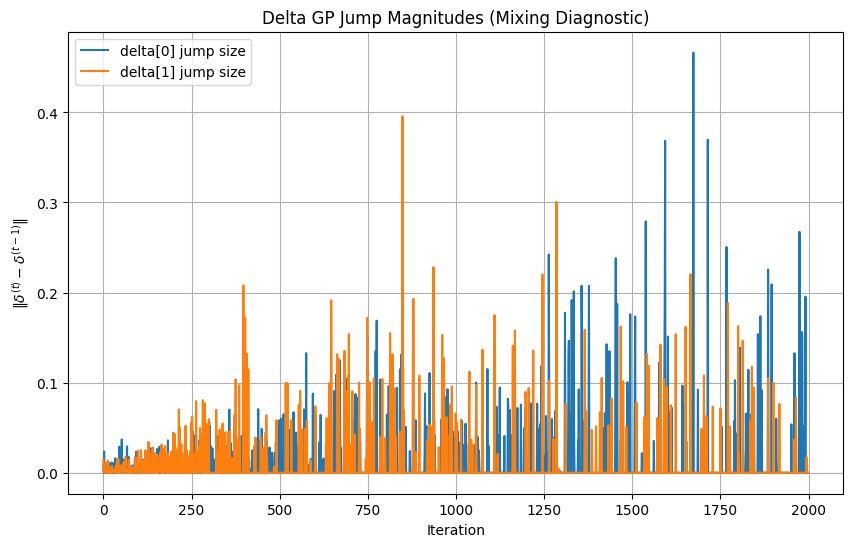

[I 2026-04-07 16:45:48,210] Trial 37 finished with value: 0.8602341610267354 and parameters: {'ell_delta': 0.33596154431713177, 'var_delta': 0.0003974200006939217, 'ell_eta': 0.05384614766888595, 'var_eta': 0.012079479970865229, 'sigma2': 0.0007177308037940831}. Best is trial 26 with value: 0.804787338843067.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 22 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
Iter 50/2000
 sigma2 = 0.015093409299608663
 delta acceptance rates: [0.62 0.5 ]
 ell_delta: [0.13495628 0.15049588]
 var_delta: [0.00170959 0.00045438]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 60, k=1: acc=0.300, scale=0.1018
[ADAPT] Updated mh_scale_delta fo

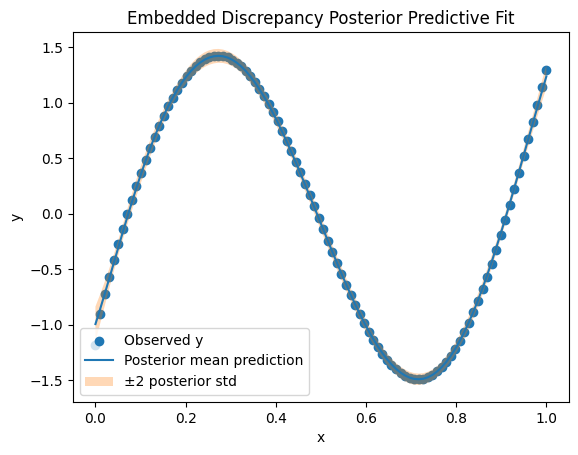

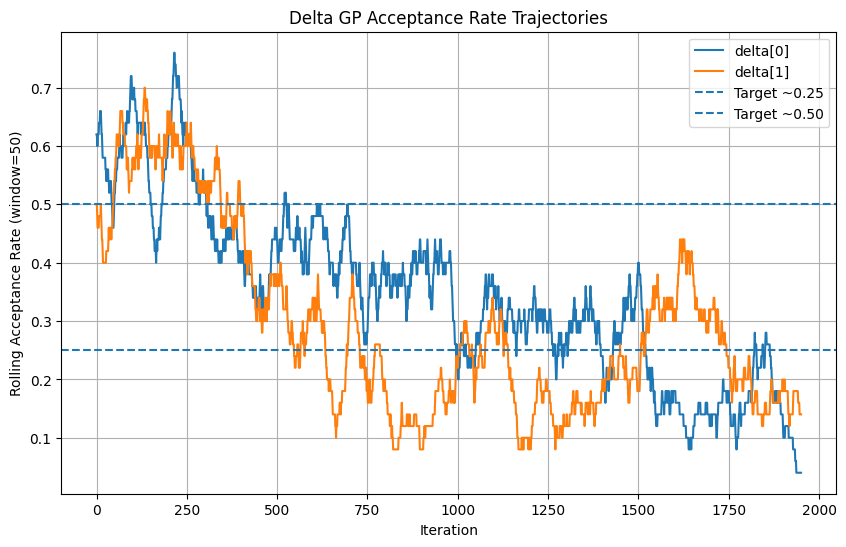

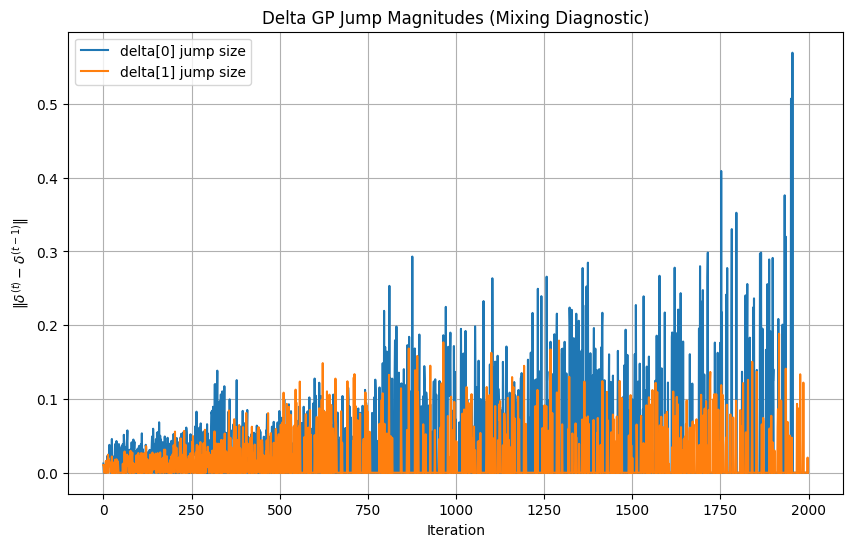

[I 2026-04-07 16:55:05,439] Trial 38 finished with value: 0.7495685836154033 and parameters: {'ell_delta': 0.09624326691497613, 'var_delta': 0.00024488153504940427, 'ell_eta': 0.18409246287654588, 'var_eta': 0.05458619034494637, 'sigma2': 0.00029991120819806326}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 40, k=1: acc=0.700, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.015133299679250976
 delta acceptance rates: [0.54 0.62]
 ell_delta: [0.08950662 0.08837455]
 var_delta: [0.00051217 0.00086464]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.450, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1043
[ADAPT] Updated mh_scale_delta fo

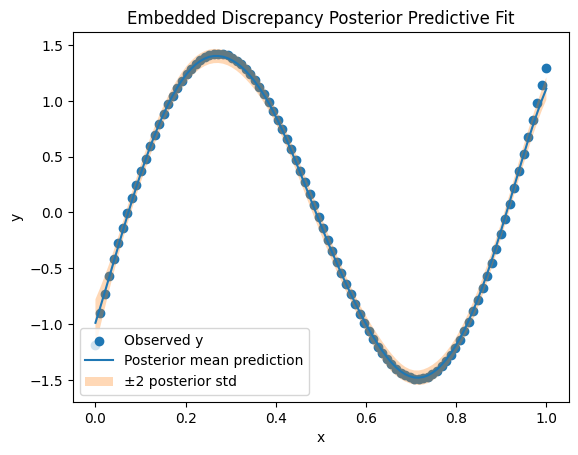

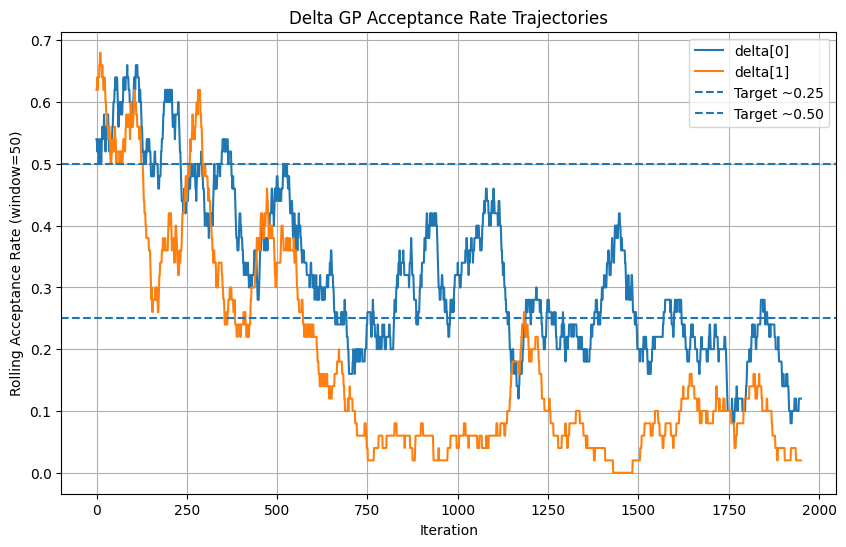

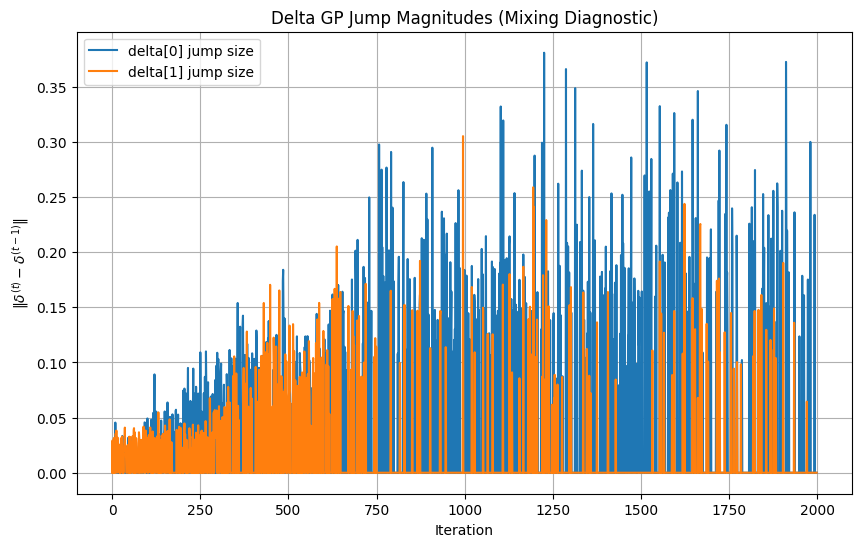

[I 2026-04-07 17:04:02,089] Trial 39 finished with value: 0.822002887151744 and parameters: {'ell_delta': 0.06556855983820256, 'var_delta': 0.0007977108397784783, 'ell_eta': 0.18799799146308263, 'var_eta': 0.009377276991348237, 'sigma2': 0.00016118808957495798}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1008
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.800, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1028
Iter 50/2000
 sigma2 = 0.03037132302023363
 delta acceptance rates: [0.6  0.62]
 ell_delta: [0.12503183 0.11152263]
 var_delta: [0.00309287 0.00269234]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.300, scale=0.1028
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1028
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1041
[ADAPT] Updated mh_scale_delta for

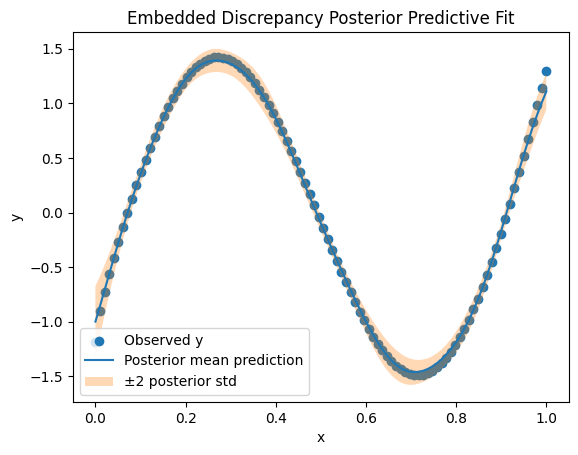

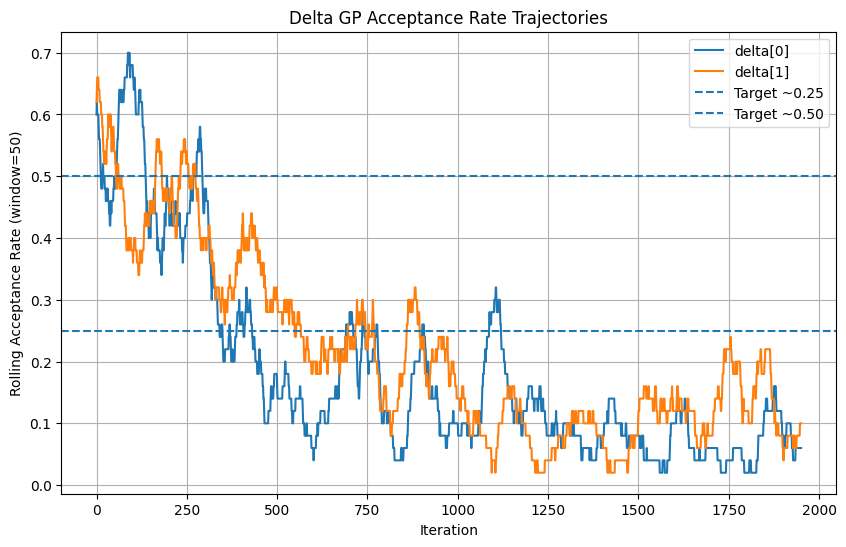

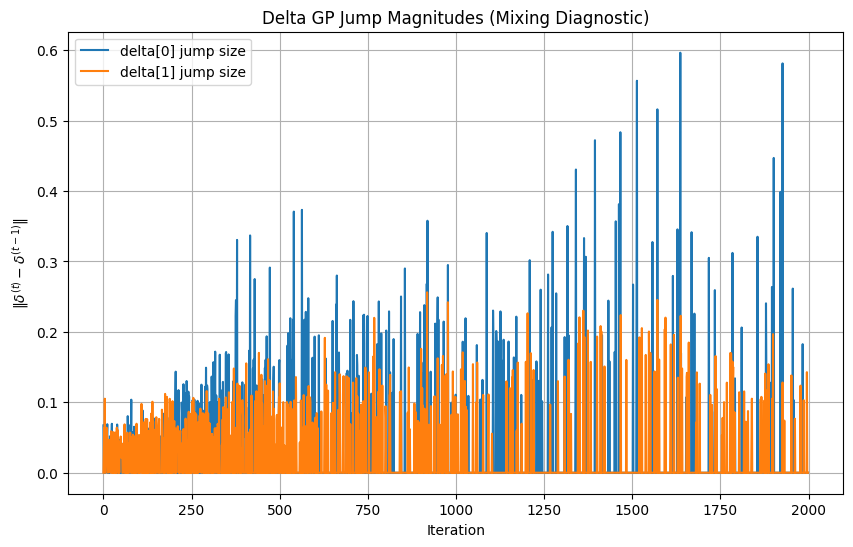

[I 2026-04-07 17:14:42,524] Trial 40 finished with value: 0.9405630960357245 and parameters: {'ell_delta': 0.09494294588913568, 'var_delta': 0.0037749872109563093, 'ell_eta': 0.39135941042238404, 'var_eta': 0.016340828509101617, 'sigma2': 0.0003081750841732275}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1018
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
Iter 50/2000
 sigma2 = 0.01316851621776144
 delta acceptance rates: [0.62 0.5 ]
 ell_delta: [0.07095304 0.08381933]
 var_delta: [0.00040797 0.00066953]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.600, scale=0.1043
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1043
[ADAPT] Iter 60, k=1: acc=0.350, scale=0.1020
[ADAPT] Updated mh_scale_delta for

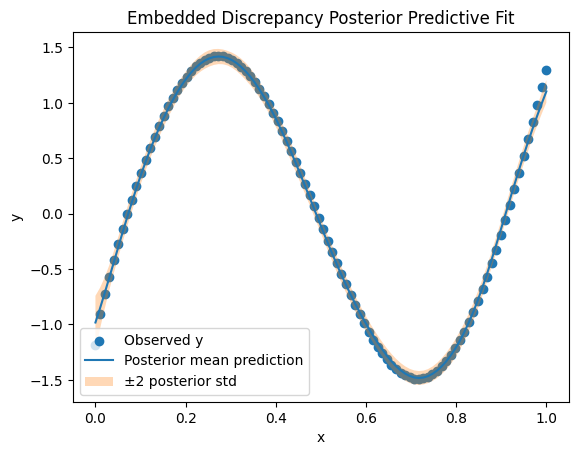

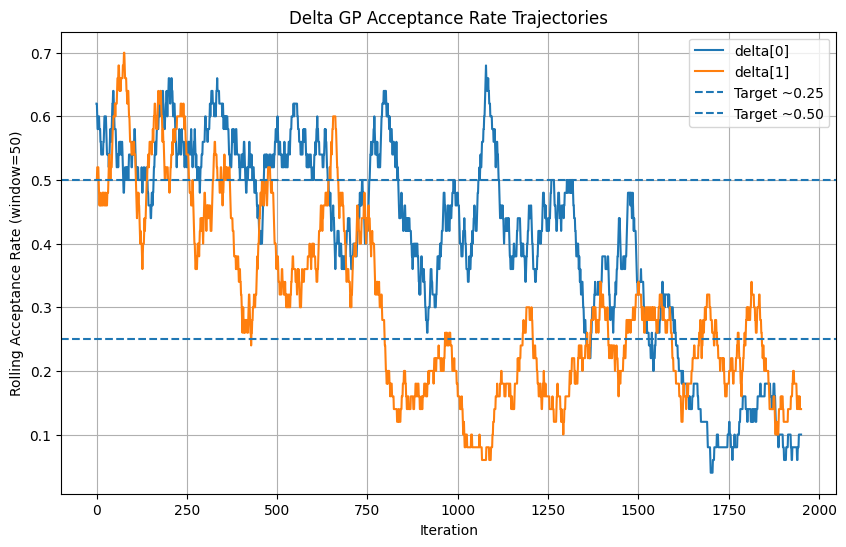

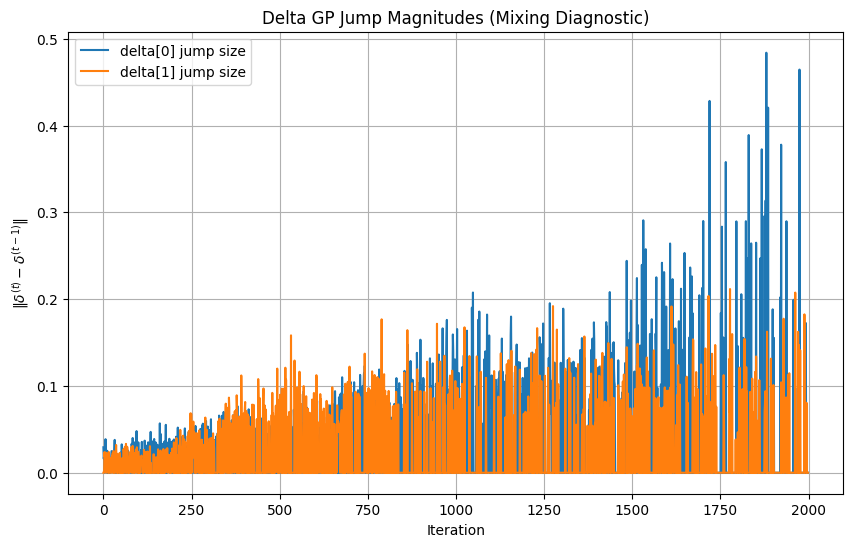

[I 2026-04-07 17:22:44,287] Trial 41 finished with value: 0.8233560013053111 and parameters: {'ell_delta': 0.06474904813042387, 'var_delta': 0.0007814653236988057, 'ell_eta': 0.20637289950060214, 'var_eta': 0.01130347441709361, 'sigma2': 0.00015549494409115164}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 23 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 21 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_v


Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.016028232654475425
 delta acceptance rates: [0.54 0.58]
 ell_delta: [0.09994967 0.11569107]
 var_delta: [0.00190984 0.00156114]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.300, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1028
[ADAPT] Updated mh_scale_delta fo

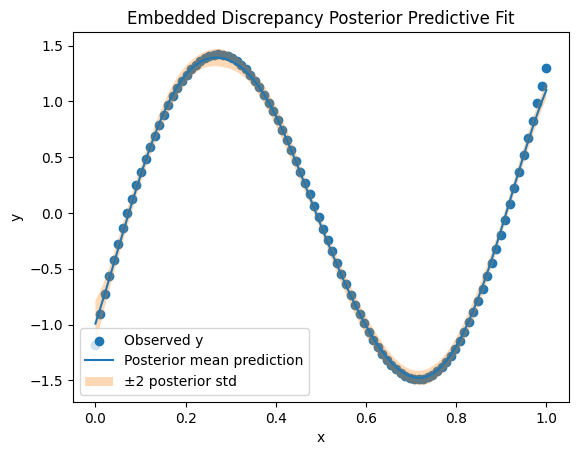

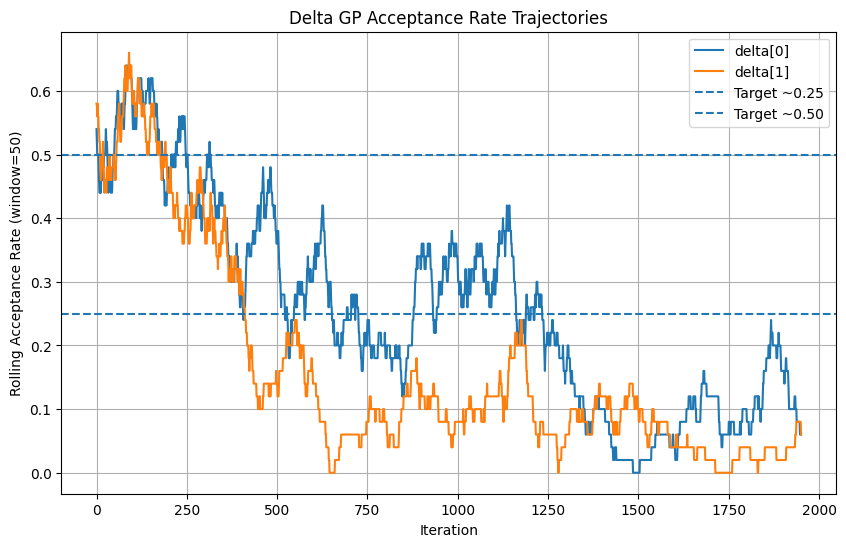

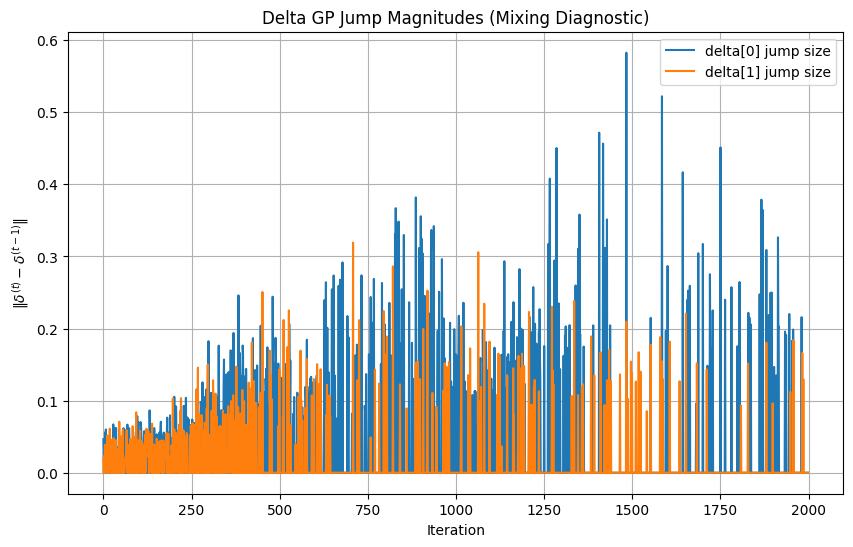

[I 2026-04-07 17:29:50,962] Trial 42 finished with value: 0.8508259060461981 and parameters: {'ell_delta': 0.08076846268197195, 'var_delta': 0.002107716325176583, 'ell_eta': 0.16317372478340353, 'var_eta': 0.00544135015614125, 'sigma2': 8.234382014223663e-05}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.500, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1020
[ADAPT] Iter 40, k=1: acc=0.750, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1036
Iter 50/2000
 sigma2 = 0.01130102711983653
 delta acceptance rates: [0.6  0.66]
 ell_delta: [0.1931629  0.15869131]
 var_delta: [1.14028426e-04 6.26291584e-05]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.850, scale=0.1046
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1046
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1049
[ADAPT] Updated mh_scale_d

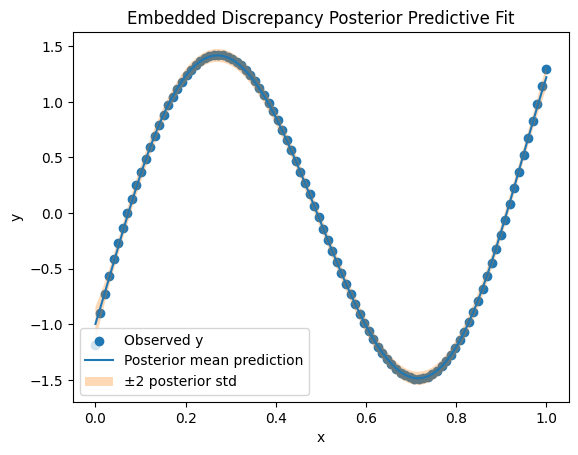

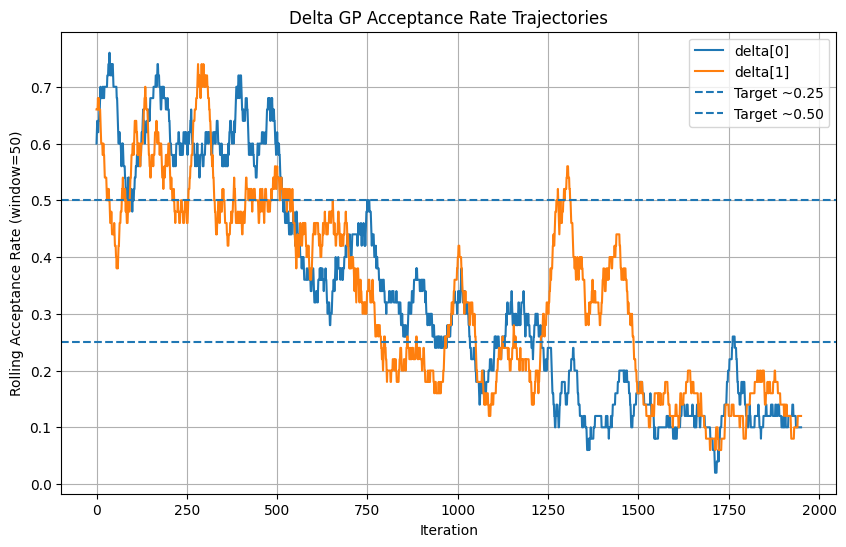

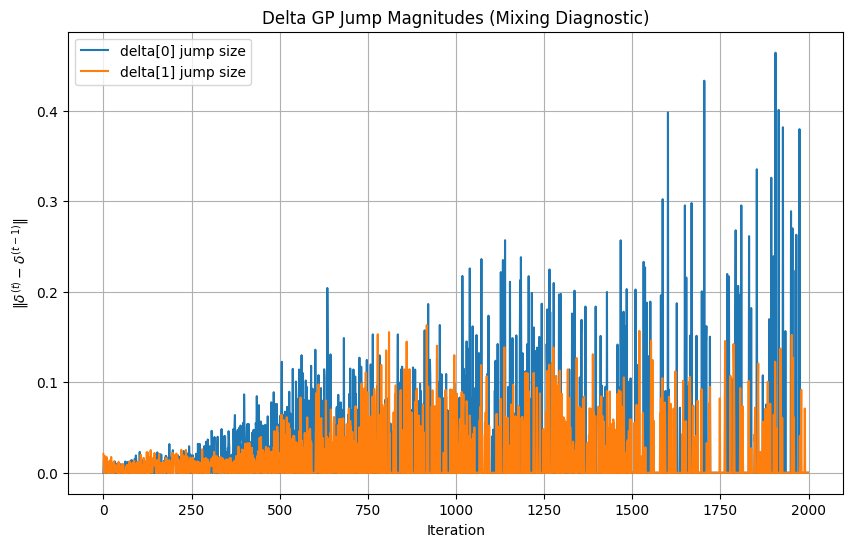

[I 2026-04-07 17:37:02,401] Trial 43 finished with value: 0.8216544182158236 and parameters: {'ell_delta': 0.11955800182075838, 'var_delta': 0.0002522153872150749, 'ell_eta': 0.11534506362868614, 'var_eta': 0.03136952006082132, 'sigma2': 0.00014058781586082095}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1010
[ADAPT] Iter 20, k=1: acc=0.750, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1036
Iter 50/2000
 sigma2 = 0.012757860897039936
 delta acceptance rates: [0.64 0.68]
 ell_delta: [0.15020848 0.22963209]
 var_delta: [0.0003177  0.00018737]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.750, scale=0.1046
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1046
[ADAPT] Iter 60, k=1: acc=0.500, scale=0.1043
[ADAPT] Updated mh_scale_delta fo

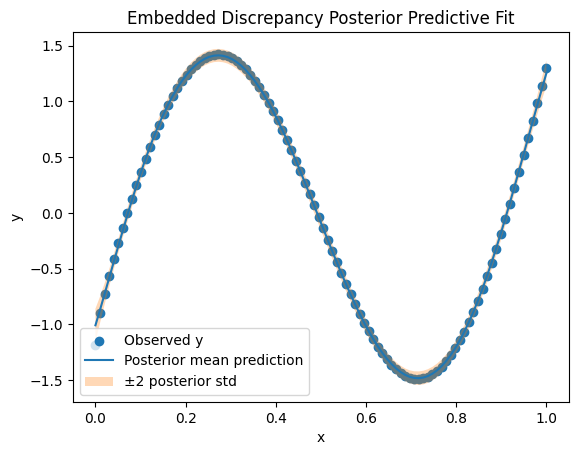

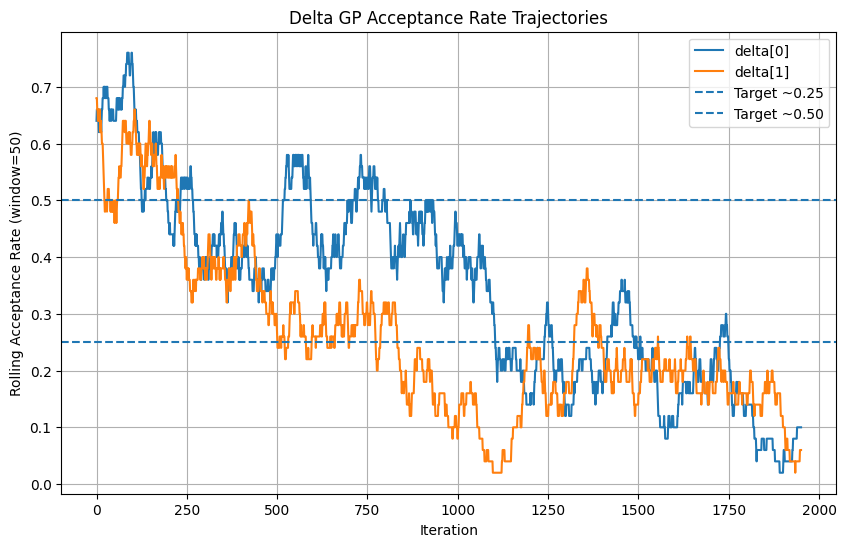

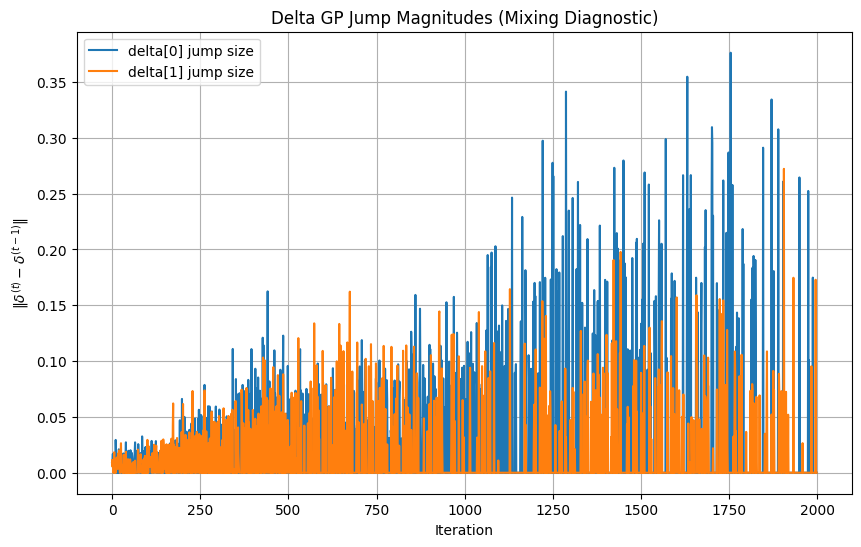

[I 2026-04-07 17:44:20,711] Trial 44 finished with value: 0.8646425836473596 and parameters: {'ell_delta': 0.12364219326200326, 'var_delta': 0.0002653295043824828, 'ell_eta': 0.12086856559038976, 'var_eta': 0.05668828295295389, 'sigma2': 4.285030499603106e-05}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.800, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 20, k=1: acc=0.550, scale=0.1010
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1010
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.011663207011145597
 delta acceptance rates: [0.72 0.6 ]
 ell_delta: [0.20240429 0.29191757]
 var_delta: [0.00029633 0.00079367]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1051
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1051
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1038
[ADAPT] Updated mh_scale_delta fo

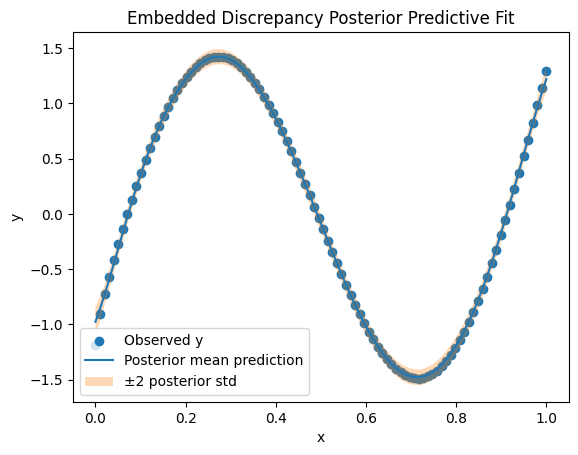

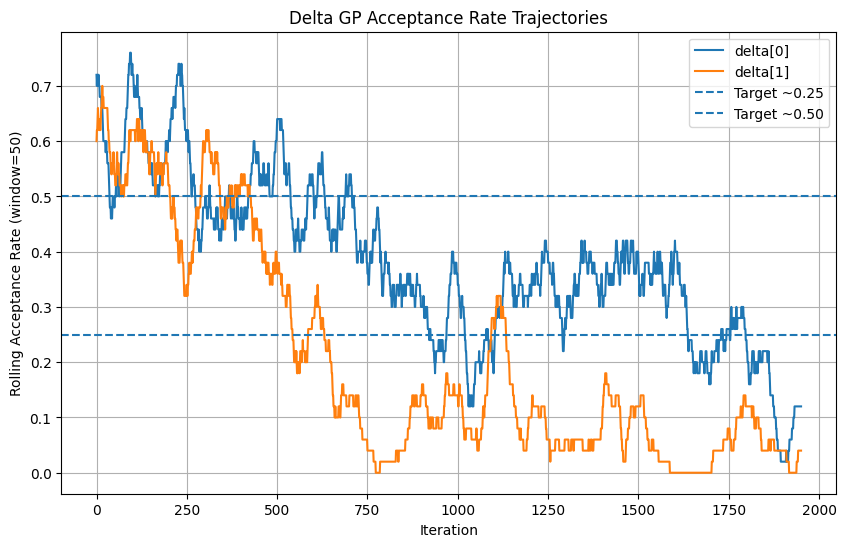

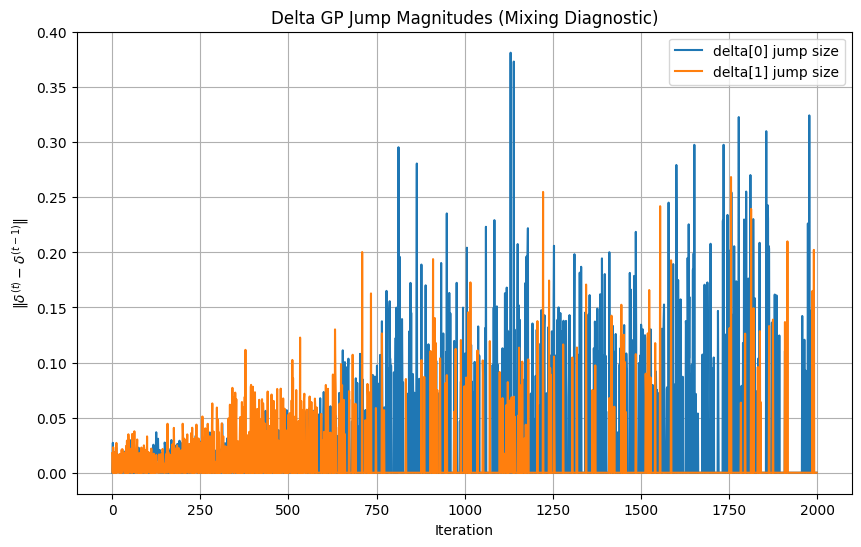

[I 2026-04-07 17:51:30,967] Trial 45 finished with value: 0.9247205460398245 and parameters: {'ell_delta': 0.1670370955638262, 'var_delta': 0.00044644813741808825, 'ell_eta': 0.08610624927662103, 'var_eta': 0.03387240910832747, 'sigma2': 0.0003439094631566796}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 19 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.500, scale=0.1008
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1008
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.650, scale=0.1023
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1023
[ADAPT] Iter 40, k=1: acc=0.650, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.014044598847125929
 delta acceptance rates: [0.62 0.68]
 ell_delta: [0.20547201 0.17778123]
 var_delta: [0.00019929 0.00016199]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.700, scale=0.1041
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1041
[ADAPT] Iter 60, k=1: acc=0.650, scale=0.1046
[ADAPT] Updated mh_scale_delta fo

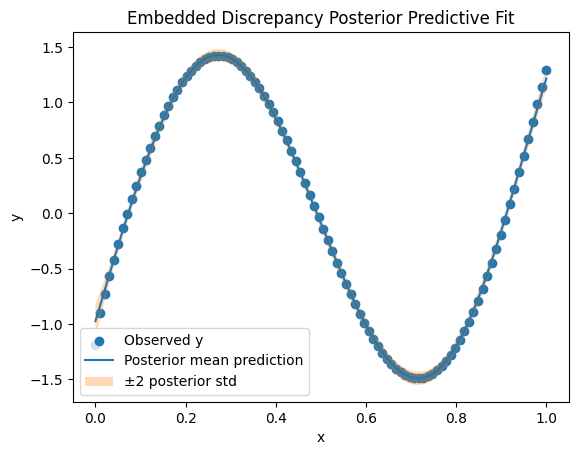

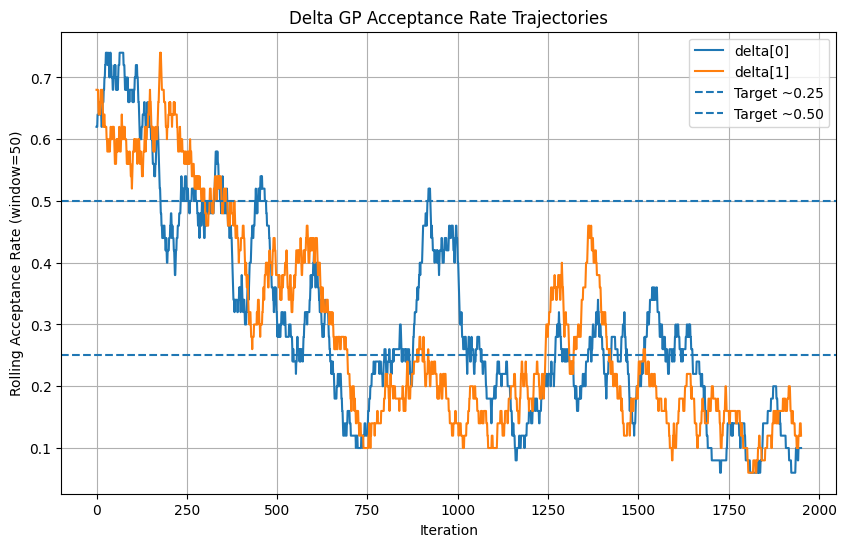

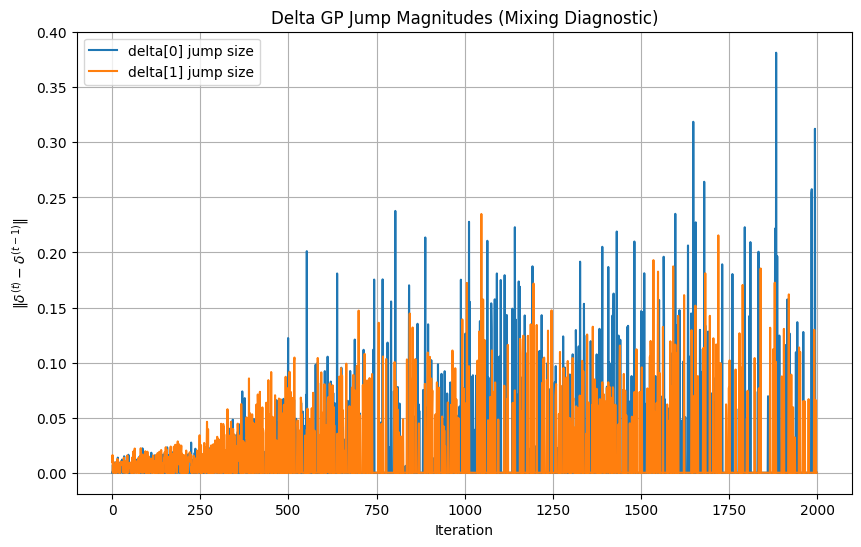

[I 2026-04-07 17:58:51,006] Trial 46 finished with value: 0.8169482499834955 and parameters: {'ell_delta': 0.14444970637252647, 'var_delta': 0.00013880695375227228, 'ell_eta': 0.2633019988811991, 'var_eta': 0.06734399841595254, 'sigma2': 9.837454202812112e-05}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 16 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.650, scale=0.1015
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1015
[ADAPT] Iter 40, k=0: acc=0.750, scale=0.1033
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1033
[ADAPT] Iter 40, k=1: acc=0.550, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1025
Iter 50/2000
 sigma2 = 0.06371467932110872
 delta acceptance rates: [0.68 0.6 ]
 ell_delta: [0.28168096 0.20234638]
 var_delta: [0.00026721 0.00024348]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.750, scale=0.1054
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1054
[ADAPT] Iter 60, k=1: acc=0.600, scale=0.1038
[ADAPT] Updated mh_scale_delta for

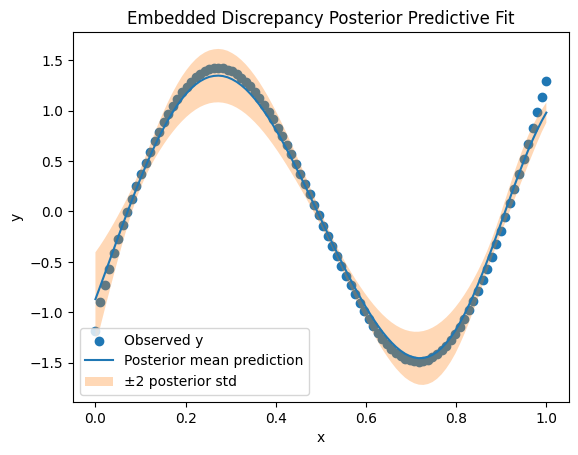

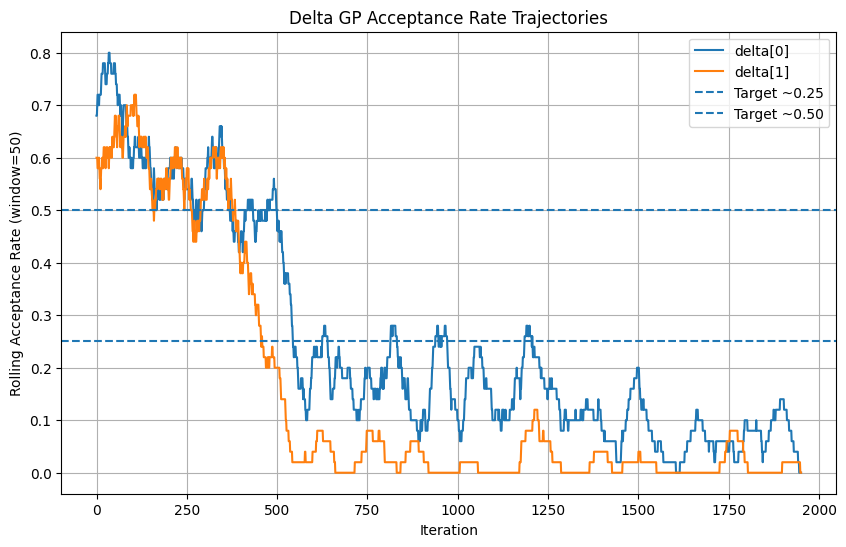

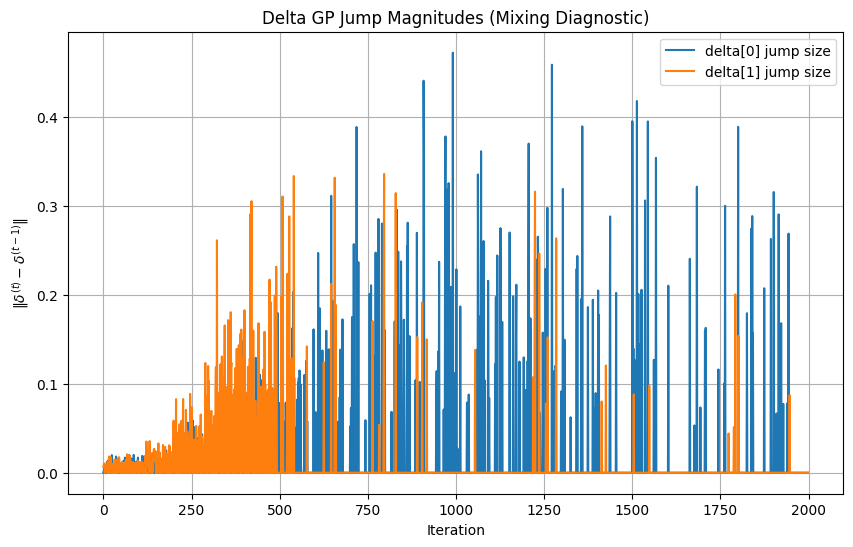

[I 2026-04-07 18:11:50,540] Trial 47 finished with value: 0.9073991542626115 and parameters: {'ell_delta': 0.15061863036449125, 'var_delta': 0.00012401119669548863, 'ell_eta': 0.2774387657793025, 'var_eta': 0.0022948073544959025, 'sigma2': 0.00011788589747406821}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1013
[ADAPT] Iter 40, k=0: acc=0.700, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1030
[ADAPT] Iter 40, k=1: acc=0.500, scale=0.1020
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1020
Iter 50/2000
 sigma2 = 0.014946673874386768
 delta acceptance rates: [0.68 0.56]
 ell_delta: [0.29592401 0.42467427]
 var_delta: [0.00020429 0.00034119]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.900, scale=0.1059
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1059
[ADAPT] Iter 60, k=1: acc=0.750, scale=0.1041
[ADAPT] Updated mh_scale_delta fo

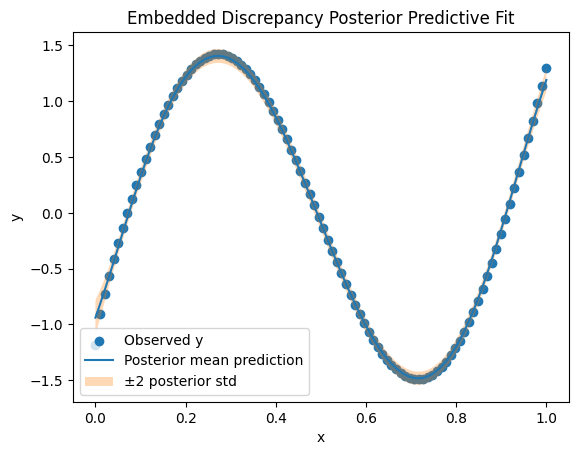

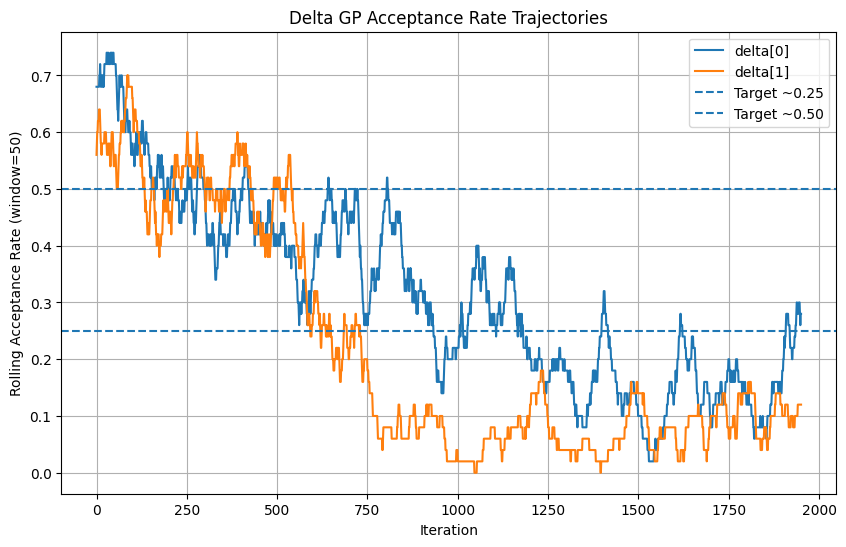

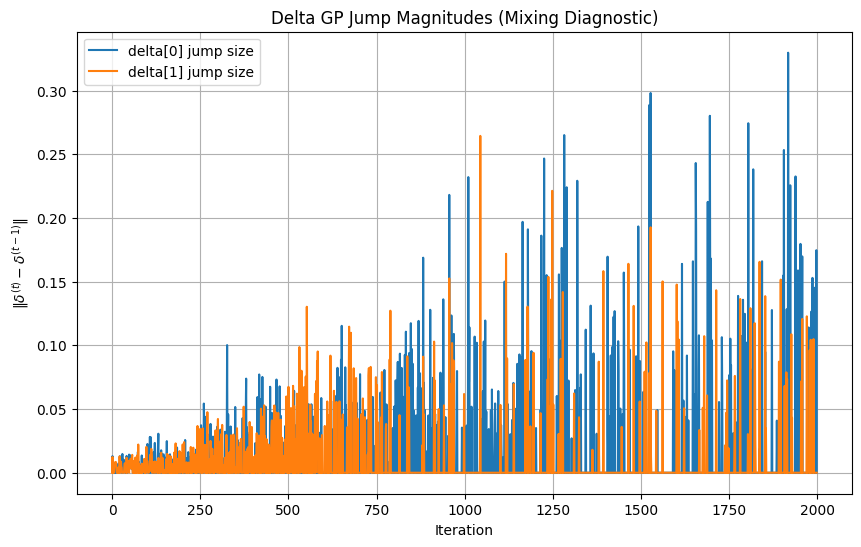

[I 2026-04-07 18:27:31,049] Trial 48 finished with value: 0.8316347370015137 and parameters: {'ell_delta': 0.2632767086412099, 'var_delta': 0.00014511303039444937, 'ell_eta': 0.11466286614701389, 'var_eta': 0.01851496123088318, 'sigma2': 2.9326512540738858e-05}. Best is trial 38 with value: 0.7495685836154033.


Simulator design shape: (500, 1) (500, 2)
Observation shape: (100, 1) (100,)


/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/_gpr.py:670: ConvergenceWarning: lbfgs failed to converge after 38 iteration(s) (status=2):
ABNORMAL: 

You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/home/liammyhill/gitLocal/lmyhill/integratedDelta_fullDiscrepancy/venv/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:450: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(



Trained emulator kernel:
10**2 * RBF(length_scale=[0.338, 10.5, 7.5])

Fixed theta used:
[0.50007692 0.49947505]
Initial MH scale for delta[0] = 0.1000
Initial MH scale for delta[1] = 0.1000

Running embedded δ-MH sampler...

[ADAPT] Iter 20, k=0: acc=0.600, scale=0.1013
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1013
[ADAPT] Iter 20, k=1: acc=0.700, scale=0.1018
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1018
[ADAPT] Iter 40, k=0: acc=0.600, scale=0.1025
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1025
[ADAPT] Iter 40, k=1: acc=0.600, scale=0.1030
[ADAPT] Updated mh_scale_delta for theta_1 = 0.1030
Iter 50/2000
 sigma2 = 0.011834976277486656
 delta acceptance rates: [0.6  0.62]
 ell_delta: [0.10968429 0.13131132]
 var_delta: [0.00027203 0.00029025]
--------------------------------------------------
[ADAPT] Iter 60, k=0: acc=0.550, scale=0.1036
[ADAPT] Updated mh_scale_delta for theta_0 = 0.1036
[ADAPT] Iter 60, k=1: acc=0.400, scale=0.1033
[ADAPT] Updated mh_scale_delta fo

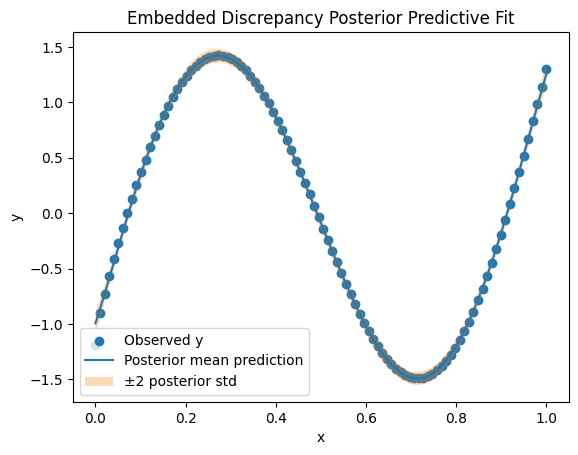

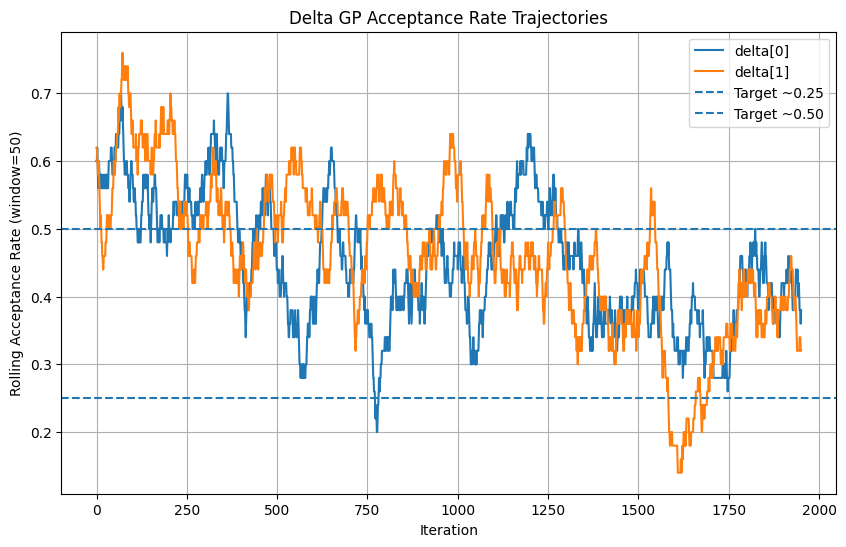

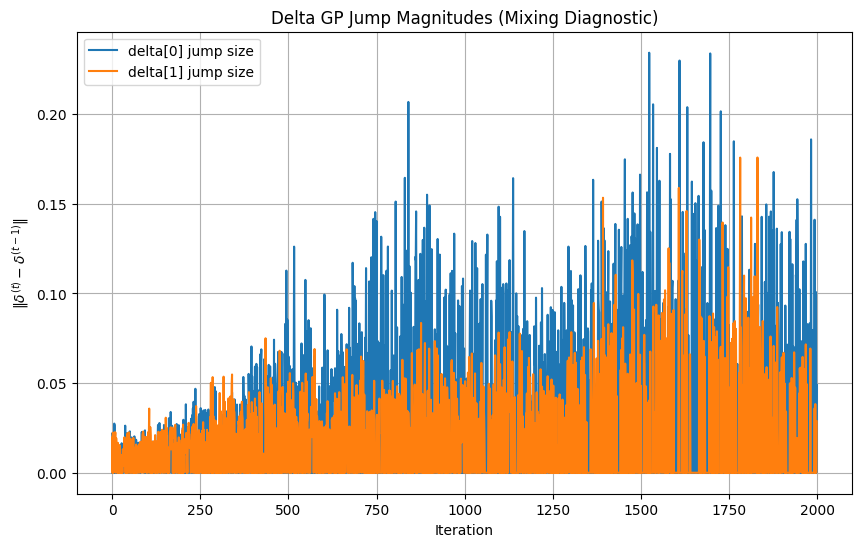

[I 2026-04-07 18:44:30,639] Trial 49 finished with value: 0.851211632094153 and parameters: {'ell_delta': 0.09252993151366605, 'var_delta': 0.0002966868123686604, 'ell_eta': 0.16901887602154655, 'var_eta': 0.09962259110544823, 'sigma2': 0.00021593179853086916}. Best is trial 38 with value: 0.7495685836154033.


Best parameters:
{'ell_delta': 0.09624326691497613, 'var_delta': 0.00024488153504940427, 'ell_eta': 0.18409246287654588, 'var_eta': 0.05458619034494637, 'sigma2': 0.00029991120819806326}
Best loss: 0.7495685836154033


In [25]:
study = optuna.create_study(direction="minimize")

study.optimize(objective, n_trials=50)

print("Best parameters:")
print(study.best_params)

print("Best loss:", study.best_value)